### 1. Sommario dei dati utilizzati    


In [1]:
import quandl
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sn
import pandas_datareader.data as web
import datetime as dt

style.use('ggplot')

#azioni ford da 2011-11-30 a 2021-11-30 con sensibilità mensile
start = dt.datetime(2011, 11, 30)
end = dt.datetime(2021,11,30)
ticker = 'F'
ford = web.DataReader(ticker, 'yahoo', start, end)
ford = ford.groupby(pd.Grouper(freq='M')).mean()
ford.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,10.600000,10.1700,10.330000,10.600000,6.692230e+07,7.065885
2011-12-31,10.852381,10.5000,10.700476,10.674286,4.773234e+07,7.115403
2012-01-31,12.292500,11.9365,12.089500,12.163000,6.324036e+07,8.112599
2012-02-29,12.674000,12.4000,12.562500,12.522500,4.492407e+07,8.380170
2012-03-31,12.627727,12.3900,12.513182,12.505000,4.378027e+07,8.368460


In [2]:

data = pd.DataFrame()

tickers = ['F']

for item in tickers:
    data[item] = web.DataReader(item, data_source='yahoo', start=start)['Adj Close']

data.head()

,F
Date,
2011-11-30,7.065886
2011-12-01,7.059218
2011-12-02,7.265864
2011-12-05,7.405847
2011-12-06,7.365852


In [3]:
#azioni tesla da 2011-11-30 a 2021-11-30 con sensibilità mensile
ticker = 'TSLA'
tesla = web.DataReader(ticker, 'yahoo', start, end)
tesla = tesla.groupby(pd.Grouper(freq='M')).mean()
tesla.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,6.586000,6.444000,6.500000,6.548000,3.801500e+06,6.548000
2011-12-31,6.114762,5.876000,6.004667,5.996000,5.030595e+06,5.996000
2012-01-31,5.654100,5.391900,5.551200,5.498000,6.402475e+06,5.498000
2012-02-29,6.641700,6.363500,6.502900,6.552400,5.798400e+06,6.552400
2012-03-31,7.156818,6.916455,7.027000,7.048182,5.037159e+06,7.048182


In [4]:
#azioni coca cola da 2011-11-30 a 2021-11-30 con sensibilità mensile
ticker = 'KO'
coca = web.DataReader(ticker, 'yahoo', start, end)
coca = coca.groupby(pd.Grouper(freq='M')).mean()
coca.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,33.980000,33.360001,33.669998,33.615002,2.530040e+07,24.213419
2011-12-31,34.161905,33.748571,33.925952,33.934048,1.474077e+07,24.443233
2012-01-31,34.329000,33.961750,34.203751,34.120250,1.501158e+07,24.577358
2012-02-29,34.453500,34.115499,34.278250,34.300500,1.438325e+07,24.707195
2012-03-31,35.439318,35.107954,35.204546,35.334546,1.864775e+07,25.571952


In [5]:
#azioni mc donald's da 2011-11-30 a 2021-11-30 con sensibilità mensile
ticker = 'MCD'
mc = web.DataReader(ticker, 'yahoo', start, end)
mc = mc.groupby(pd.Grouper(freq='M')).mean()
mc.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,95.540001,94.639999,94.849998,95.519997,7.683300e+06,71.149567
2011-12-31,98.647619,97.494286,98.075238,98.045714,5.261938e+06,73.030869
2012-01-31,100.593000,99.310000,100.113500,99.925000,6.017590e+06,74.430685
2012-02-29,100.210000,99.298500,99.777000,99.785001,4.446675e+06,74.378476
2012-03-31,98.152273,97.265909,97.640454,97.707728,6.200891e+06,73.290309


In [6]:
#azioni amazon da 2011-11-30 a 2021-11-30 con sensibilità mensile
ticker = 'AMZN'
amazon = web.DataReader(ticker, 'yahoo', start, end)
amazon = amazon.groupby(pd.Grouper(freq='M')).mean()
amazon.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,9.765000,9.437500,9.738000,9.614500,1.543400e+08,9.614500
2011-12-31,9.348905,9.057405,9.237262,9.196690,1.196145e+08,9.196690
2012-01-31,9.353475,9.095725,9.210925,9.251400,1.105369e+08,9.251400
2012-02-29,9.251275,9.005150,9.124450,9.162150,1.465804e+08,9.162150
2012-03-31,9.570545,9.337523,9.417159,9.476705,1.027046e+08,9.476705


In [7]:
#azioni google da 2011-11-30 a 2021-11-30 con sensibilità mensile
ticker = 'GOOG'
google = web.DataReader(ticker, 'yahoo', start, end)
google = google.groupby(pd.Grouper(freq='M')).mean()
google.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-11-30,298.635651,294.939484,297.858551,298.575867,6.819466e+06,298.575867
2011-12-31,314.558101,310.169314,311.973745,312.497967,5.262270e+06,312.497967
2012-01-31,308.947488,303.780360,307.354213,306.296425,7.391863e+06,306.296425
2012-02-29,303.621207,299.525804,301.352956,302.066031,4.754213e+06,302.066031
2012-03-31,314.781711,309.808986,312.103342,312.464942,4.318873e+06,312.464942


In [8]:
pip install quandl

Note: you may need to restart the kernel to use updated packages.


statistiche dei titoli

In [9]:
#coca cola
coca.describe()

,High,Low,Open,Close,Volume,Adj Close
count,121.000000,121.000000,121.000000,121.000000,1.210000e+02,121.000000
mean,44.690754,44.112078,44.403978,44.403696,1.430425e+07,37.608299
std,5.734220,5.632338,5.687728,5.678745,3.472158e+06,8.166129
min,33.980000,33.360001,33.669998,33.615002,8.743718e+06,24.213419
25%,40.829500,40.311429,40.548182,40.572273,1.206785e+07,31.298487
50%,43.439474,42.894211,43.113000,43.206316,1.365984e+07,36.258493
75%,47.520526,46.901579,47.209473,47.219524,1.578355e+07,43.308416
max,59.192106,58.301053,58.793158,58.652632,3.151999e+07,54.881559


In [10]:
print('size: ' + str(coca.size))
print('shape: ' + str(coca.shape))


size: 726
shape: (121, 6)


In [11]:
#mc donalds
mc.describe()

,High,Low,Open,Close,Volume,Adj Close
count,121.000000,121.000000,121.000000,121.000000,1.210000e+02,121.000000
mean,144.684062,142.675426,143.677597,143.697154,4.631379e+06,127.880486
std,50.179555,49.288162,49.755260,49.729584,1.533751e+06,54.197222
min,86.418571,85.433333,85.932857,85.910476,2.055000e+06,65.513370
25%,98.023000,96.920909,97.507273,97.599091,3.378747e+06,77.224386
50%,123.458001,122.050500,122.795500,122.804500,4.416414e+06,106.608476
75%,185.027143,182.360001,183.539524,183.952381,5.642386e+06,170.703948
max,253.555238,250.181428,251.909047,252.036667,8.615884e+06,247.950155


In [12]:
google.describe()

,High,Low,Open,Close,Volume,Adj Close
count,121.000000,121.000000,121.000000,121.000000,1.210000e+02,121.000000
mean,968.111583,950.648403,959.237279,959.746671,2.436360e+06,959.746671
std,612.146657,600.964060,606.101386,606.807757,1.478561e+06,606.807757
min,286.525792,281.694618,284.581889,284.246951,8.461636e+05,284.246951
25%,540.111910,530.943141,535.470502,536.519088,1.471091e+06,536.519088
50%,787.089620,776.667524,782.312863,782.171422,1.756755e+06,782.171422
75%,1192.324407,1167.521519,1181.301819,1180.686812,3.055692e+06,1180.686812
max,2979.854736,2927.673340,2957.534889,2948.650484,7.391863e+06,2948.650484


In [13]:
amazon.describe()

,High,Low,Open,Close,Volume,Adj Close
count,121.000000,121.000000,121.000000,121.000000,1.210000e+02,121.000000
mean,61.061170,59.745754,60.438129,60.419474,8.235998e+07,60.419474
std,52.569330,51.386456,51.999889,51.972118,2.590800e+07,51.972118
min,9.251275,9.005150,9.124450,9.162150,3.979445e+07,9.162150
25%,16.446783,16.073044,16.263370,16.298718,6.510500e+07,16.298718
50%,39.654738,39.124786,39.320405,39.448262,7.552453e+07,39.448262
75%,90.615975,88.911705,89.981543,89.680137,9.081050e+07,89.680137
max,182.370858,178.751403,180.635571,180.800310,1.629607e+08,180.800310


In [14]:
tesla.describe()

,High,Low,Open,Close,Volume,Adj Close
count,121.000000,121.000000,121.000000,121.000000,1.210000e+02,121.000000
mean,134.120560,128.451358,131.319651,131.480338,3.464398e+07,131.480338
std,228.056464,218.178105,223.121363,223.545809,2.201112e+07,223.545809
min,5.654100,5.391900,5.551200,5.498000,3.801500e+06,5.498000
25%,40.595429,39.149238,39.780000,39.934857,2.135475e+07,39.934857
50%,49.882000,47.747239,48.756667,48.910095,3.077647e+07,48.910095
75%,68.568285,66.777900,67.761400,67.716666,4.477868e+07,67.716666
max,1148.589042,1086.110000,1117.766666,1120.662383,1.243649e+08,1120.662383


In [15]:
ford.describe()

,High,Low,Open,Close,Volume,Adj Close
count,121.000000,121.000000,121.000000,121.000000,1.210000e+02,121.000000
mean,12.285013,12.020679,12.160592,12.154848,4.548378e+07,9.733807
std,2.994027,2.962552,2.980071,2.980416,1.954555e+07,2.100576
min,5.093810,4.820476,4.979048,4.921905,2.004023e+07,4.839994
25%,10.216818,9.995455,10.101818,10.084091,3.297226e+07,8.429635
50%,12.310435,12.097727,12.241304,12.202273,3.973994e+07,9.739790
75%,14.550000,14.329000,14.438500,14.425500,5.107249e+07,10.824468
max,19.840953,19.063333,19.478571,19.527619,1.192198e+08,19.240007


In [16]:
#controllo che non ci sono valori nulli nei file scaricati da yahoo
google.isnull().sum()

High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [17]:
#controllo che non ci sono valori nulli nel file GOOG scaricato da yahoo
amazon.isnull().sum()

High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [18]:
#controllo che non ci sono valori nulli nel file GOOG scaricato da yahoo
ford.isnull().sum()

High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [19]:
#controllo che non ci sono valori nulli nel file GOOG scaricato da yahoo
tesla.isnull().sum()

High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [20]:
#controllo che non ci sono valori nulli nel file GOOG scaricato da yahoo
mc.isnull().sum()

High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [21]:
#controllo che non ci sono valori nulli nel file GOOG scaricato da yahoo
coca.isnull().sum()

High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
dtype: int64

## 1.c creazione dataframe unico

In [22]:
#creazione df unico per velocizzare visualizzazione dei rendimenti e prezzo in chiusura
#azioni affini google e amazon
df1 = google.join(amazon, lsuffix = "_GOOG", rsuffix = "_AMZN")
df1.tail()

,High_GOOG,Low_GOOG,Open_GOOG,Close_GOOG,Volume_GOOG,Adj Close_GOOG,High_AMZN,Low_AMZN,Open_AMZN,Close_AMZN,Volume_AMZN,Adj Close_AMZN
Date,,,,,,,,,,,,
2021-07-31,2663.623175,2624.577474,2641.907482,2646.785703,1.087562e+06,2646.785703,182.370858,178.751403,180.635571,180.800310,7.974219e+07,180.800310
2021-08-31,2797.319192,2762.866777,2776.401367,2786.406827,8.461636e+05,2786.406827,166.746932,164.165000,165.538045,165.645887,5.713473e+07,165.645887
2021-09-30,2864.327648,2819.896775,2847.702753,2837.638091,1.202852e+06,2837.638091,172.913738,170.028642,171.622096,171.359143,5.955019e+07,171.359143
2021-10-31,2830.741815,2775.309384,2799.425258,2808.973819,1.182314e+06,2808.973819,168.153596,165.116667,166.418428,166.710310,6.064124e+07,166.710310
2021-11-30,2979.854736,2927.673340,2957.534889,2948.650484,1.055171e+06,2948.650484,178.610407,173.987429,175.929190,175.880928,7.219000e+07,175.880928


In [23]:
#mi serve per il punto6
df_date=ford.drop(columns=['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'])
df_date.head()

""
Date
2011-11-30
2011-12-31
2012-01-31
2012-02-29
2012-03-31


In [24]:
#azioni affini coca cola e mc donalds
df2 = coca.join(mc, lsuffix = '_KO', rsuffix = '_MCD')
df2.head()

,High_KO,Low_KO,Open_KO,Close_KO,Volume_KO,Adj Close_KO,High_MCD,Low_MCD,Open_MCD,Close_MCD,Volume_MCD,Adj Close_MCD
Date,,,,,,,,,,,,
2011-11-30,33.980000,33.360001,33.669998,33.615002,2.530040e+07,24.213419,95.540001,94.639999,94.849998,95.519997,7.683300e+06,71.149567
2011-12-31,34.161905,33.748571,33.925952,33.934048,1.474077e+07,24.443233,98.647619,97.494286,98.075238,98.045714,5.261938e+06,73.030869
2012-01-31,34.329000,33.961750,34.203751,34.120250,1.501158e+07,24.577358,100.593000,99.310000,100.113500,99.925000,6.017590e+06,74.430685
2012-02-29,34.453500,34.115499,34.278250,34.300500,1.438325e+07,24.707195,100.210000,99.298500,99.777000,99.785001,4.446675e+06,74.378476
2012-03-31,35.439318,35.107954,35.204546,35.334546,1.864775e+07,25.571952,98.152273,97.265909,97.640454,97.707728,6.200891e+06,73.290309


In [25]:
#azioni affini, tesla e ford
df3 = tesla.join(ford, lsuffix = '_TSLA', rsuffix = '_FORD')
df3.head()

,High_TSLA,Low_TSLA,Open_TSLA,Close_TSLA,Volume_TSLA,Adj Close_TSLA,High_FORD,Low_FORD,Open_FORD,Close_FORD,Volume_FORD,Adj Close_FORD
Date,,,,,,,,,,,,
2011-11-30,6.586000,6.444000,6.500000,6.548000,3.801500e+06,6.548000,10.600000,10.1700,10.330000,10.600000,6.692230e+07,7.065885
2011-12-31,6.114762,5.876000,6.004667,5.996000,5.030595e+06,5.996000,10.852381,10.5000,10.700476,10.674286,4.773234e+07,7.115403
2012-01-31,5.654100,5.391900,5.551200,5.498000,6.402475e+06,5.498000,12.292500,11.9365,12.089500,12.163000,6.324036e+07,8.112599
2012-02-29,6.641700,6.363500,6.502900,6.552400,5.798400e+06,6.552400,12.674000,12.4000,12.562500,12.522500,4.492407e+07,8.380170
2012-03-31,7.156818,6.916455,7.027000,7.048182,5.037159e+06,7.048182,12.627727,12.3900,12.513182,12.505000,4.378027e+07,8.368460


In [26]:
#ed ecco il df unico
dfu = df1.join([df2, df3])
dfu.head()

,High_GOOG,Low_GOOG,Open_GOOG,Close_GOOG,Volume_GOOG,Adj Close_GOOG,High_AMZN,Low_AMZN,Open_AMZN,Close_AMZN,...,Open_TSLA,Close_TSLA,Volume_TSLA,Adj Close_TSLA,High_FORD,Low_FORD,Open_FORD,Close_FORD,Volume_FORD,Adj Close_FORD
Date,,,,,,,,,,,,,,,,,,,,,
2011-11-30,298.635651,294.939484,297.858551,298.575867,6.819466e+06,298.575867,9.765000,9.437500,9.738000,9.614500,...,6.500000,6.548000,3.801500e+06,6.548000,10.600000,10.1700,10.330000,10.600000,6.692230e+07,7.065885
2011-12-31,314.558101,310.169314,311.973745,312.497967,5.262270e+06,312.497967,9.348905,9.057405,9.237262,9.196690,...,6.004667,5.996000,5.030595e+06,5.996000,10.852381,10.5000,10.700476,10.674286,4.773234e+07,7.115403
2012-01-31,308.947488,303.780360,307.354213,306.296425,7.391863e+06,306.296425,9.353475,9.095725,9.210925,9.251400,...,5.551200,5.498000,6.402475e+06,5.498000,12.292500,11.9365,12.089500,12.163000,6.324036e+07,8.112599
2012-02-29,303.621207,299.525804,301.352956,302.066031,4.754213e+06,302.066031,9.251275,9.005150,9.124450,9.162150,...,6.502900,6.552400,5.798400e+06,6.552400,12.674000,12.4000,12.562500,12.522500,4.492407e+07,8.380170
2012-03-31,314.781711,309.808986,312.103342,312.464942,4.318873e+06,312.464942,9.570545,9.337523,9.417159,9.476705,...,7.027000,7.048182,5.037159e+06,7.048182,12.627727,12.3900,12.513182,12.505000,4.378027e+07,8.368460


In [27]:
#controllo che non ci sono valori nulli nel dataframe finale
dfu.isnull().sum()

High_GOOG         0
Low_GOOG          0
Open_GOOG         0
Close_GOOG        0
Volume_GOOG       0
Adj Close_GOOG    0
High_AMZN         0
Low_AMZN          0
Open_AMZN         0
Close_AMZN        0
Volume_AMZN       0
Adj Close_AMZN    0
High_KO           0
Low_KO            0
Open_KO           0
Close_KO          0
Volume_KO         0
Adj Close_KO      0
High_MCD          0
Low_MCD           0
Open_MCD          0
Close_MCD         0
Volume_MCD        0
Adj Close_MCD     0
High_TSLA         0
Low_TSLA          0
Open_TSLA         0
Close_TSLA        0
Volume_TSLA       0
Adj Close_TSLA    0
High_FORD         0
Low_FORD          0
Open_FORD         0
Close_FORD        0
Volume_FORD       0
Adj Close_FORD    0
dtype: int64

In [28]:
#considero solo gli adj close
dfunico = dfu[["Adj Close_GOOG", "Adj Close_AMZN", "Adj Close_TSLA","Adj Close_FORD","Adj Close_KO","Adj Close_MCD"]]
dfunico

,Adj Close_GOOG,Adj Close_AMZN,Adj Close_TSLA,Adj Close_FORD,Adj Close_KO,Adj Close_MCD
Date,,,,,,
2011-11-30,298.575867,9.614500,6.548000,7.065885,24.213419,71.149567
2011-12-31,312.497967,9.196690,5.996000,7.115403,24.443233,73.030869
2012-01-31,306.296425,9.251400,5.498000,8.112599,24.577358,74.430685
2012-02-29,302.066031,9.162150,6.552400,8.380170,24.707195,74.378476
2012-03-31,312.464942,9.476705,7.048182,8.368460,25.571952,73.290309
...,...,...,...,...,...,...
2021-07-31,2646.785703,180.800310,659.134760,13.914046,54.075997,232.072091
2021-08-31,2786.406827,165.645887,705.243172,13.128275,54.881559,232.337126
2021-09-30,2837.638091,171.359143,753.952381,13.096923,53.525064,237.436832


## 1. d Presentazione dei dati

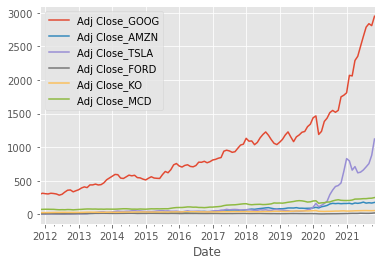

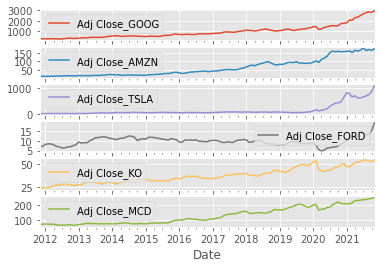

In [29]:
#mostro i grafici degli adj close
dfunico.plot(grid = True);
dfunico.plot(subplots = True, grid = True);

In [30]:
#prime righe del dataframe:
dfu.head()

,High_GOOG,Low_GOOG,Open_GOOG,Close_GOOG,Volume_GOOG,Adj Close_GOOG,High_AMZN,Low_AMZN,Open_AMZN,Close_AMZN,...,Open_TSLA,Close_TSLA,Volume_TSLA,Adj Close_TSLA,High_FORD,Low_FORD,Open_FORD,Close_FORD,Volume_FORD,Adj Close_FORD
Date,,,,,,,,,,,,,,,,,,,,,
2011-11-30,298.635651,294.939484,297.858551,298.575867,6.819466e+06,298.575867,9.765000,9.437500,9.738000,9.614500,...,6.500000,6.548000,3.801500e+06,6.548000,10.600000,10.1700,10.330000,10.600000,6.692230e+07,7.065885
2011-12-31,314.558101,310.169314,311.973745,312.497967,5.262270e+06,312.497967,9.348905,9.057405,9.237262,9.196690,...,6.004667,5.996000,5.030595e+06,5.996000,10.852381,10.5000,10.700476,10.674286,4.773234e+07,7.115403
2012-01-31,308.947488,303.780360,307.354213,306.296425,7.391863e+06,306.296425,9.353475,9.095725,9.210925,9.251400,...,5.551200,5.498000,6.402475e+06,5.498000,12.292500,11.9365,12.089500,12.163000,6.324036e+07,8.112599
2012-02-29,303.621207,299.525804,301.352956,302.066031,4.754213e+06,302.066031,9.251275,9.005150,9.124450,9.162150,...,6.502900,6.552400,5.798400e+06,6.552400,12.674000,12.4000,12.562500,12.522500,4.492407e+07,8.380170
2012-03-31,314.781711,309.808986,312.103342,312.464942,4.318873e+06,312.464942,9.570545,9.337523,9.417159,9.476705,...,7.027000,7.048182,5.037159e+06,7.048182,12.627727,12.3900,12.513182,12.505000,4.378027e+07,8.368460


In [31]:
#prime righe del dataframe che contiene solo gli adj close dei titoli
dfunico.head()

,Adj Close_GOOG,Adj Close_AMZN,Adj Close_TSLA,Adj Close_FORD,Adj Close_KO,Adj Close_MCD
Date,,,,,,
2011-11-30,298.575867,9.614500,6.548000,7.065885,24.213419,71.149567
2011-12-31,312.497967,9.196690,5.996000,7.115403,24.443233,73.030869
2012-01-31,306.296425,9.251400,5.498000,8.112599,24.577358,74.430685
2012-02-29,302.066031,9.162150,6.552400,8.380170,24.707195,74.378476
2012-03-31,312.464942,9.476705,7.048182,8.368460,25.571952,73.290309


# 2) STATISTICHE DESCRITTIVE
 ## a) Rendimenti semplici e composti


In [32]:
#creo un df coi close 
dfua = dfu[['Close_GOOG','Close_AMZN','Close_TSLA','Close_FORD','Close_MCD','Close_KO']]

In [33]:
#calcolo i rendimenti semplici di amazon
AMZN_rends = amazon['Adj Close'].pct_change()
AMZN_rends.head()

Date
2011-11-30         NaN
2011-12-31   -0.043456
2012-01-31    0.005949
2012-02-29   -0.009647
2012-03-31    0.034332
Freq: M, Name: Adj Close, dtype: float64

In [34]:
#calcolo i rendimenti composti di amazon
AMZN_rendc = np.cumprod(1+AMZN_rends)
AMZN_rendc.head()

Date
2011-11-30         NaN
2011-12-31    0.956544
2012-01-31    0.962234
2012-02-29    0.952951
2012-03-31    0.985668
Freq: M, Name: Adj Close, dtype: float64

In [35]:
GOOG_rends = google['Adj Close'].pct_change()
TSLA_rends = tesla['Adj Close'].pct_change()
MCD_rends = mc['Adj Close'].pct_change()
FORD_rends = ford['Adj Close'].pct_change()
KO_rends = coca['Adj Close'].pct_change()

GOOG_rendc = np.cumprod(1+GOOG_rends)
TSLA_rendc = np.cumprod(1+TSLA_rends)
MCD_rendc = np.cumprod(1+MCD_rends)
FORD_rendc = np.cumprod(1+FORD_rends)
KO_rendc = np.cumprod(1+KO_rends)
type(GOOG_rends)

pandas.core.series.Series

In [36]:
GOOG_rends.dropna(inplace = True)
AMZN_rends.dropna(inplace = True)
GOOG_rends = GOOG_rends.to_frame()
AMZN_rends = AMZN_rends.to_frame()
v11 = AMZN_rends.join(GOOG_rends, lsuffix = '_AMZN', rsuffix = '_GOOG')
v11.columns = ["AMZN_rends", "GOOG_rends"]

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

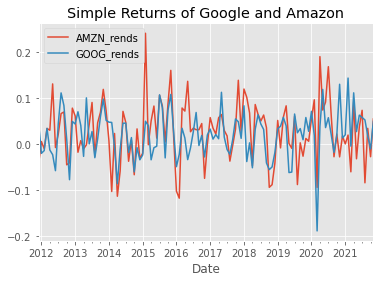

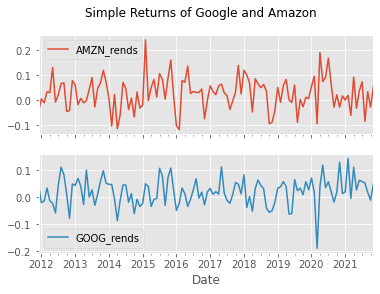

In [37]:
#grafici dei ritorni semplici dei titoli affini google e amazon
v11.plot(grid = True, title = "Simple Returns of Google and Amazon")
v11.plot(grid = True, subplots = True, title = "Simple Returns of Google and Amazon")

In [38]:
TSLA_rends.dropna(inplace = True)
FORD_rends.dropna(inplace = True)
TSLA_rends = TSLA_rends.to_frame()
FORD_rends = FORD_rends.to_frame()
v1 = TSLA_rends.join(FORD_rends, lsuffix = '_TSLA', rsuffix = '_FORD')
v1.columns = ["TSLA_rends", "FORD_rends"]

MCD_rends.dropna(inplace = True)
KO_rends.dropna(inplace = True)
MCD_rends = MCD_rends.to_frame()
KO_rends = KO_rends.to_frame()
v2 = MCD_rends.join(KO_rends, lsuffix = '_MCD', rsuffix = '_KO')
v2.columns = ["MCD_rends", "KO_rends"]

TSLA_rendc = TSLA_rendc.to_frame()
FORD_rendc = FORD_rendc.to_frame()
v3 = TSLA_rendc.join(FORD_rendc, lsuffix = '_TSLA', rsuffix = '_FORD')
v3.columns = ["TSLA_rendc", "FORD_rendc"]

GOOG_rendc = GOOG_rendc.to_frame()
AMZN_rendc = AMZN_rendc.to_frame()
v5 = GOOG_rendc.join(AMZN_rendc, lsuffix = '_GOOG', rsuffix = '_AMZN')
v5.columns = ["GOOG_rendc", "AMZN_rendc"]


MCD_rendc = MCD_rendc.to_frame()
KO_rendc = KO_rendc.to_frame()
v4 = MCD_rendc.join(KO_rendc, lsuffix = '_MCD', rsuffix = '_KO')
v4.columns = ["MCD_rendc", "KO_rendc"]

In [39]:
#creo un df unico con tutti i rendimenti
rends_df = v1.join([v2, v11])
rends_df.rename(columns={"Adj Close_GOOG": 'GOOG_rends',  "Adj Close_AMZN":  "AMZN_rends"}, 
                inplace=True)
rends_df.dropna(inplace=True)
rends_df.head()


,TSLA_rends,FORD_rends,MCD_rends,KO_rends,AMZN_rends,GOOG_rends
Date,,,,,,
2011-12-31,-0.084301,0.007008,0.026442,0.009491,-0.043456,0.046628
2012-01-31,-0.083055,0.140146,0.019167,0.005487,0.005949,-0.019845
2012-02-29,0.191779,0.032982,-0.000701,0.005283,-0.009647,-0.013811
2012-03-31,0.075664,-0.001397,-0.014630,0.035000,0.034332,0.034426
2012-04-30,-0.049542,-0.048105,-0.006481,0.046955,0.030377,-0.012501


In [40]:
#dato che poi lo modifico ma mi serve così come è
df_rends=rends_df.copy()

In [41]:
#df contenente i rendimenti composti
rendc_df = v3.join([v5, v4])
rendc_df.rename(columns={"Adj Close_GOOG": 'GOOG_rendc',  "Adj Close_AMZN":  "AMZN_rendc",
                         "Adj Close_TSLA": "TSLA_rendc", "Adj Close_FORD":"FORD_rendc",
                         "Adj Close_MCD":"MCD_rendc",  "Adj Close_KO":"KO_rendc"},
                inplace=True)
rendc_df.dropna(inplace=True) 
rendc_df.head()

,TSLA_rendc,FORD_rendc,GOOG_rendc,AMZN_rendc,MCD_rendc,KO_rendc
Date,,,,,,
2011-12-31,0.915699,1.007008,1.046628,0.956544,1.026442,1.009491
2012-01-31,0.839646,1.148136,1.025858,0.962234,1.046116,1.015030
2012-02-29,1.000672,1.186004,1.011689,0.952951,1.045382,1.020393
2012-03-31,1.076387,1.184347,1.046518,0.985668,1.030088,1.056107
2012-04-30,1.023060,1.127373,1.033436,1.015609,1.023412,1.105696


In [42]:
rends_df.describe()

,TSLA_rends,FORD_rends,MCD_rends,KO_rends,AMZN_rends,GOOG_rends
count,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000
mean,0.054119,0.011329,0.011129,0.007301,0.026528,0.020519
std,0.154079,0.076942,0.036345,0.031387,0.064558,0.050291
min,-0.298886,-0.307438,-0.186207,-0.183507,-0.117195,-0.188317
25%,-0.051894,-0.024712,-0.009927,-0.010082,-0.009762,-0.011698
50%,0.036486,0.004308,0.012107,0.007659,0.030122,0.021218
75%,0.136759,0.052364,0.034424,0.027617,0.066965,0.049572
max,0.760534,0.262065,0.096510,0.079571,0.241118,0.143760


In [43]:
rendc_df.describe()

,TSLA_rendc,FORD_rendc,GOOG_rendc,AMZN_rendc,MCD_rendc,KO_rendc
count,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000
mean,20.238461,1.380724,3.232868,6.328238,1.803992,1.557811
std,34.237683,0.296501,2.030657,5.406425,0.761401,0.334820
min,0.839646,0.684981,0.952009,0.952951,0.920784,1.009491
25%,6.118913,1.198942,1.802029,1.700518,1.089108,1.294457
50%,7.500514,1.379634,2.630187,4.151205,1.513117,1.506187
75%,10.383777,1.537747,3.960175,9.334767,2.403840,1.791388
max,171.145755,2.722944,9.875716,18.804962,3.484914,2.266576


array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

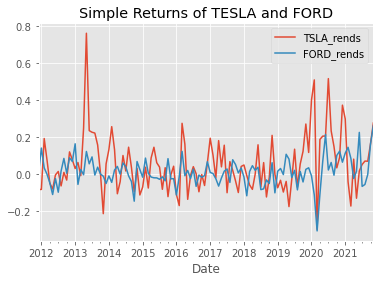

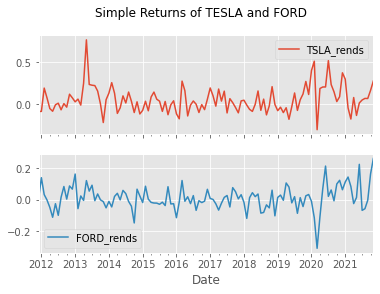

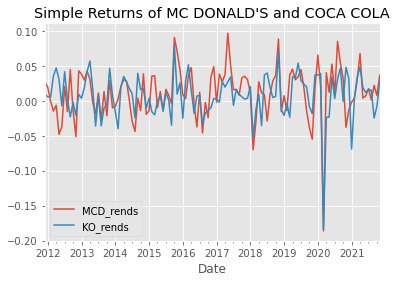

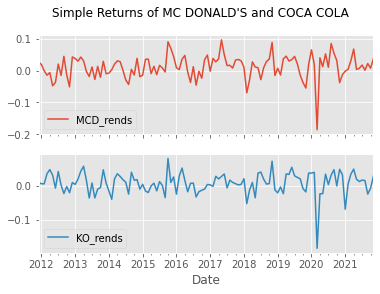

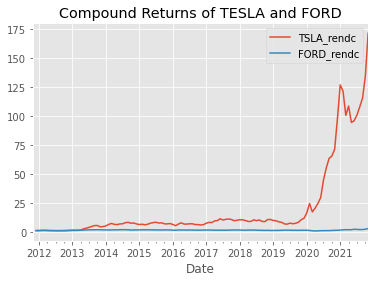

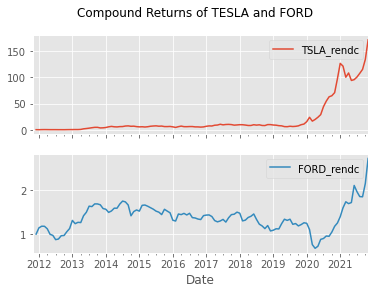

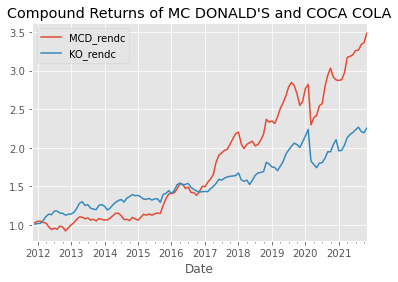

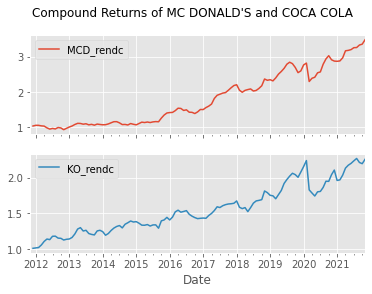

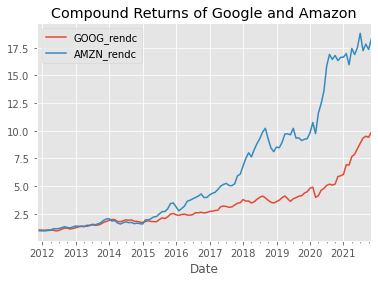

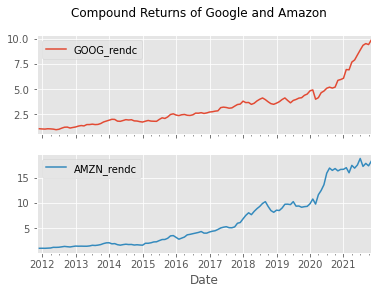

In [44]:
#grafici dei confronti dei rendimenti dei titoli affini

v1.plot(grid = True, title = "Simple Returns of TESLA and FORD")
v1.plot(grid = True, subplots = True, title = "Simple Returns of TESLA and FORD")

v2.plot(grid = True, title = "Simple Returns of MC DONALD'S and COCA COLA")
v2.plot(grid = True, subplots = True, title = "Simple Returns of MC DONALD'S and COCA COLA")

v3.plot(grid = True, title = "Compound Returns of TESLA and FORD")
v3.plot(grid = True, subplots = True, title = "Compound Returns of TESLA and FORD")

v4.plot(grid = True, title = "Compound Returns of MC DONALD'S and COCA COLA")
v4.plot(grid = True, subplots = True, title = "Compound Returns of MC DONALD'S and COCA COLA")

v5.plot(grid = True, title = "Compound Returns of Google and Amazon")
v5.plot(grid = True, subplots = True, title = "Compound Returns of Google and Amazon")

<AxesSubplot:xlabel='Date'>

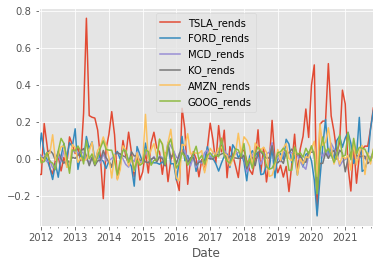

In [45]:
#visualizzazione di tutti i rendimenti semplici
rends_df.plot(grid = True)

<AxesSubplot:xlabel='Date'>

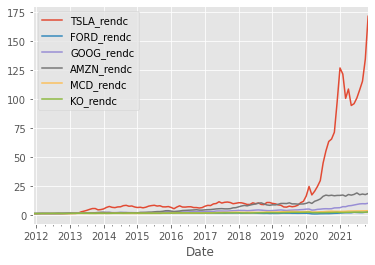

In [46]:
#visualizzazione di tutti i rendimenti composti
rendc_df.plot(grid = True)

## 2b) Commenti
Le serie storiche dei rendimenti semplici oscillano circa nell'intervallo [+0.2, -0.2] tranne TSLA che ha diversi picchi e mostra un comportamento particolare anche nel grafico della serie dei rendimenti composti: a partire dal 2020 sale ripidamente rispetto agli altri titoli.

Tutte le coppie di titoli affini paiono essere correlate positivamente tra loro poichè i grafici dei rendimenti sembrano seguire uno stesso andamento. Se si considerano i rendimenti composti la correlazione diventa più forte.

Tesla ha avuto un notevole picco dei rendimenti semplici nel 2013 seguita da una forte discesa. Tutti i titoli hanno un brusco calo nel 2020, probabilmente dovuto alle restrizioni attuate dai governi per la pandemia del covid, ma tutti i titoli sono tornati ai livelli prepandemici o superiori.


In [47]:
#mostro le correlazioni tra i rendimenti dei titoli
print(v1.corr())
print()
print(v2.corr())
print()
print(v3.corr())
print()
print(v4.corr())
print()
print(v5.corr())
print()
print(v11.corr())

            TSLA_rends  FORD_rends
TSLA_rends    1.000000    0.250631
FORD_rends    0.250631    1.000000

           MCD_rends  KO_rends
MCD_rends    1.00000   0.61128
KO_rends     0.61128   1.00000

            TSLA_rendc  FORD_rendc
TSLA_rendc     1.00000     0.44031
FORD_rendc     0.44031     1.00000

           MCD_rendc  KO_rendc
MCD_rendc     1.0000    0.9704
KO_rendc      0.9704    1.0000

            GOOG_rendc  AMZN_rendc
GOOG_rendc    1.000000    0.947116
AMZN_rendc    0.947116    1.000000

            AMZN_rends  GOOG_rends
AMZN_rends    1.000000    0.489991
GOOG_rends    0.489991    1.000000


In [48]:
#mostro le varianze dei rendimenti
print(rends_df.var())
print()
print(rendc_df.var())

TSLA_rends    0.023740
FORD_rends    0.005920
MCD_rends     0.001321
KO_rends      0.000985
AMZN_rends    0.004168
GOOG_rends    0.002529
dtype: float64

TSLA_rendc    1172.218957
FORD_rendc       0.087913
GOOG_rendc       4.123566
AMZN_rendc      29.229434
MCD_rendc        0.579731
KO_rendc         0.112105
dtype: float64


In [49]:
print(v1.describe())
print()
print(v2.describe())
print()
print(v3.describe())
print()
print(v4.describe())
print()
print(v5.describe())
print()
print(v11.describe())

       TSLA_rends  FORD_rends
count  120.000000  120.000000
mean     0.054119    0.011329
std      0.154079    0.076942
min     -0.298886   -0.307438
25%     -0.051894   -0.024712
50%      0.036486    0.004308
75%      0.136759    0.052364
max      0.760534    0.262065

        MCD_rends    KO_rends
count  120.000000  120.000000
mean     0.011129    0.007301
std      0.036345    0.031387
min     -0.186207   -0.183507
25%     -0.009927   -0.010082
50%      0.012107    0.007659
75%      0.034424    0.027617
max      0.096510    0.079571

       TSLA_rendc  FORD_rendc
count  120.000000  120.000000
mean    20.238461    1.380724
std     34.237683    0.296501
min      0.839646    0.684981
25%      6.118913    1.198942
50%      7.500514    1.379634
75%     10.383777    1.537747
max    171.145755    2.722944

        MCD_rendc    KO_rendc
count  120.000000  120.000000
mean     1.803992    1.557811
std      0.761401    0.334820
min      0.920784    1.009491
25%      1.089108    1.294457
50%    

## 2c istogrammi rendimenti e confronto dispersioni dei titoli

Text(0, 0.5, 'Density')

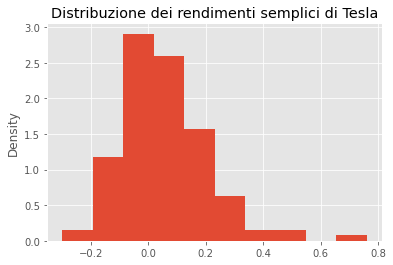

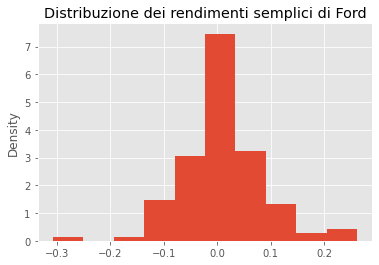

In [50]:
#istogrammi dei rendimenti semplici dei titoli affini Tesla e Ford
plt.figure()
plt.hist(TSLA_rends, density = True)
plt.title('Distribuzione dei rendimenti semplici di Tesla')
plt.ylabel("Density")

plt.figure()
plt.hist(FORD_rends, density = True)
plt.title('Distribuzione dei rendimenti semplici di Ford')
plt.ylabel("Density")


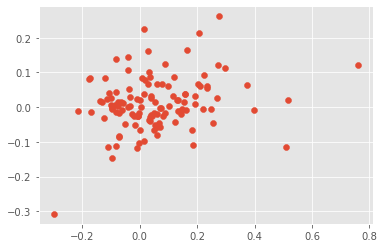

In [51]:
#grafico dispersione tesla ford
plt.scatter(TSLA_rends, FORD_rends);
plt.grid(True)

Text(0, 0.5, 'Density')

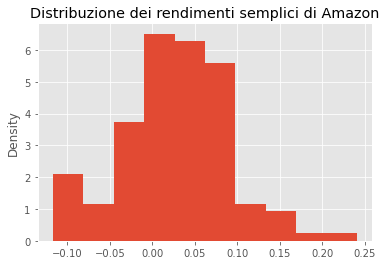

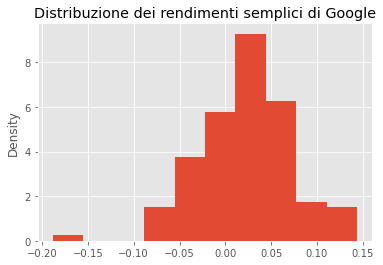

In [52]:
#amzn e goog
plt.figure()
plt.hist(AMZN_rends, density = True)
plt.title('Distribuzione dei rendimenti semplici di Amazon')
plt.ylabel("Density")

plt.figure()
plt.hist(GOOG_rends, density = True)
plt.title('Distribuzione dei rendimenti semplici di Google')
plt.ylabel("Density")

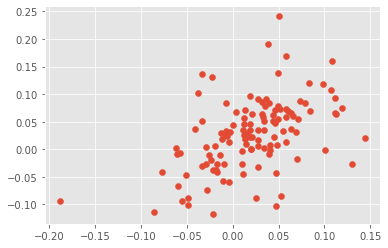

In [53]:
#amzn e goog
plt.scatter(GOOG_rends, AMZN_rends);
plt.grid(True)

Text(0, 0.5, 'Density')

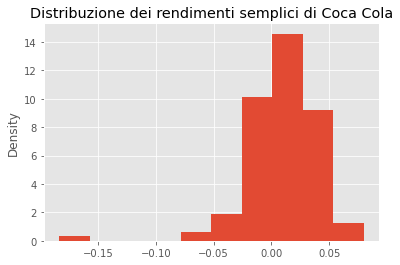

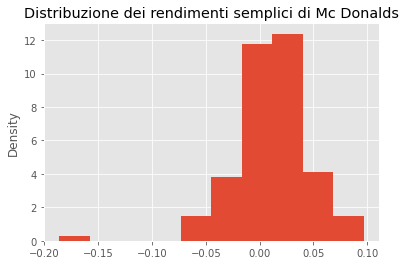

In [54]:
#ko e mcd
plt.figure()
plt.hist(KO_rends, density = True)
plt.title('Distribuzione dei rendimenti semplici di Coca Cola')
plt.ylabel("Density")

plt.figure()
plt.hist(MCD_rends, density = True)
plt.title('Distribuzione dei rendimenti semplici di Mc Donalds')
plt.ylabel("Density")


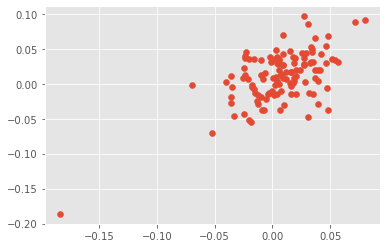

In [55]:
#ko e mcd
plt.scatter(KO_rends, MCD_rends);
plt.grid(True)

## 2.D grafici a 4 sezioni

In [56]:
print(v1.var())
print(v2.var())
print(v3.var())
print(v4.var())
print(v5.var())
print(v11.var())

TSLA_rends    0.02374
FORD_rends    0.00592
dtype: float64
MCD_rends    0.001321
KO_rends     0.000985
dtype: float64
TSLA_rendc    1172.218957
FORD_rendc       0.087913
dtype: float64
MCD_rendc    0.579731
KO_rendc     0.112105
dtype: float64
GOOG_rendc     4.123566
AMZN_rendc    29.229434
dtype: float64
AMZN_rends    0.004168
GOOG_rends    0.002529
dtype: float64


C:\Users\david\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


<AxesSubplot:title={'center':'Rendimenti di GOOG'}>

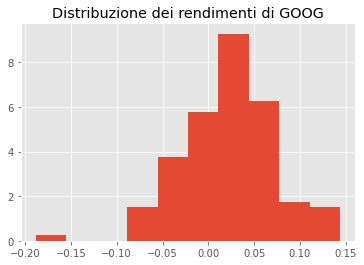

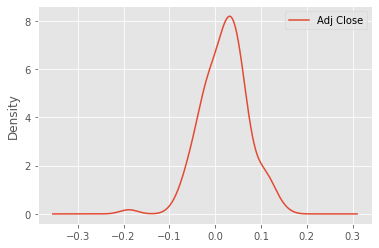

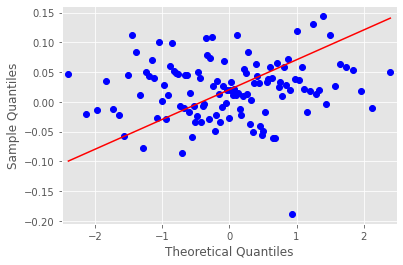

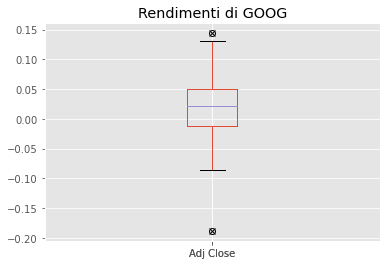

In [57]:
#distribuzione dei rendimenti semplici
plt.figure()
plt.hist(GOOG_rends, density = True)
plt.title('Distribuzione dei rendimenti di GOOG')
GOOG_rends.plot.density()


import statsmodels.api as sm
sm.qqplot(GOOG_rends, line = 's')
plt.figure()

plt.boxplot(GOOG_rends, sym = 'x')
plt.title('Rendimenti di GOOG')
GOOG_rends.boxplot()

C:\Users\david\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


<AxesSubplot:title={'center':'Rendimenti di AMZN'}>

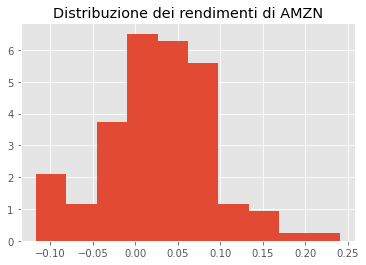

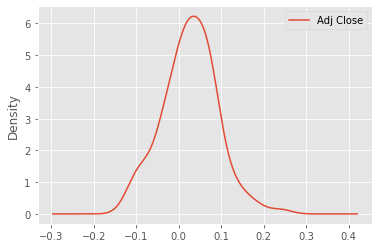

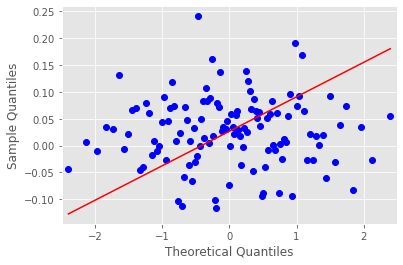

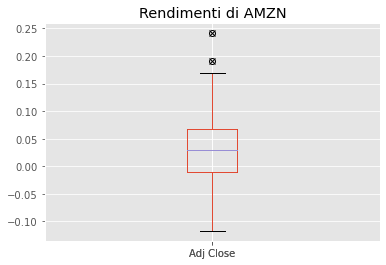

In [58]:
#distribuzione dei rendimenti semplici
plt.figure()
plt.hist(AMZN_rends, density = True)
plt.title('Distribuzione dei rendimenti di AMZN')
AMZN_rends.plot.density()

import statsmodels.api as sm
sm.qqplot(AMZN_rends, line = 's')
plt.figure()

plt.boxplot(AMZN_rends, sym = 'x')
plt.title('Rendimenti di AMZN')
AMZN_rends.boxplot()

C:\Users\david\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


<AxesSubplot:title={'center':'Rendimenti di TSLA'}>

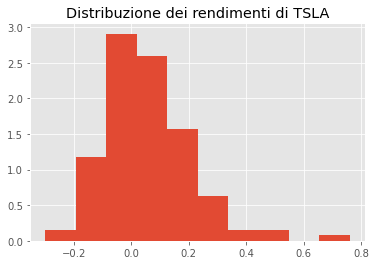

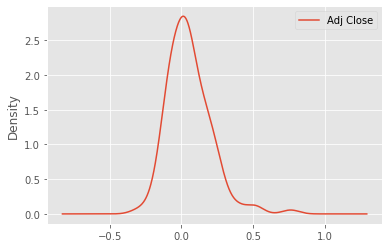

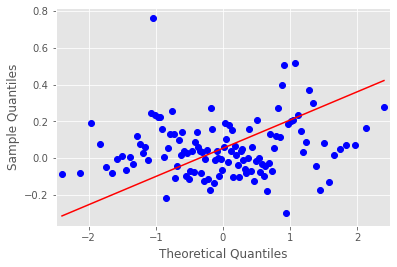

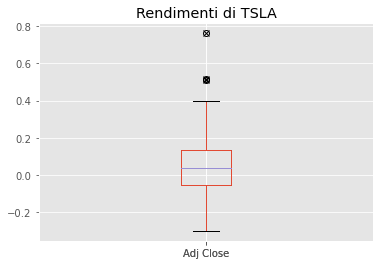

In [59]:
#distribuzione dei rendimenti semplici
plt.figure()
plt.hist(TSLA_rends, density = True)
plt.title('Distribuzione dei rendimenti di TSLA')
TSLA_rends.plot.density()

import statsmodels.api as sm
sm.qqplot(TSLA_rends, line = 's')
plt.figure()

plt.boxplot(TSLA_rends, sym = 'x')
plt.title('Rendimenti di TSLA')
TSLA_rends.boxplot()

C:\Users\david\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


<AxesSubplot:title={'center':'Rendimenti di FORD'}>

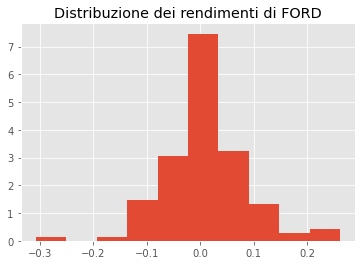

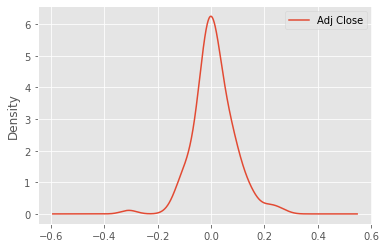

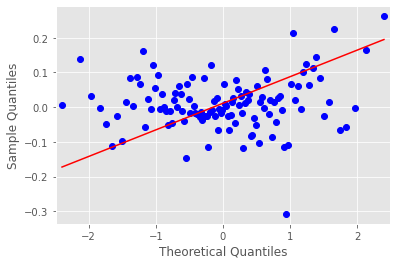

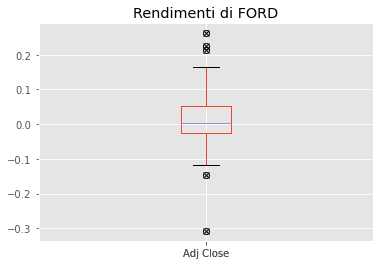

In [60]:
#distribuzione dei rendimenti semplici
plt.figure()
plt.hist(FORD_rends, density = True)
plt.title('Distribuzione dei rendimenti di FORD')
FORD_rends.plot.density()


import statsmodels.api as sm
sm.qqplot(FORD_rends, line = 's')
plt.figure()

plt.boxplot(FORD_rends, sym = 'x')
plt.title('Rendimenti di FORD')
FORD_rends.boxplot()

C:\Users\david\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


<AxesSubplot:title={'center':'Rendimenti di MCD'}>

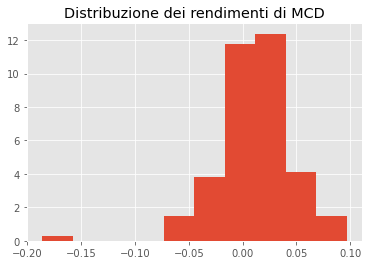

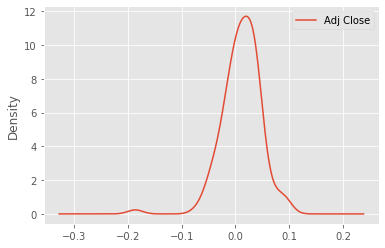

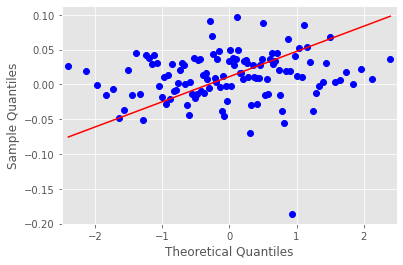

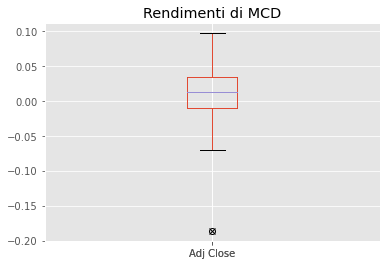

In [61]:
#distribuzione dei rendimenti semplici
plt.figure()
plt.hist(MCD_rends, density = True)
plt.title('Distribuzione dei rendimenti di MCD')
MCD_rends.plot.density()

import statsmodels.api as sm
sm.qqplot(MCD_rends, line = 's')
plt.figure()

plt.boxplot(MCD_rends, sym = 'x')
plt.title('Rendimenti di MCD')
MCD_rends.boxplot()

C:\Users\david\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


<AxesSubplot:title={'center':'Rendimenti di KO'}>

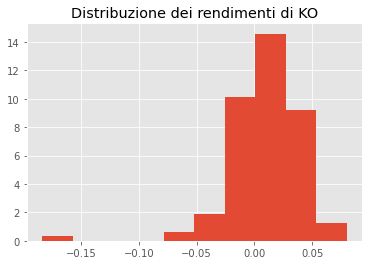

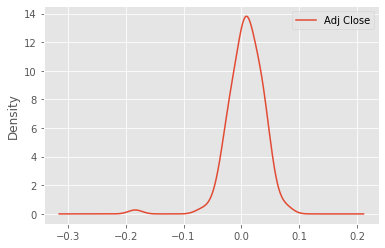

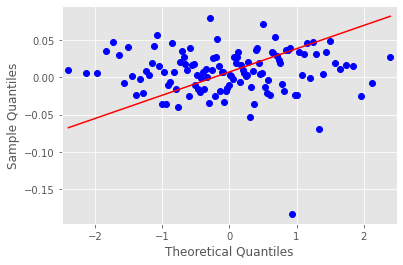

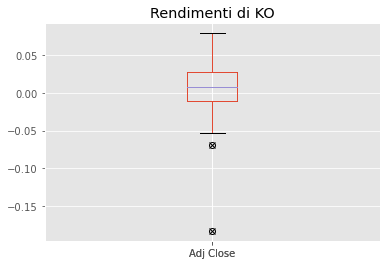

In [62]:
#distribuzione dei rendimenti semplici
plt.figure()
plt.hist(KO_rends, density = True)
plt.title('Distribuzione dei rendimenti di KO')
KO_rends.plot.density()


import statsmodels.api as sm
sm.qqplot(KO_rends, line = 's')
plt.figure()

plt.boxplot(KO_rends, sym = 'x')
plt.title('Rendimenti di KO')
KO_rends.boxplot()

Tutti i titoli tendono ad avere rendimenti distribuiti normalmente, ciò è deducibile dal grafico a campana della densità di distribuzione.
Sono presenti alcuni outliers, mostrati nei grafici del boxplot. Tesla ha parecchi outliers solo positivi, invece Coca Cola e Mc Donald's hanno solo outliers negativi.

## 2. E statistiche descrittive univariate

In [63]:
#Media

print('Google: ', round(rends_df['GOOG_rends'].mean(), 4))
print()
print('Amazon: ', round(rends_df['AMZN_rends'].mean(), 4))
print()
print('Tesla: ', round(rends_df['TSLA_rends'].mean(), 4))
print()
print('Ford: ', round(rends_df['FORD_rends'].mean(), 4))
print()
print('Coca Cola: ', round(rends_df['KO_rends'].mean(), 4))
print()
print('Mc Donalds: ', round(rends_df['MCD_rends'].mean(), 4))

Google:  0.0205

Amazon:  0.0265

Tesla:  0.0541

Ford:  0.0113

Coca Cola:  0.0073

Mc Donalds:  0.0111


KO è il titolo con la media dei rendimenti semplici minimi, TSLA ha la media dei rendimenti semplici massimi

In [64]:
#Media rendimenti composti

print('Google: ', round(rendc_df['GOOG_rendc'].mean(), 4))
print()
print('Amazon: ', round(rendc_df['AMZN_rendc'].mean(), 4))
print()
print('Tesla: ', round(rendc_df['TSLA_rendc'].mean(), 4))
print()
print('Ford: ', round(rendc_df['FORD_rendc'].mean(), 4))
print()
print('Coca Cola: ', round(rendc_df['KO_rendc'].mean(), 4))
print()
print('Mc Donalds: ', round(rendc_df['MCD_rendc'].mean(), 4))

Google:  3.2329

Amazon:  6.3282

Tesla:  20.2385

Ford:  1.3807

Coca Cola:  1.5578

Mc Donalds:  1.804


Anche qui TSLA conferma avere la media dei rendimenti (composti) maggiori, invece F è il titolo con la media dei rendimenti composti minori

In [65]:
#Varianza

print('Google: ', round(rends_df['GOOG_rends'].var(), 4))
print()
print('Amazon: ', round(rends_df['AMZN_rends'].var(), 4))
print()
print('Tesla: ', round(rends_df['TSLA_rends'].var(), 4))
print()
print('Ford: ', round(rends_df['FORD_rends'].var(), 4))
print()
print('Coca Cola: ', round(rends_df['KO_rends'].var(), 4))
print()
print('Mc Donalds: ', round(rends_df['MCD_rends'].var(), 4))

Google:  0.0025

Amazon:  0.0042

Tesla:  0.0237

Ford:  0.0059

Coca Cola:  0.001

Mc Donalds:  0.0013


Considerando i rendimenti semplici, TSLA è il titolo che varia di più, KO il titolo che varia meno

In [66]:
#Varianza rendimenti composti

print('Google: ', round(rendc_df['GOOG_rendc'].var(), 4))
print()
print('Amazon: ', round(rendc_df['AMZN_rendc'].var(), 4))
print()
print('Tesla: ', round(rendc_df['TSLA_rendc'].var(), 4))
print()
print('Ford: ', round(rendc_df['FORD_rendc'].var(), 4))
print()
print('Coca Cola: ', round(rendc_df['KO_rendc'].var(), 4))
print()
print('Mc Donalds: ', round(rendc_df['MCD_rendc'].var(), 4))

Google:  4.1236

Amazon:  29.2294

Tesla:  1172.219

Ford:  0.0879

Coca Cola:  0.1121

Mc Donalds:  0.5797


Considerando i rendimenti composti TSLA è il titolo che varia di più, F il titolo che varia meno

In [67]:
#Deviazione standard

print('Google: ',round(rends_df['GOOG_rends'].std(), 4))
print()
print('Amazon: ',round(rends_df['AMZN_rends'].std(), 4))
print()
print('Tesla: ',round(rends_df['TSLA_rends'].std(), 4))
print()
print('Ford: ',round(rends_df['FORD_rends'].std(), 4))
print()
print('Coca Cola: ',round(rends_df['KO_rends'].std(), 4))
print()
print('Mc Donalds: ',round(rends_df['MCD_rends'].std(), 4))

Google:  0.0503

Amazon:  0.0646

Tesla:  0.1541

Ford:  0.0769

Coca Cola:  0.0314

Mc Donalds:  0.0363


TSLA ha la deviazione standard maggiore, Coca Cola la deviazione standard minore

In [68]:
#Deviazione standard rendimenti composti

print('Google: ',round(rendc_df['GOOG_rendc'].std(), 4))
print()
print('Amazon: ',round(rendc_df['AMZN_rendc'].std(), 4))
print()
print('Tesla: ',round(rendc_df['TSLA_rendc'].std(), 4))
print()
print('Ford: ',round(rendc_df['FORD_rendc'].std(), 4))
print()
print('Coca Cola: ',round(rendc_df['KO_rendc'].std(), 4))
print()
print('Mc Donalds: ',round(rendc_df['MCD_rendc'].std(), 4))

Google:  2.0307

Amazon:  5.4064

Tesla:  34.2377

Ford:  0.2965

Coca Cola:  0.3348

Mc Donalds:  0.7614


Considerando i rendimenti composti, TSLA ha la deviazione standard maggiore, Ford ha la deviazione standard minore

In [69]:
#Asimmetria

print('Google: ', round(rends_df['GOOG_rends'].skew(), 4))
print()
print('Amazon: ', round(rends_df['AMZN_rends'].skew(), 4))
print()
print('Tesla: ', round(rends_df['TSLA_rends'].skew(), 4))
print()
print('Ford: ', round(rends_df['FORD_rends'].skew(), 4))
print()
print('Coca Cola: ', round(rends_df['KO_rends'].skew(), 4))
print()
print('Mc Donalds: ', round(rends_df['MCD_rends'].skew(), 4))

Google:  -0.4116

Amazon:  0.1578

Tesla:  1.2628

Ford:  0.024

Coca Cola:  -1.8647

Mc Donalds:  -1.2505


F è il titolo che ha i rendimenti semplici più simmetrici
KO è il titolo che ha i rendimenti semplici più asimmetrici

In [70]:
#Asimmetria rendimenti composti

print('Google: ', round(rendc_df['GOOG_rendc'].skew(), 4))
print()
print('Amazon: ', round(rendc_df['AMZN_rendc'].skew(), 4))
print()
print('Tesla: ', round(rendc_df['TSLA_rendc'].skew(), 4))
print()
print('Ford: ', round(rendc_df['FORD_rendc'].skew(), 4))
print()
print('Coca Cola: ', round(rendc_df['KO_rendc'].skew(), 4))
print()
print('Mc Donalds: ', round(rendc_df['MCD_rendc'].skew(), 4))

Google:  1.488

Amazon:  0.941

Tesla:  2.5025

Ford:  0.7179

Coca Cola:  0.4925

Mc Donalds:  0.54


KO è il titolo che ha i rendimenti composti più simmetrici
TSLA è il titolo che ha i rendimenti composti più asimmetrici

In [71]:
#Curtosi rendimenti semplici

print('Google: ', round(rends_df['GOOG_rends'].kurtosis(), 4))
print()
print('Amazon: ', round(rends_df['AMZN_rends'].kurtosis(), 4))
print()
print('Tesla: ', round(rends_df['TSLA_rends'].kurtosis(), 4))
print()
print('Ford: ', round(rends_df['FORD_rends'].kurtosis(), 4))
print()
print('Coca Cola: ', round(rends_df['KO_rends'].kurtosis(), 4))
print()
print('Mc Donalds: ', round(rends_df['MCD_rends'].kurtosis(), 4))

Google:  1.7265

Amazon:  0.5887

Tesla:  3.5872

Ford:  2.8119

Coca Cola:  10.5059

Mc Donalds:  6.4746


Amazon ha la curtosi vicina allo 0, quindi è il titolo che si distribuisce più normalmente degli altri, vale anche se considero i rendimenti composti. Coca Cola è la più lontana dalla normale

In [72]:
#Curtosi rendimenti composti

print('Google: ', round(rendc_df['GOOG_rendc'].kurtosis(), 4))
print()
print('Amazon: ', round(rendc_df['AMZN_rendc'].kurtosis(), 4))
print()
print('Tesla: ', round(rendc_df['TSLA_rendc'].kurtosis(), 4))
print()
print('Ford: ', round(rendc_df['FORD_rendc'].kurtosis(), 4))
print()
print('Coca Cola: ', round(rendc_df['KO_rendc'].kurtosis(), 4))
print()
print('Mc Donalds: ', round(rendc_df['MCD_rendc'].kurtosis(), 4))

Google:  2.1171

Amazon:  -0.3464

Tesla:  5.418

Ford:  3.0052

Coca Cola:  -0.7546

Mc Donalds:  -1.0837


Considerando i rendimenti compposti Tesla è la più lontana dalla distribuzione gaussiana, Amazon la più vicina.

## 2.f Matrici varianze-covarianze dei rendimenti

In [73]:
#tabella covarianze tra semplici
rends_df.cov()

,TSLA_rends,FORD_rends,MCD_rends,KO_rends,AMZN_rends,GOOG_rends
TSLA_rends,0.023740,0.002971,0.000736,0.000626,0.001769,0.001949
FORD_rends,0.002971,0.005920,0.001016,0.000658,0.000632,0.001187
MCD_rends,0.000736,0.001016,0.001321,0.000697,0.000486,0.000621
KO_rends,0.000626,0.000658,0.000697,0.000985,0.000152,0.000451
AMZN_rends,0.001769,0.000632,0.000486,0.000152,0.004168,0.001591
GOOG_rends,0.001949,0.001187,0.000621,0.000451,0.001591,0.002529


In [74]:
#varianze dei rendimenti semplici dei titoli 
rends_df.var()

TSLA_rends    0.023740
FORD_rends    0.005920
MCD_rends     0.001321
KO_rends      0.000985
AMZN_rends    0.004168
GOOG_rends    0.002529
dtype: float64

In [75]:
#covarianze tra i rendimenti composti
rendc_df.cov()

,TSLA_rendc,FORD_rendc,GOOG_rendc,AMZN_rendc,MCD_rendc,KO_rendc
TSLA_rendc,1172.218957,4.469802,61.461998,152.101808,18.843864,7.986344
FORD_rendc,4.469802,0.087913,0.198616,0.141340,0.018133,0.014620
GOOG_rendc,61.461998,0.198616,4.123566,10.398002,1.432948,0.620761
AMZN_rendc,152.101808,0.141340,10.398002,29.229434,3.944496,1.658621
MCD_rendc,18.843864,0.018133,1.432948,3.944496,0.579731,0.247386
KO_rendc,7.986344,0.014620,0.620761,1.658621,0.247386,0.112105


In [76]:
#covarianze dei rendimenti composti
rendc_df.var()

TSLA_rendc    1172.218957
FORD_rendc       0.087913
GOOG_rendc       4.123566
AMZN_rendc      29.229434
MCD_rendc        0.579731
KO_rendc         0.112105
dtype: float64

In [77]:
#correlazioni tra i rendimenti semplici
rends_df.corr()

,TSLA_rends,FORD_rends,MCD_rends,KO_rends,AMZN_rends,GOOG_rends
TSLA_rends,1.000000,0.250631,0.131419,0.129367,0.177828,0.251529
FORD_rends,0.250631,1.000000,0.363450,0.272488,0.127237,0.306881
MCD_rends,0.131419,0.363450,1.000000,0.611280,0.207078,0.339994
KO_rends,0.129367,0.272488,0.611280,1.000000,0.075163,0.285580
AMZN_rends,0.177828,0.127237,0.207078,0.075163,1.000000,0.489991
GOOG_rends,0.251529,0.306881,0.339994,0.285580,0.489991,1.000000


In [78]:
#correlazioni tra i rendimenti composti
rendc_df.corr()

,TSLA_rendc,FORD_rendc,GOOG_rendc,AMZN_rendc,MCD_rendc,KO_rendc
TSLA_rendc,1.000000,0.440310,0.884028,0.821712,0.722857,0.696678
FORD_rendc,0.440310,1.000000,0.329878,0.088171,0.080323,0.147272
GOOG_rendc,0.884028,0.329878,1.000000,0.947116,0.926789,0.913011
AMZN_rendc,0.821712,0.088171,0.947116,1.000000,0.958226,0.916274
MCD_rendc,0.722857,0.080323,0.926789,0.958226,1.000000,0.970400
KO_rendc,0.696678,0.147272,0.913011,0.916274,0.970400,1.000000


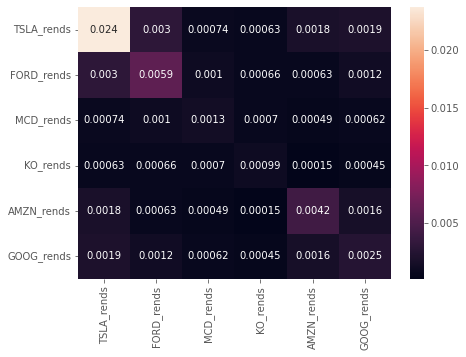

In [79]:
#visualizzo le matrici di covarianze dei rendimenti semplici
cov_df = rends_df.cov()
plt.figure(figsize=(7, 5))
sn.heatmap(cov_df, annot=True)
plt.show()

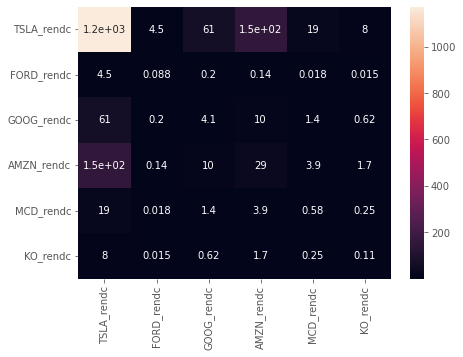

In [80]:
#dei rendimenti composti
cov_dfc = rendc_df.cov()
plt.figure(figsize=(7, 5))
sn.heatmap(cov_dfc, annot=True)
plt.show()

## 2g Matrici di correlazioni dei rendimenti

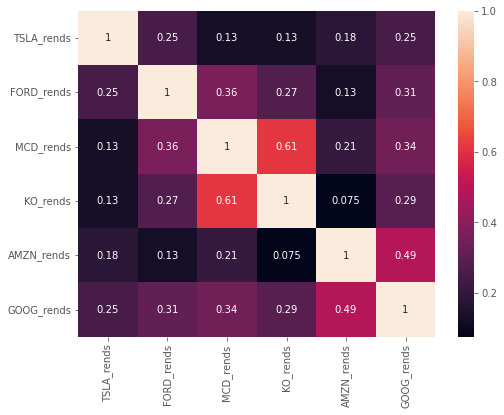

In [81]:
#matrice correlazione rendimenti semplici dei titoli
corr_df = rends_df.corr(method='pearson')
plt.figure(figsize=(8, 6))
sn.heatmap(corr_df, annot=True)
plt.show()

KO e MCD sono i titoli con correlazione tra i rendimenti semplici maggiore (0,61). I titoli meno correlati sono AMZN e KO (0.075)

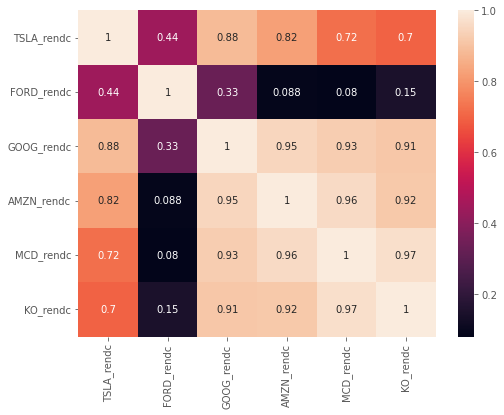

In [82]:
#matrice di correlazione dei rendimenti composti
corr_df2 = rendc_df.corr(method='pearson')
plt.figure(figsize=(8, 6))
sn.heatmap(corr_df2, annot=True)
plt.show()

KO e MCD sono i titoli con correlazione tra i rendimenti composti maggiore (0,97). I titoli meno correlati sono MCD e F (0.08)

## 2h Grafici dispersione e correlazioni medie nel tempo tra rendimenti semplici

In [83]:
from pylab import mpl, plt
plt.style.use('seaborn')
mpl.rcParams['font.family'] = 'serif'
vixdf = web.get_data_yahoo(['^VIX', 'TSLA', 'F', 'GOOG', 'AMZN', 'MCD', 'KO'], '30/11/2011', '30/11/2021')
vixdf.groupby(pd.Grouper(freq='M')).mean()
vixdf.head()

Attributes  Adj Close                                                  \
Symbols          ^VIX   TSLA         F        GOOG    AMZN        MCD   
Date                                                                    
2011-11-30  27.799999  6.548  7.065885  298.575867  9.6145  71.149567   
2011-12-01  27.410000  6.520  7.059221  305.739014  9.8565  71.134674   
2011-12-02  27.520000  6.660  7.265862  309.021698  9.8015  71.283661   
2011-12-05  27.840000  6.884  7.405847  311.656830  9.8120  71.022919   
2011-12-06  28.129999  6.974  7.365852  310.720337  9.5995  71.514542   

Attributes                 Close                ...    Open             \
Symbols            KO       ^VIX   TSLA      F  ...    AMZN        MCD   
Date                                            ...                      
2011-11-30  24.213419  27.799999  6.548  10.60  ...  9.7380  94.849998   
2011-12-01  24.069361  27.410000  6.520  10.59  ...  9.5925  95.440002   
2011-12-02  23.907286  27.520000  6.660  10.90  ...  9.8535  96.370003   
2011-12-05  23.882074  27.840000  6.884  11.11  ...  9.9430  96.419998   
2011-12-06  24.015331  28.129999  6.974  11.05  ...  9.7990  95.470001   

Attributes            Volume                                                 \
Symbols            KO   ^VIX       TSLA           F       GOOG         AMZN   
Date                                                                          
2011-11-30  33.669998    0.0  3801500.0  66922300.0  6819466.0  154340000.0   
2011-12-01  33.500000    0.0  5151000.0  61397000.0  7268342.0  146554000.0   
2011-12-02  33.730000    0.0  4014000.0  67252600.0  8202028.0  150524000.0   
2011-12-05  33.470001    0.0  5800500.0  65924700.0  6418970.0  118442000.0   
2011-12-06  33.244999    0.0  4759000.0  39786100.0  4670441.0  104040000.0   

Attributes                         
Symbols           MCD          KO  
Date                               
2011-11-30  7683300.0  25300400.0  
2011-12-01  4860300.0  15429000.0  
2011-12-02  4023100.0  21170400.0  
2011-12-05  5906900.0  17955200.0  
2011-12-06  5346500.0  16730800.0  

[5 rows x 42 columns]

In [84]:
vixdf=vixdf['Adj Close']
vixdf.head()

Symbols,^VIX,TSLA,F,GOOG,AMZN,MCD,KO
Date,,,,,,,
2011-11-30,27.799999,6.548,7.065885,298.575867,9.6145,71.149567,24.213419
2011-12-01,27.410000,6.520,7.059221,305.739014,9.8565,71.134674,24.069361
2011-12-02,27.520000,6.660,7.265862,309.021698,9.8015,71.283661,23.907286
2011-12-05,27.840000,6.884,7.405847,311.656830,9.8120,71.022919,23.882074
2011-12-06,28.129999,6.974,7.365852,310.720337,9.5995,71.514542,24.015331


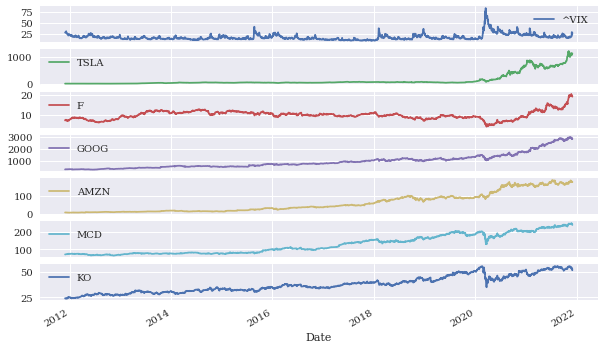

In [85]:
vixdf.plot(subplots=True, figsize=(10,6), grid = True);

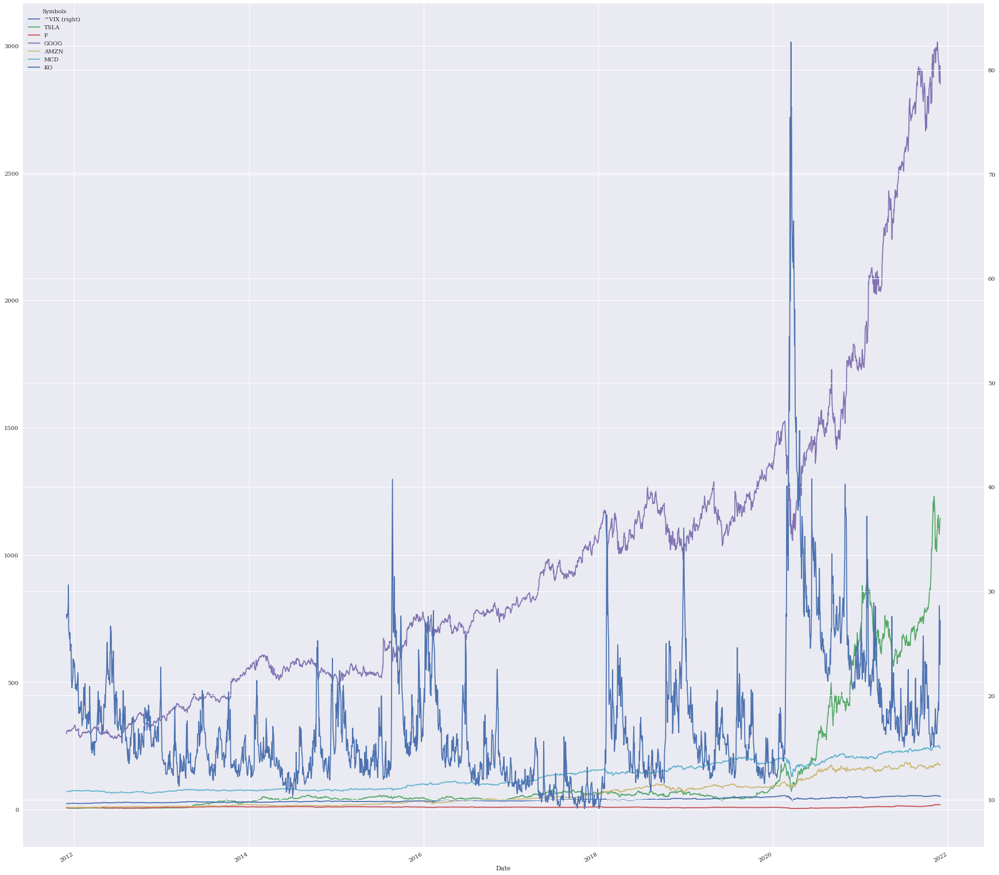

In [86]:
#tendenza dell'indice di volatilità VIX e dei prezzi dei titoli
vixdf.loc[:'2021-11-30'].plot(secondary_y='^VIX', figsize=(30,30), grid = True);

In [87]:
retsvix = np.log(vixdf / vixdf.shift(1))

In [88]:
retsvix.rename(columns={'^VIX': 'VIX'}, inplace=True)

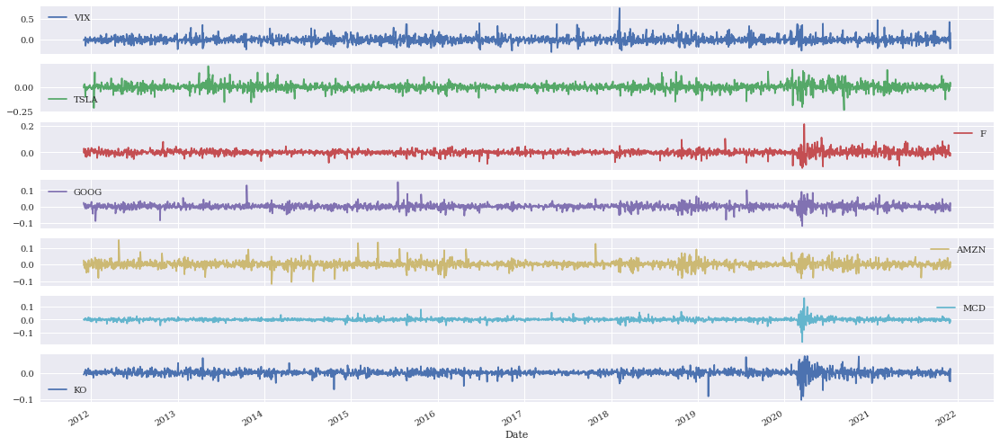

In [89]:
#confronto tra l'andamento dei rendimenti semplici dei titoli e dell'indice vix
retsvix.plot(subplots=True, grid = True, figsize=(19,9));

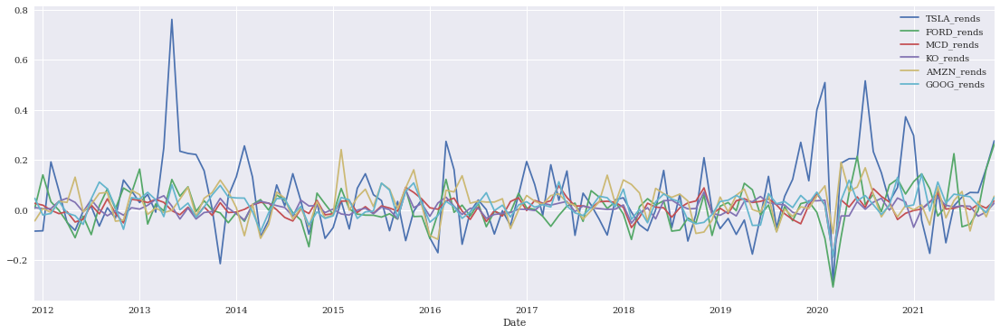

In [90]:
rends_df.loc[:'2021-11-30'].plot(figsize=(19,6), grid = True);

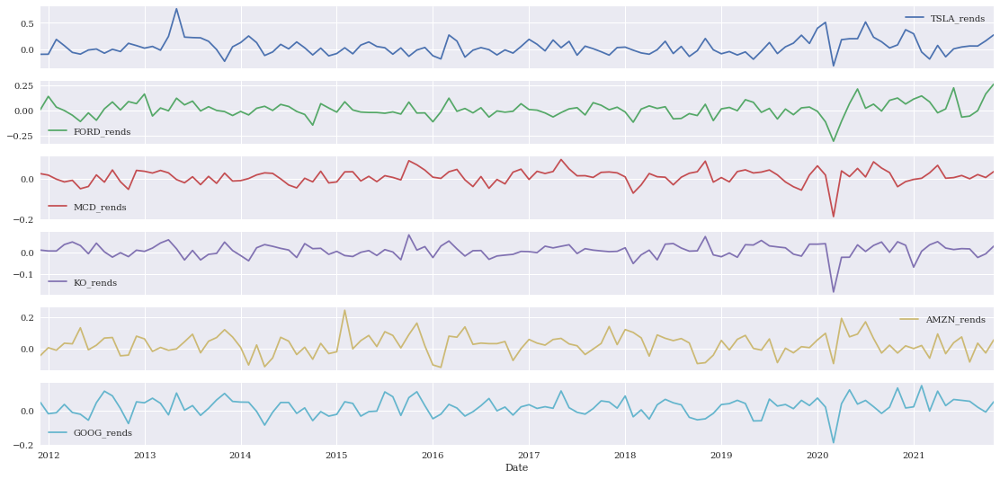

In [91]:
rends_df.plot(subplots=True, grid = True, figsize=(19,9));

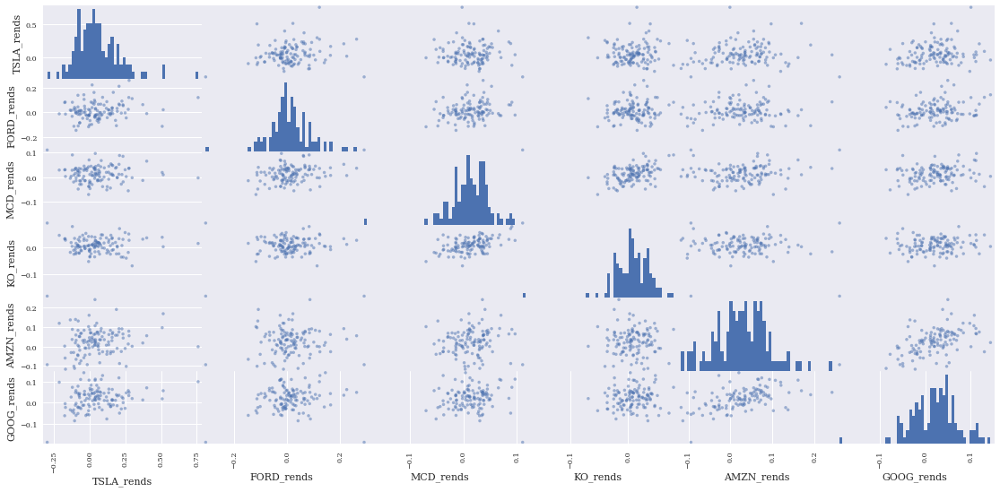

In [92]:
#grafico dispersione(scatterplot) dei rendimenti semplici
pd.plotting.scatter_matrix(rends_df, alpha=0.5, diagonal = 'hist',
            hist_kwds={'bins': 50},figsize = (19,9), grid = True);

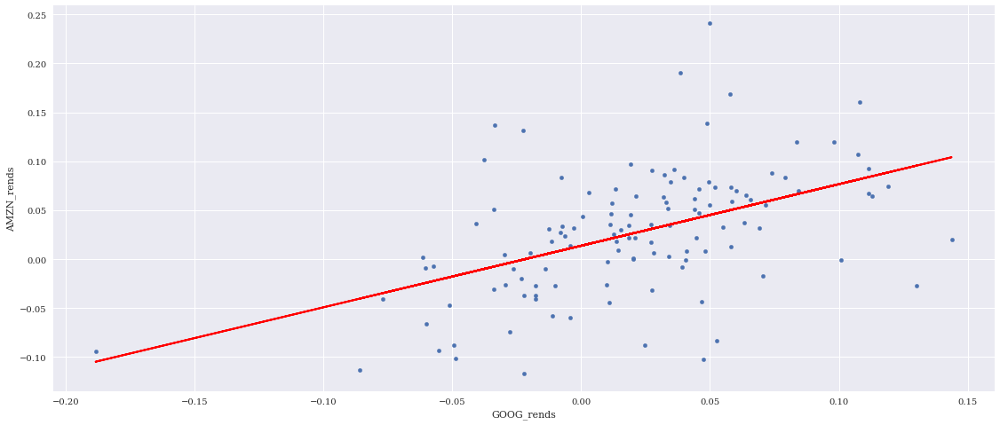

In [93]:
#correlazione tra rendimenti semplici google amazon
reg = np.polyfit(rends_df['GOOG_rends'], rends_df['AMZN_rends'], deg=1)
ax = rends_df.plot(kind = 'scatter', x = 'GOOG_rends', y= 'AMZN_rends', figsize=(19,8))
ax.plot(rends_df['GOOG_rends'], np.polyval(reg, rends_df['GOOG_rends']), 'r', lw=2);

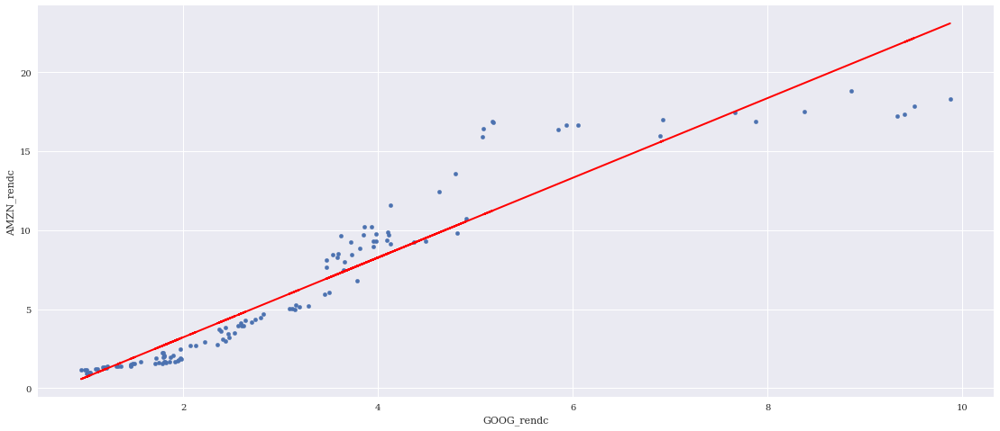

In [94]:
#rendimenti composti google amazon
reg1 = np.polyfit(rendc_df['GOOG_rendc'], rendc_df['AMZN_rendc'], deg=1)
ax1 = rendc_df.plot(kind = 'scatter', x = 'GOOG_rendc', y= 'AMZN_rendc', figsize=(19,8))
ax1.plot(rendc_df['GOOG_rendc'], np.polyval(reg1, rendc_df['GOOG_rendc']), 'r', lw=2);

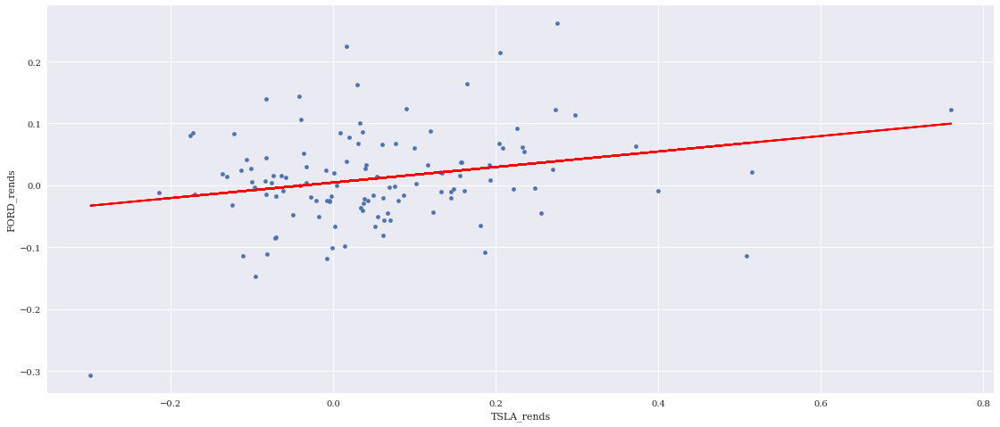

In [95]:
#rendimenti semplici tesla ford
reg = np.polyfit(rends_df['TSLA_rends'], rends_df['FORD_rends'], deg=1)
ax = rends_df.plot(kind = 'scatter', x = 'TSLA_rends', y= 'FORD_rends', figsize=(19,8))
ax.plot(rends_df['TSLA_rends'], np.polyval(reg, rends_df['TSLA_rends']), 'r', lw=2);

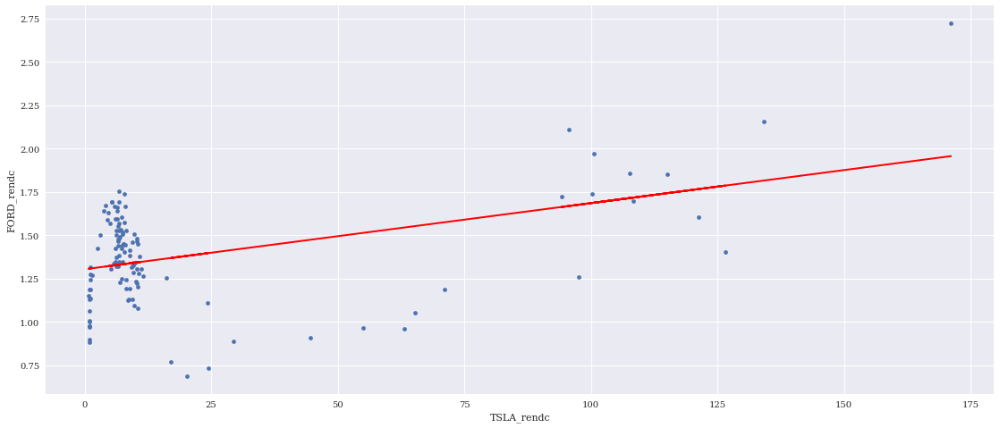

In [96]:
#rendimenti composti tesla ford
reg2 = np.polyfit(rendc_df['TSLA_rendc'], rendc_df['FORD_rendc'], deg=1)
ax2 = rendc_df.plot(kind = 'scatter', x = 'TSLA_rendc', y= 'FORD_rendc', figsize=(19,8))
ax2.plot(rendc_df['TSLA_rendc'], np.polyval(reg2, rendc_df['TSLA_rendc']), 'r', lw=2);

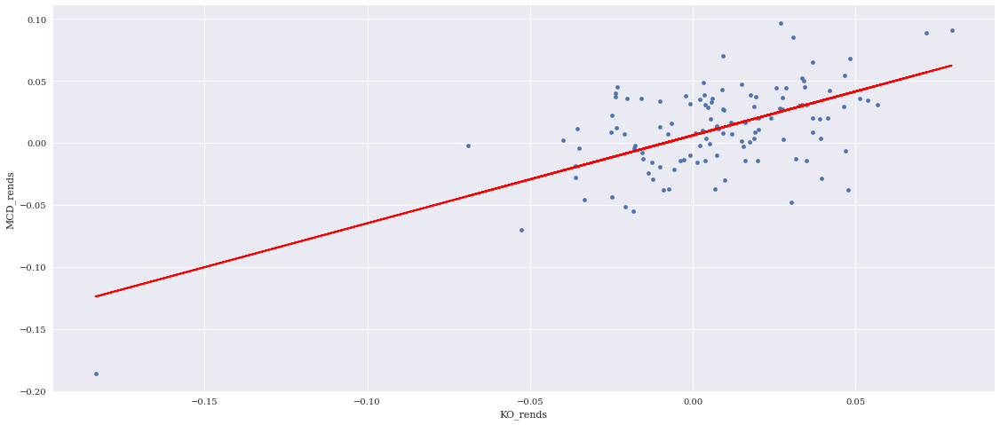

In [97]:
#rendimenti semplici mc donalds coca cola
reg = np.polyfit(rends_df['KO_rends'], rends_df['MCD_rends'], deg=1)
ax = rends_df.plot(kind = 'scatter', x = 'KO_rends', y= 'MCD_rends', figsize=(19,8))
ax.plot(rends_df['KO_rends'], np.polyval(reg, rends_df['KO_rends']), 'r', lw=2);

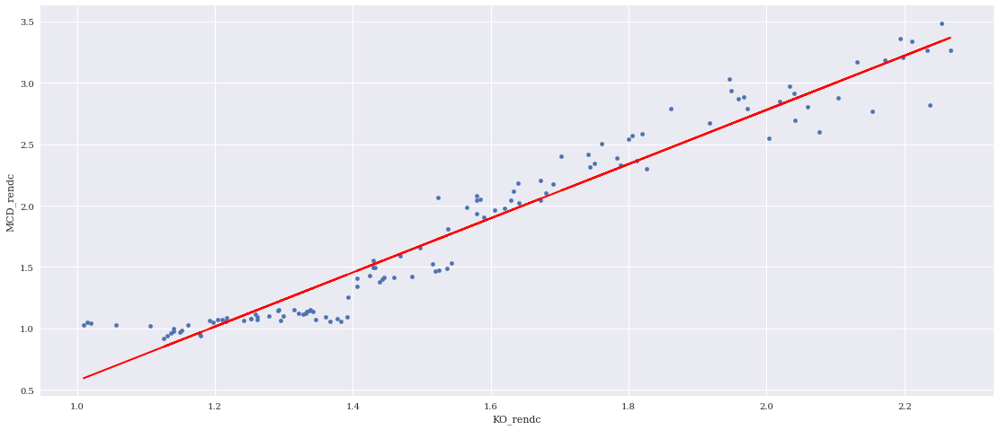

In [98]:
reg3 = np.polyfit(rendc_df['KO_rendc'], rendc_df['MCD_rendc'], deg=1)
ax3 = rendc_df.plot(kind = 'scatter', x = 'KO_rendc', y= 'MCD_rendc', figsize=(19,8))
ax3.plot(rendc_df['KO_rendc'], np.polyval(reg3, rendc_df['KO_rendc']), 'r', lw=2);

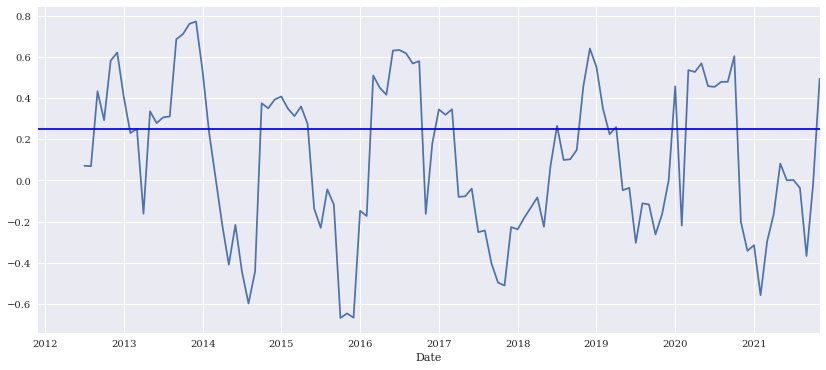

In [99]:
#correlazione nel tempo tra i rendimenti semplici di tesla e ford, finestra di tempo di 8 mesi
ax = rends_df['TSLA_rends'].rolling(window=8).corr(rends_df['FORD_rends']).plot(figsize=(14,6))
ax.axhline(rends_df.corr().iloc[0,1], c='b')

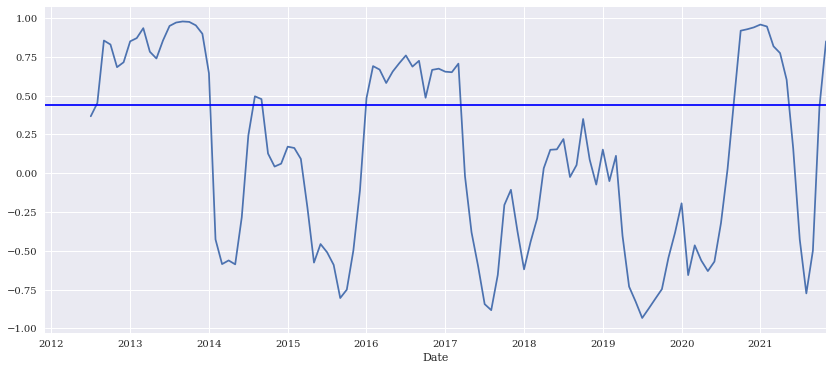

In [100]:
#correlazione nel tempo tra i rendimenti composti di tesla e ford, finestra di tempo di 8 mesi
ax = rendc_df['TSLA_rendc'].rolling(window=8).corr(rendc_df['FORD_rendc']).plot(figsize=(14,6))
ax.axhline(rendc_df.corr().iloc[0,1], c='b')

La correlazione tra TSLA e F alterna momenti molto bassi e negativi a momenti alti e positivi, che spesso si susseguono. La correlazione dei rendimenti composti mostra una relazione più forte.

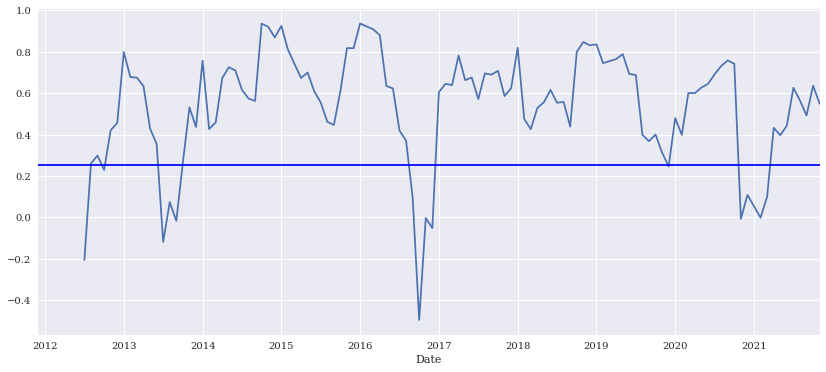

In [101]:
#correlazione nel tempo tra amazon e google, finestra di tempo di 8 mesi
ax = rends_df['GOOG_rends'].rolling(window=8).corr(rends_df['AMZN_rends']).plot(figsize=(14,6))
ax.axhline(rends_df.corr().iloc[0,1], c='b')

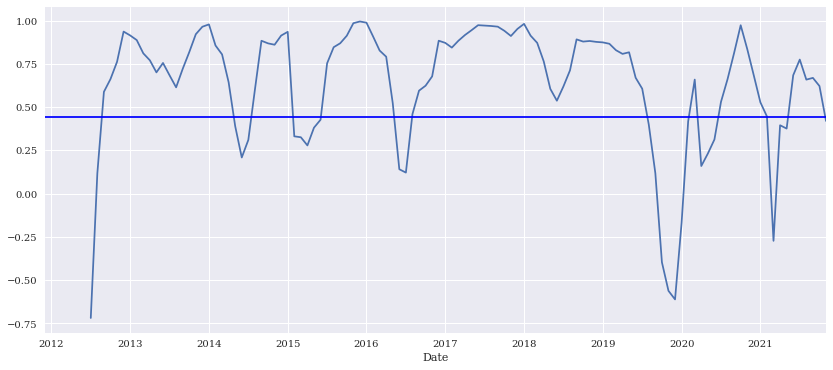

In [102]:
#correlazione nel tempo tra i rendimenti composti di amazon e google, finestra di tempo di 8 mesi
ax = rendc_df['GOOG_rendc'].rolling(window=8).corr(rendc_df['AMZN_rendc']).plot(figsize=(14,6))
ax.axhline(rendc_df.corr().iloc[0,1], c='b')

La correlazione tra GOOG e AMZN è quasi sempre abbastanza alta e positiva dalla seconda metà del 2012, tranne un periodo tra il 2019 e il 2020, e un brevissimo periodo del 2021. Nel grafico dei rendimenti semplici la correlazione diventa negativa anche tra il 2016 e il 2017. Il grafico dei rendimenti composti mostra una correlazione nettamente superiore. In entrambi i grafici le correlazioni si avvicinano spesso al valore massimo 1.0

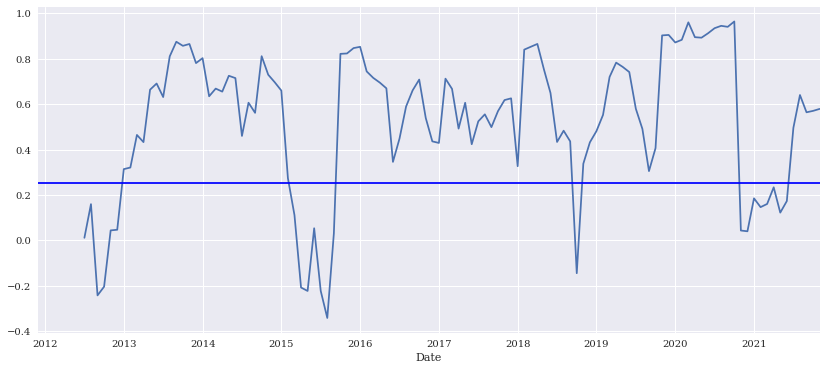

In [103]:
#correlazione nel tempo tra ko e mcd, finestra di tempo di 8 mesi
ax = rends_df['KO_rends'].rolling(window=8).corr(rends_df['MCD_rends']).plot(figsize=(14,6))
ax.axhline(rends_df.corr().iloc[0,1], c='b')

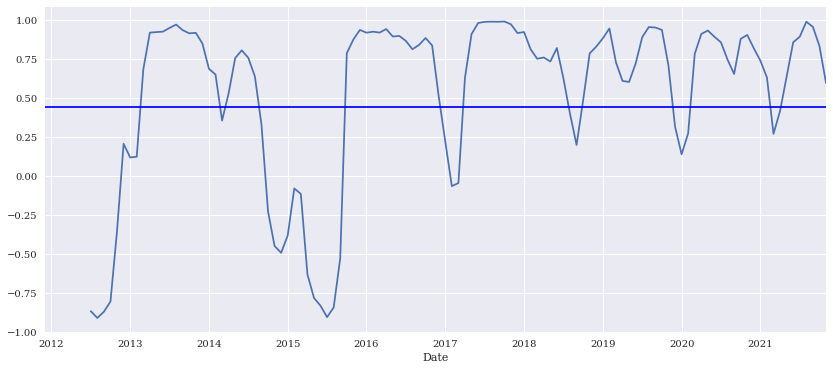

In [104]:
#correlazione nel tempo tra i rendimenti composti di KO e MCD, finestra di tempo di 8 mesi
ax = rendc_df['KO_rendc'].rolling(window=8).corr(rendc_df['MCD_rendc']).plot(figsize=(14,6))
ax.axhline(rendc_df.corr().iloc[0,1], c='b')

La correlazione tra MCD e KO è quasi sempre abbastanza alta e positiva dal 2013, tranne un periodo tra il 2015 e il 2016. Nel grafico dei rendimenti semplici la correlazione diventa negativa anche tra il 2018 e il 2019. Il grafico dei rendimenti composti mostra una correlazione nettamente superiore.

# 3) ANALISI DI PREVISIONE DEI PREZZI
## a) Modelli SVR e LR

In [105]:
#rimuovo colonne superflue ai fini della previsione dei prezzi
tesla = tesla.drop(columns=['Open', 'High', 'Low', 'Close', 'Volume'])
ford = ford.drop(columns=['Open', 'High', 'Low', 'Close', 'Volume'])
google = google.drop(columns=['Open', 'High', 'Low', 'Close', 'Volume'])
amazon = amazon.drop(columns=['Open', 'High', 'Low', 'Close', 'Volume'])
mc = mc.drop(columns=['Open', 'High', 'Low', 'Close', 'Volume'])
coca = coca.drop(columns=['Open', 'High', 'Low', 'Close', 'Volume'])

In [106]:
#mesi in avanti da prevedere
future = 10

In [107]:
tesla[str(future) + '_Day_Price_Forecast'] = tesla[['Adj Close']].shift(-future)

In [108]:
X = np.array(tesla[['Adj Close']])
X = X[:tesla.shape[0] - future]

In [109]:
tesla.shape

(121, 2)

In [110]:
y = np.array(tesla[str(future) + '_Day_Price_Forecast'])

In [111]:
y = y[:-future]
print(y)

[   5.86084208    5.66866664    6.34657145    6.83510008    7.03771428
    7.47326316    7.4086        9.24709099   16.27981823   20.09609985
   24.631        30.08136394   34.79449997   34.93747811   27.45129995
   28.96200017   32.81038103   41.2046312    46.62933331   41.65752393
   39.93485714   43.93171401   44.64918206   51.11752356   52.98219045
   47.87634775   49.31663192   43.73227258   40.65110016   42.13463131
   38.94363629   42.32228652   48.44410038   51.4003634    53.31990936
   48.91009521   50.58123852   44.39654558   44.17639999   46.03436366
   40.91242118   33.9340003    43.22945421   50.19180952   43.32676206
   42.96781835   44.67580013   44.74686963   40.45123836   40.33666665
   37.83152408   40.11057136   47.86409969   52.74221059   51.63130437
   60.95168405   63.30481789   73.16072741   65.76099987   70.17504385
   71.57140007   68.93663614   62.03838094   64.56820049   67.71666645
   67.15547421   63.19666581   57.9545715    57.97045465   67.12009521
   62.

In [112]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 30, train_size=80, random_state=1)

In [113]:
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.01)
svr_rbf.fit(x_train,y_train)

SVR(C=1000.0, gamma=0.01)

In [114]:
svr_rbf_confidence = svr_rbf.score(x_test, y_test)
print('svr_rbf confidence score is: ', svr_rbf_confidence)

svr_rbf confidence score is:  0.7507431735871062


In [115]:
svm_prediction = svr_rbf.predict(x_test)

In [116]:
print(y_test)

[111.82027297  43.32676206  63.30481789  48.47645482  67.12009521
 656.802607   465.61249847  65.76099987  48.91009521  44.17639999
  67.15547421 132.71971494   6.34657145 638.81863958 616.75299988
  52.74221059 427.20954479 292.02817882 159.48936784  43.22945421
  68.89904749  41.2046312   55.5514283   51.63130437 105.73180862
  51.4003634   57.9545715   40.45123836  44.67580013  75.53895206]


In [117]:
X.shape

(111, 1)

In [118]:
y.shape

(111,)

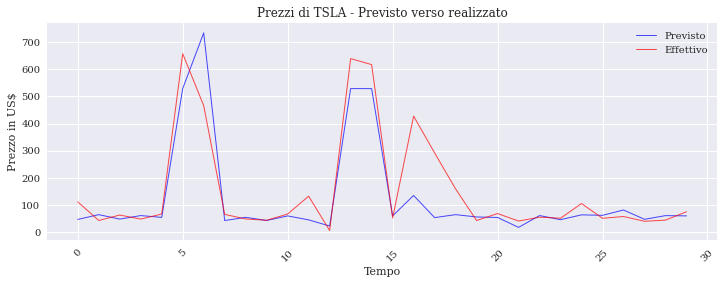

In [119]:
plt.figure(figsize=(12,4))
plt.plot(svm_prediction, label = 'Previsto', linewidth = '1', color ='b', alpha = .7)
plt.plot(y_test, label = 'Effettivo', linewidth = '1', color ='r', alpha = .7)
plt.title('Prezzi di TSLA - Previsto verso realizzato')
plt.ylabel('Prezzo in US$')
plt.xlabel('Tempo')
plt.legend()
plt.xticks(rotation = 45)
plt.show();


In [120]:
ford[str(future) + '_Day_Price_Forecast'] = ford[['Adj Close']].shift(-future)
X = np.array(ford[['Adj Close']])
X = X[:ford.shape[0] - future]
y = np.array(ford[str(future) + '_Day_Price_Forecast'])
y = y[:-future]

In [121]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 30, random_state=1)

In [122]:
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.05)
svr_rbf.fit(x_train,y_train)

SVR(C=1000.0, gamma=0.05)

In [123]:
svr_rbf_confidence = svr_rbf.score(x_test, y_test)
print('svr_rbf confidence score is: ', svr_rbf_confidence)

svr_rbf confidence score is:  0.2154358376504819


In [124]:
svm_prediction = svr_rbf.predict(x_test)

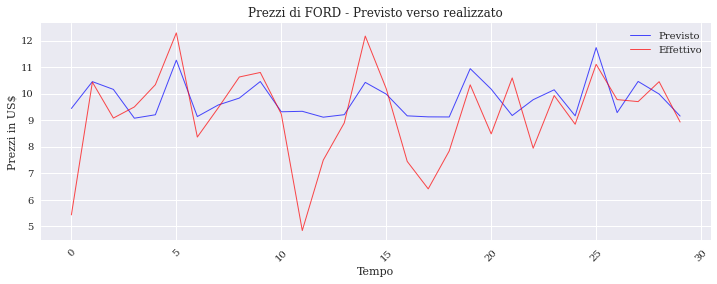

In [125]:
plt.figure(figsize=(12,4))
plt.plot(svm_prediction, label = 'Previsto', linewidth = '1', color ='b', alpha = .7)
plt.plot(y_test, label = 'Effettivo', linewidth = '1', color ='r', alpha = .7)
plt.title('Prezzi di FORD - Previsto verso realizzato')
plt.ylabel('Prezzi in US$')
plt.xlabel('Tempo')
plt.legend()
plt.xticks(rotation = 45)
plt.show();

In [126]:
amazon[str(future) + '_Day_Price_Forecast'] = amazon[['Adj Close']].shift(-future)
X = np.array(amazon[['Adj Close']])
X = X[:amazon.shape[0] - future]
y = np.array(amazon[str(future) + '_Day_Price_Forecast'])
y = y[:-future]

In [127]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 30, random_state=1)

In [128]:
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.01)
svr_rbf.fit(x_train,y_train)

SVR(C=1000.0, gamma=0.01)

In [129]:
svr_rbf_confidence = svr_rbf.score(x_test, y_test)
print('svr_rbf confidence score is: ', svr_rbf_confidence)
svm_prediction = svr_rbf.predict(x_test)

svr_rbf confidence score is:  0.8687304531285935


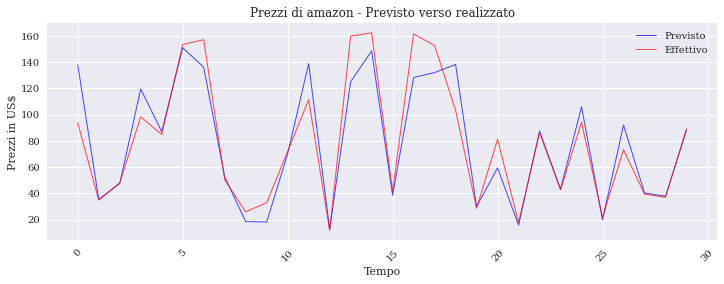

In [130]:
plt.figure(figsize=(12,4))
plt.plot(svm_prediction, label = 'Previsto', linewidth = '1', color ='b', alpha = .7)
plt.plot(y_test, label = 'Effettivo', linewidth = '1', color ='r', alpha = .7)
plt.title('Prezzi di amazon - Previsto verso realizzato')
plt.ylabel('Prezzi in US$')
plt.xlabel('Tempo')
plt.legend()
plt.xticks(rotation = 45)
plt.show();

In [131]:
google[str(future) + '_Day_Price_Forecast'] = google[['Adj Close']].shift(-future)
X = np.array(google[['Adj Close']])
X = X[:google.shape[0] - future]
y = np.array(google[str(future) + '_Day_Price_Forecast'])
y = y[:-future]
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 30, random_state=1)
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.01)
svr_rbf.fit(x_train,y_train)

SVR(C=1000.0, gamma=0.01)

In [132]:
svr_rbf_confidence = svr_rbf.score(x_test, y_test)
print('svr_rbf confidence score is: ', svr_rbf_confidence)
svm_prediction = svr_rbf.predict(x_test)

svr_rbf confidence score is:  0.5317613914436782


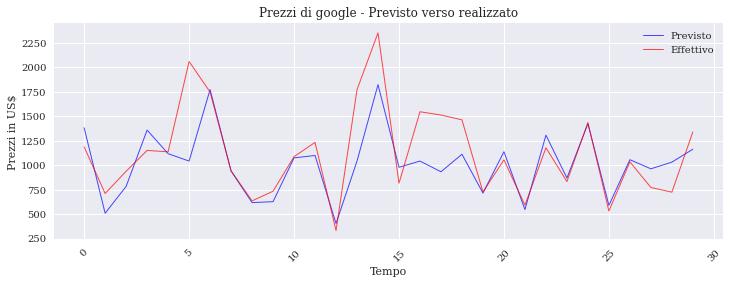

In [133]:
plt.figure(figsize=(12,4))
plt.plot(svm_prediction, label = 'Previsto', linewidth = '1', color ='b', alpha = .7)
plt.plot(y_test, label = 'Effettivo', linewidth = '1', color ='r', alpha = .7)
plt.title('Prezzi di google - Previsto verso realizzato')
plt.ylabel('Prezzi in US$')
plt.xlabel('Tempo')
plt.legend()
plt.xticks(rotation = 45)
plt.show();

In [134]:
mc[str(future) + '_Day_Price_Forecast'] = mc[['Adj Close']].shift(-future)
X = np.array(mc[['Adj Close']])
X = X[:mc.shape[0] - future]
y = np.array(mc[str(future) + '_Day_Price_Forecast'])
y = y[:-future]
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 30, random_state=1)
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.01)
svr_rbf.fit(x_train,y_train)

SVR(C=1000.0, gamma=0.01)

In [135]:
svr_rbf_confidence = svr_rbf.score(x_test, y_test)
print('svr_rbf confidence score is: ', svr_rbf_confidence)
svm_prediction = svr_rbf.predict(x_test)

svr_rbf confidence score is:  0.7740506181593588


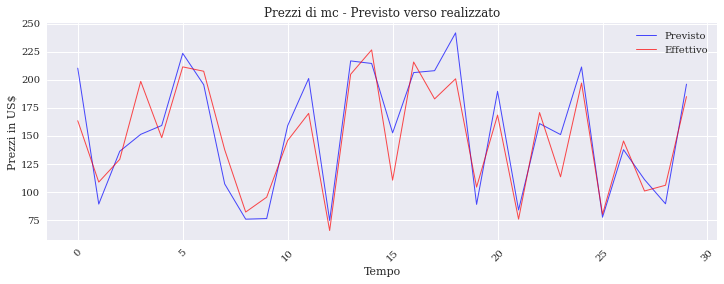

In [136]:
plt.figure(figsize=(12,4))
plt.plot(svm_prediction, label = 'Previsto', linewidth = '1', color ='b', alpha = .7)
plt.plot(y_test, label = 'Effettivo', linewidth = '1', color ='r', alpha = .7)
plt.title('Prezzi di mc - Previsto verso realizzato')
plt.ylabel('Prezzi in US$')
plt.xlabel('Tempo')
plt.legend()
plt.xticks(rotation = 45)
plt.show();

In [137]:
coca[str(future) + '_Day_Price_Forecast'] = coca[['Adj Close']].shift(-future)
X = np.array(coca[['Adj Close']])
X = X[:coca.shape[0] - future]
y = np.array(coca[str(future) + '_Day_Price_Forecast'])
y = y[:-future]
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 30, random_state=1)
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.1)
svr_rbf.fit(x_train,y_train)

SVR(C=1000.0, gamma=0.1)

In [138]:
svr_rbf_confidence = svr_rbf.score(x_test, y_test)
print('svr_rbf confidence score is: ', svr_rbf_confidence)
svm_prediction = svr_rbf.predict(x_test)

svr_rbf confidence score is:  0.7235299895024878


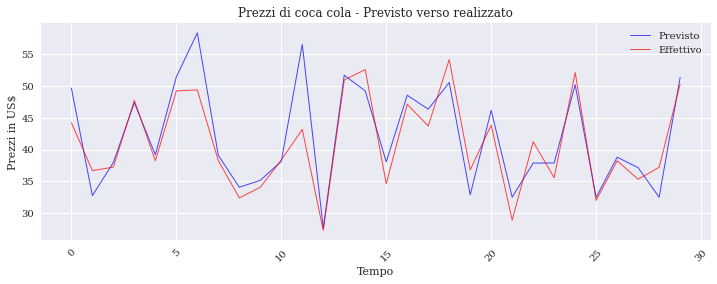

In [139]:
plt.figure(figsize=(12,4))
plt.plot(svm_prediction, label = 'Previsto', linewidth = '1', color ='b', alpha = .7)
plt.plot(y_test, label = 'Effettivo', linewidth = '1', color ='r', alpha = .7)
plt.title('Prezzi di coca cola - Previsto verso realizzato')
plt.ylabel('Prezzi in US$')
plt.xlabel('Tempo')
plt.legend()
plt.xticks(rotation = 45)
plt.show();

regressione lineare dei prezzi dei titoli

In [140]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt




In [141]:
from sklearn.metrics import mean_squared_error
from math import sqrt

In [142]:
tesla.head()

,Adj Close,10_Day_Price_Forecast
Date,,
2011-11-30,6.548000,5.860842
2011-12-31,5.996000,5.668667
2012-01-31,5.498000,6.346571
2012-02-29,6.552400,6.835100
2012-03-31,7.048182,7.037714


In [143]:
ford=ford.drop(columns=['10_Day_Price_Forecast'])

In [144]:
tesla=tesla.drop(columns=['10_Day_Price_Forecast'])

In [145]:
amazon=amazon.drop(columns=['10_Day_Price_Forecast'])

In [146]:
mc=mc.drop(columns=['10_Day_Price_Forecast'])

In [147]:
coca=coca.drop(columns=['10_Day_Price_Forecast'])

In [148]:
google=google.drop(columns=['10_Day_Price_Forecast'])

In [149]:
len(tesla)

121

In [150]:
# Numero di giorni nel futuro che si vogliono prevedere
forecast_out = 1

In [151]:
# Creiamo una colonna con la variabile da prevedere
tesla['Prediction'] = tesla[['Adj Close']].shift(-1)
ford['Prediction'] = ford[['Adj Close']].shift(-1)
google['Prediction'] = google[['Adj Close']].shift(-1)
amazon['Prediction'] = amazon[['Adj Close']].shift(-1)
mc['Prediction'] = mc[['Adj Close']].shift(-1)
coca['Prediction'] = coca[['Adj Close']].shift(-1)

In [152]:
tesla.head()

,Adj Close,Prediction
Date,,
2011-11-30,6.548000,5.996000
2011-12-31,5.996000,5.498000
2012-01-31,5.498000,6.552400
2012-02-29,6.552400,7.048182
2012-03-31,7.048182,6.699000


In [153]:
# "n" mesi in avanti da prevedere
forecast_out = 10
tesla['Prediction'] = tesla[['Adj Close']].shift(-forecast_out)


In [154]:
tesla.head(11)

,Adj Close,Prediction
Date,,
2011-11-30,6.548000,5.860842
2011-12-31,5.996000,5.668667
2012-01-31,5.498000,6.346571
2012-02-29,6.552400,6.835100
2012-03-31,7.048182,7.037714
2012-04-30,6.699000,7.473263
2012-05-31,6.154727,7.408600
2012-06-30,6.124667,9.247091
2012-07-31,6.208381,16.279818


In [155]:
# Creiamo un data set indipendente (X), trasformando il df in un array
Xtesla = np.array(tesla.drop(['Prediction'], 1))


C:\Users\david\AppData\Local\Temp/ipykernel_28016/3406184631.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  Xtesla = np.array(tesla.drop(['Prediction'], 1))


In [156]:
# Eliminiamo le ultime "n" righe
Xtesla = Xtesla[:-forecast_out]

print(Xtesla)
# attenzione, abbiamo creato una lista di liste

[[  6.54799986]
 [  5.99599995]
 [  5.49800005]
 [  6.55239999]
 [  7.04818186]
 [  6.699     ]
 [  6.15472731]
 [  6.12466667]
 [  6.2083809 ]
 [  5.8089565 ]
 [  5.86084208]
 [  5.66866664]
 [  6.34657145]
 [  6.83510008]
 [  7.03771428]
 [  7.47326316]
 [  7.4086    ]
 [  9.24709099]
 [ 16.27981823]
 [ 20.09609985]
 [ 24.631     ]
 [ 30.08136394]
 [ 34.79449997]
 [ 34.93747811]
 [ 27.45129995]
 [ 28.96200017]
 [ 32.81038103]
 [ 41.2046312 ]
 [ 46.62933331]
 [ 41.65752393]
 [ 39.93485714]
 [ 43.93171401]
 [ 44.64918206]
 [ 51.11752356]
 [ 52.98219045]
 [ 47.87634775]
 [ 49.31663192]
 [ 43.73227258]
 [ 40.65110016]
 [ 42.13463131]
 [ 38.94363629]
 [ 42.32228652]
 [ 48.44410038]
 [ 51.4003634 ]
 [ 53.31990936]
 [ 48.91009521]
 [ 50.58123852]
 [ 44.39654558]
 [ 44.17639999]
 [ 46.03436366]
 [ 40.91242118]
 [ 33.9340003 ]
 [ 43.22945421]
 [ 50.19180952]
 [ 43.32676206]
 [ 42.96781835]
 [ 44.67580013]
 [ 44.74686963]
 [ 40.45123836]
 [ 40.33666665]
 [ 37.83152408]
 [ 40.11057136]
 [ 47.86

In [157]:
# Creiamo il data set dipendente (y)
# Creiamo un altro array (tutti i valori compresi gli NaN)
ytesla = np.array(tesla['Prediction'])


In [158]:
# Eliminiamo gli NaN
ytesla = ytesla[:-forecast_out]


In [159]:
x_train, x_test, y_train, y_test = train_test_split(Xtesla, ytesla, test_size=0.25)


In [160]:
svr_rbf = SVR(kernel='rbf', C = 1000, gamma = 0.1)

In [161]:
svr_rbf.fit(x_train, y_train)


SVR(C=1000, gamma=0.1)

In [162]:
lr = LinearRegression()

In [163]:
lr.fit(x_test, y_test)

LinearRegression()

In [164]:
lr_confindence = lr.score(x_test, y_test)
print('lr_confindence: ', lr_confindence)

lr_confindence:  0.8895433758609053


In [165]:
x_forecast = np.array(tesla.drop(['Prediction'],1))[-forecast_out:]
print(x_forecast)

[[ 794.26947021]
 [ 656.802607  ]
 [ 709.61809431]
 [ 616.75299988]
 [ 626.91955012]
 [ 659.13475981]
 [ 705.24317239]
 [ 753.95238095]
 [ 878.34904843]
 [1120.66238258]]


C:\Users\david\AppData\Local\Temp/ipykernel_28016/2015955529.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  x_forecast = np.array(tesla.drop(['Prediction'],1))[-forecast_out:]


In [166]:
lr_prediction = lr.predict(x_forecast)
print(lr_prediction)

[1124.30709621  933.25579879 1006.65870577  877.59489824  891.72435874
  936.49702224 1000.57844403 1068.27444927 1241.16080283 1577.92761185]


In [167]:
lr_rmse = sqrt(mean_squared_error(x_forecast, lr_prediction))
print(lr_rmse)

318.6564573719001


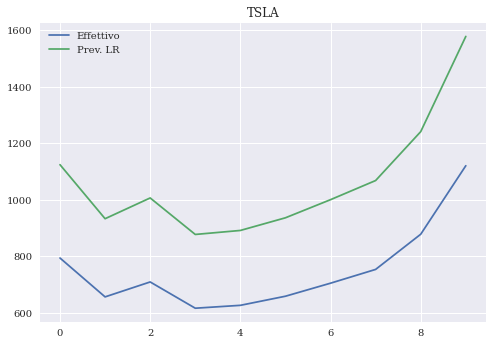

In [168]:
plt.title('TSLA')
plt.plot(x_forecast, label = 'Effettivo')
plt.plot(lr_prediction, label = 'Prev. LR')
plt.grid(True)
plt.legend();

In [169]:
ford['Prediction'] = ford[['Adj Close']].shift(-forecast_out)


In [170]:
Xford = np.array(ford.drop(['Prediction'], 1))


C:\Users\david\AppData\Local\Temp/ipykernel_28016/2408213478.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  Xford = np.array(ford.drop(['Prediction'], 1))


In [171]:
Xford = Xford[:-forecast_out]


In [172]:
yford = np.array(ford['Prediction'])


In [173]:
yford = yford[:-forecast_out]
print(yford)

[ 6.86148192  6.8916264   7.49627849  8.00384488  9.31057058  8.78847755
  9.00231252  8.96714657 10.05880217 10.61231031 11.59414868 11.53012479
 11.95639567 11.95328451 11.81381154 11.21208027 11.09704326 10.59663707
 10.82446829 11.27036948 11.26415298 11.93758097 12.40657451 12.27818553
 11.7823163  10.05301679 10.7301954  10.98876507 10.79919004 11.72807292
 11.77760233 11.58450962 11.34724188 11.10949633 10.79401042 10.63139911
 10.24310784 11.09338799 10.80218682 10.53393693  9.33893359  9.20963249
 10.33539313 10.24019745 10.43715559 10.18329599 10.45469041  9.75687616
  9.70275298  9.53110713  9.44904441 10.0780656  10.16447549 10.18872863
  9.93146287  9.28319509  9.08218358  9.22204798  9.47321711  9.04226627
  9.73979049 10.24116    10.30313982 10.63558087 10.46572949  9.23395142
  9.3570543   9.77865101  9.97465281 10.34004938  9.46768379  8.70848088
  8.42944492  7.99720072  8.48556473  7.62261642  7.73838974  7.969049
  7.94458741  8.79184682  9.50135994  9.31687999  9.5

In [174]:
x_trainf, x_testf, y_trainf, y_testf = train_test_split(Xford, yford, test_size=30)

In [175]:
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.1)

In [176]:
svr_rbf.fit(x_trainf, y_trainf)

SVR(C=1000.0, gamma=0.1)

In [177]:
lr=LinearRegression()

In [178]:
lr.fit(x_testf, y_testf)

LinearRegression()

In [179]:
lr_confindence = lr.score(x_testf, y_testf)
print('lr_confindence ford: ', lr_confindence)

lr_confindence ford:  0.03087222501210518


In [180]:
x_forecast = np.array(ford.drop(['Prediction'],1))[-forecast_out:]
print(x_forecast)

[[11.33449374]
 [12.29582169]
 [12.00024423]
 [12.17495403]
 [14.91262245]
 [13.91404588]
 [13.12827492]
 [13.09692251]
 [15.24485729]
 [19.2400074 ]]


C:\Users\david\AppData\Local\Temp/ipykernel_28016/494277468.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  x_forecast = np.array(ford.drop(['Prediction'],1))[-forecast_out:]


In [181]:
lr_prediction = lr.predict(x_forecast)
print(lr_prediction)

[10.34855522 10.48947199 10.44614461 10.47175454 10.87305712 10.72668024
 10.61149759 10.60690178 10.92175794 11.50738915]


In [182]:
lr_rmse = sqrt(mean_squared_error(x_forecast, lr_prediction))
print(lr_rmse)

3.56434313863349


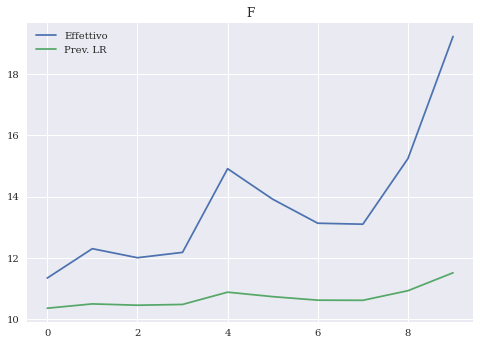

In [183]:
plt.title('F')
plt.plot(x_forecast, label = 'Effettivo')
plt.plot(lr_prediction, label = 'Prev. LR')
plt.grid(True)
plt.legend();


In [184]:
google['Prediction'] = google[['Adj Close']].shift(-forecast_out)


In [185]:
Xgoogle = np.array(google.drop(['Prediction'], 1))


C:\Users\david\AppData\Local\Temp/ipykernel_28016/4164511634.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  Xgoogle = np.array(google.drop(['Prediction'], 1))


In [186]:
Xgoogle = Xgoogle[:-forecast_out]


In [187]:
ygoogle = np.array(google['Prediction'])


In [188]:
ygoogle = ygoogle[:-forecast_out]


In [189]:
x_traing, x_testg, y_traing, y_testg = train_test_split(Xgoogle, ygoogle, test_size=30)

In [190]:
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.1)

In [191]:
svr_rbf.fit(x_traing, y_traing)

SVR(C=1000.0, gamma=0.1)

In [192]:
lr = LinearRegression()

In [193]:
lr.fit(x_testg, y_testg)

LinearRegression()

In [194]:
lr_confindence = lr.score(x_testg, y_testg)
print('lr_confindence google: ', lr_confindence)

lr_confindence google:  0.9109719626390879


In [195]:
x_forecast = np.array(google.drop(['Prediction'],1))[-forecast_out:]
print(x_forecast)

[[2068.35682437]
 [2059.84478494]
 [2289.84236654]
 [2352.59549561]
 [2501.39409846]
 [2646.78570266]
 [2786.40682706]
 [2837.63809059]
 [2808.97381882]
 [2948.65048363]]


C:\Users\david\AppData\Local\Temp/ipykernel_28016/2949590156.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  x_forecast = np.array(google.drop(['Prediction'],1))[-forecast_out:]


In [196]:
lr_prediction = lr.predict(x_forecast)
print(lr_prediction)

[3009.94760106 2996.64787468 3356.01003789 3454.05933065 3686.55128745
 3913.71994304 4131.8724512  4211.91928282 4167.13248707 4385.37177493]


In [197]:
lr_rmse = sqrt(mean_squared_error(x_forecast, lr_prediction))
print(lr_rmse)

1213.7355071498607


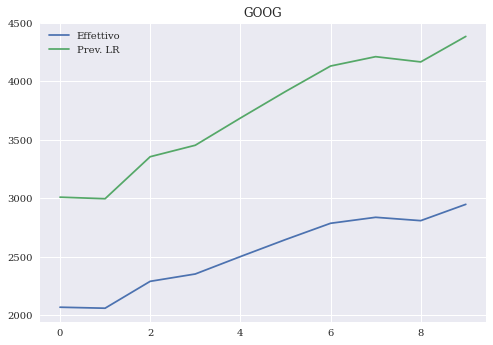

In [198]:
plt.title('GOOG')
plt.plot(x_forecast, label = 'Effettivo')
plt.plot(lr_prediction, label = 'Prev. LR')
plt.grid(True)
plt.legend();

In [199]:
amazon['Prediction'] = amazon[['Adj Close']].shift(-forecast_out)

In [200]:
Xamazon = np.array(amazon.drop(['Prediction'], 1))
Xamazon = Xamazon[:-forecast_out]
yamazon = np.array(amazon['Prediction'])
yamazon = yamazon[:-forecast_out]

C:\Users\david\AppData\Local\Temp/ipykernel_28016/3272837963.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  Xamazon = np.array(amazon.drop(['Prediction'], 1))


In [201]:
x_traina, x_testa, y_traina, y_testa = train_test_split(Xamazon, yamazon, test_size=30)

In [202]:
svr_rbf = SVR(kernel='rbf', C=1000, gamma=0.1)

In [203]:
svr_rbf.fit(x_traina, y_traina)

SVR(C=1000, gamma=0.1)

In [204]:
lr=LinearRegression()

In [205]:
lr.fit(x_testa, y_testa)

LinearRegression()

In [206]:
lr_confindencea = lr.score(x_testa, y_testa)
print('lr_confindence amazon: ', lr_confindencea)

lr_confindence amazon:  0.8962695563529827


In [207]:
x_forecasta = np.array(amazon.drop(['Prediction'],1))[-forecast_out:]
print(x_forecasta)

[[163.19342121]
 [153.41363127]
 [167.60871379]
 [162.31299973]
 [168.38627139]
 [180.80030968]
 [165.6458872 ]
 [171.35914321]
 [166.71031044]
 [175.88092768]]


C:\Users\david\AppData\Local\Temp/ipykernel_28016/2432815496.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  x_forecasta = np.array(amazon.drop(['Prediction'],1))[-forecast_out:]


In [208]:
lr_predictiona = lr.predict(x_forecasta)
print(lr_predictiona)

[192.01699315 180.88082039 197.04465337 191.01446387 197.93005233
 212.06582374 194.8095976  201.31523897 196.02164828 206.4641607 ]


In [209]:
lr_rmse = sqrt(mean_squared_error(x_forecasta, lr_predictiona))
print(lr_rmse)

29.441873358681423


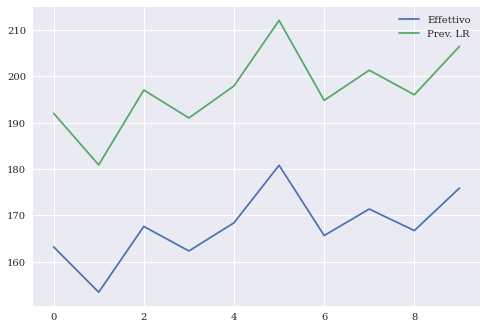

In [210]:
plt.plot(x_forecasta, label = 'Effettivo')
plt.plot(lr_predictiona, label = 'Prev. LR')
plt.grid(True)
plt.legend();

In [211]:

mc['Prediction'] = mc[['Adj Close']].shift(-forecast_out)

Xmc = np.array(mc.drop(['Prediction'], 1))

Xmc = Xmc[:-forecast_out]
ymc = np.array(mc['Prediction'])

ymc = ymc[:-forecast_out]

C:\Users\david\AppData\Local\Temp/ipykernel_28016/1895956720.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  Xmc = np.array(mc.drop(['Prediction'], 1))


In [212]:
x_trainm, x_testm, y_trainm, y_testm = train_test_split(Xmc, ymc, test_size=30)

In [213]:
svr_rbf = SVR(kernel='rbf', C = 1e3, gamma = 0.1)

In [214]:
svr_rbf.fit(x_trainm, y_trainm)

SVR(C=1000.0, gamma=0.1)

In [215]:
lr = LinearRegression()

In [216]:
lr.fit(x_testm, y_testm)

LinearRegression()

In [217]:
lr_confindence = lr.score(x_testm, y_testm)
print('lr_confindence: mc ', lr_confindence)

lr_confindence: mc  0.8717622248398373


In [218]:
x_forecast = np.array(mc.drop(['Prediction'],1))[-forecast_out:]
print(x_forecast)

[[205.13999778]
 [211.43440446]
 [225.72958883]
 [226.5736496 ]
 [228.12734639]
 [232.07209051]
 [232.3371256 ]
 [237.43683225]
 [239.18751889]
 [247.95015535]]


C:\Users\david\AppData\Local\Temp/ipykernel_28016/1978269247.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  x_forecast = np.array(mc.drop(['Prediction'],1))[-forecast_out:]


In [219]:
lr_prediction = lr.predict(x_forecast)
print(lr_prediction)

[225.03160161 231.36879546 245.76115348 246.61095188 248.17521016
 252.14676928 252.41360598 257.54797864 259.31056584 268.13276763]


In [220]:
lr_rmse = sqrt(mean_squared_error(x_forecast, lr_prediction))
print(lr_rmse)

20.05123590638203


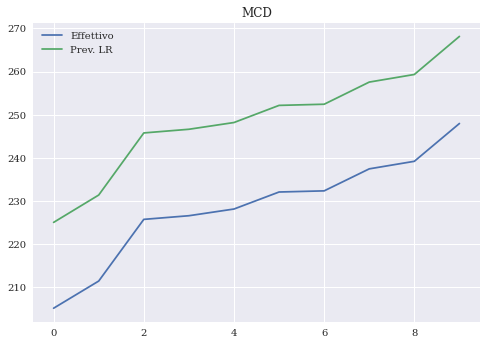

In [221]:
plt.title('MCD')
plt.plot(x_forecast, label = 'Effettivo')
plt.plot(lr_prediction, label = 'Prev. LR')
plt.grid(True)
plt.legend();

In [222]:
coca['Prediction'] = coca[['Adj Close']].shift(-forecast_out)

Xcoca = np.array(coca.drop(['Prediction'], 1))

Xcoca = Xcoca[:-forecast_out]

ycoca = np.array(coca['Prediction'])

ycoca = ycoca[:-forecast_out]

C:\Users\david\AppData\Local\Temp/ipykernel_28016/3923405713.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  Xcoca = np.array(coca.drop(['Prediction'], 1))


In [223]:
x_trainc, x_testc, y_trainc, y_testc = train_test_split(Xcoca, ycoca, test_size=30)

In [224]:
svr_rbf=SVR(kernel='rbf', C=1000, gamma=0.1)

In [225]:
svr_rbf.fit(x_trainc, y_trainc)

SVR(C=1000, gamma=0.1)

In [226]:
lr = LinearRegression()

In [227]:
lr.fit(x_testc, y_testc)

LinearRegression()

In [228]:
lr_confindencec = lr.score(x_testc, y_testc)
print('lr_confindence coca cola: ', lr_confindencec)

lr_confindence coca cola:  0.8585639837085566


In [229]:
x_forecastc = np.array(coca.drop(['Prediction'],1))[-forecast_out:]
print(x_forecastc)

[[47.6278805 ]
 [49.23143801]
 [51.61325182]
 [52.58646355]
 [53.21543919]
 [54.07599713]
 [54.8815585 ]
 [53.52506383]
 [53.1097463 ]
 [54.57102839]]


C:\Users\david\AppData\Local\Temp/ipykernel_28016/3240623570.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  x_forecastc = np.array(coca.drop(['Prediction'],1))[-forecast_out:]


In [230]:
lr_prediction = lr.predict(x_forecastc)
print(lr_prediction)

[47.92743703 49.31627989 51.37917135 52.22207106 52.76682753 53.51215767
 54.20985523 53.03499376 52.6752868  53.94090477]


In [231]:
lr_rmse = sqrt(mean_squared_error(x_forecastc, lr_prediction))
print(lr_rmse)

0.4561622490082611


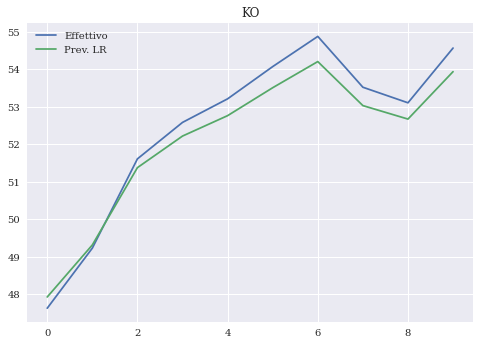

In [232]:
plt.title('KO')
plt.plot(x_forecastc, label = 'Effettivo')
plt.plot(lr_prediction, label = 'Prev. LR')
plt.grid(True)
plt.legend();

# 4 TRADING E BACKTESTING
## a) Strategia SMA e BUY AND HOLD

In [233]:
import pandas_datareader.data as web
import matplotlib.dates as mdates
from matplotlib import style
style.use('ggplot')

start_date = '2011-11-30'
end_date = '2021-11-30'

ticker = 'TSLA'
tesla1 = web.DataReader(ticker, 'yahoo', start_date, end_date)
tesla1 = tesla1.drop(columns = ['High', 'Low', 'Open', 'Close'])

tesla1.head()



,Volume,Adj Close
Date,,
2011-11-30,3801500.0,6.548
2011-12-01,5151000.0,6.520
2011-12-02,4014000.0,6.660
2011-12-05,5800500.0,6.884
2011-12-06,4759000.0,6.974


In [234]:
#medie mobili dopo circa 1 mese e 6 mesi
tesla1['SMA20'] = tesla1['Adj Close'].rolling(20).mean()
tesla1['SMA120'] = tesla1['Adj Close'].rolling(120).mean()


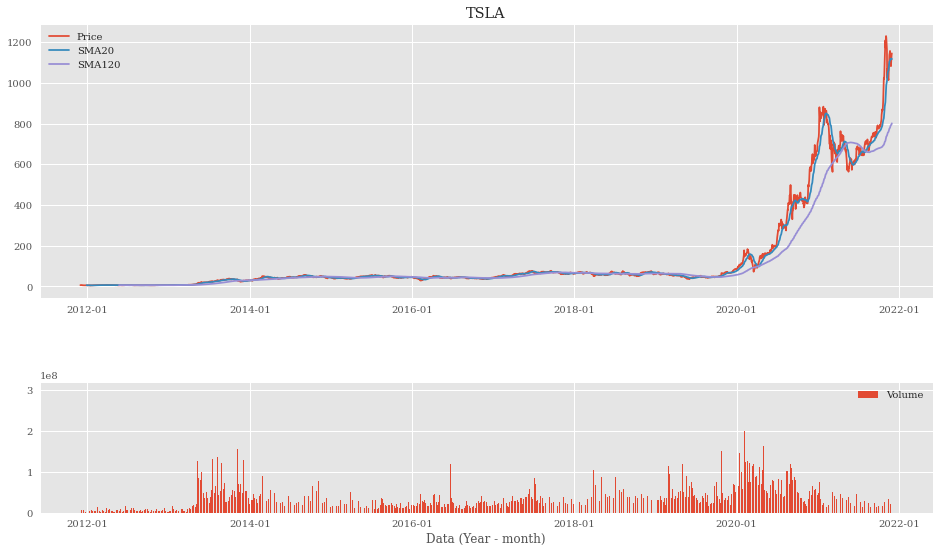

In [235]:
#visualizzazione strategie sma dopo 1 e 6 mesi

plt.figure(figsize=(16,9))
ax1 = plt.subplot2grid((7,1), (0,0), rowspan = 4, colspan = 1, title = 'TSLA')
ax2 = plt.subplot2grid((7,1), (5,0), rowspan = 2, colspan = 1, sharex = ax1)
ax1.plot(tesla1['Adj Close'], label = 'Price')
ax1.plot(tesla1['SMA20'], label = 'SMA20')
ax1.plot(tesla1['SMA120'], label = 'SMA120')

ax2.bar(tesla1.index, tesla1['Volume'], label = 'Volume')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax2.set_xlabel('Data (Year - month)')
ax1.legend()
ax2.legend();

In [236]:
#creo strategia
tesla1['Price_yesterday'] = tesla1['Adj Close'].shift(1)
tesla1['Change'] = tesla1['Adj Close'] / tesla1['Price_yesterday']
tesla1['Invested_SMA'] = [1 if tesla1.loc[i, 'SMA20'] > tesla1.loc[i, 'SMA120'] 
                        else 0 for i in tesla1.index]

In [237]:
#rendimento della strategia
sma = tesla1[tesla1['Invested_SMA'] == 1]

sma['Return'] = np.cumprod(sma['Change'])
sma['rtn']=sma['Return'].pct_change()
print(sma['rtn'].std()*np.sqrt(252))
print(sma['rtn'].mean()*252 / (sma['rtn'].std()*np.sqrt(252)))





0.5928592388264708
1.429804369881131


C:\Users\david\AppData\Local\Temp/ipykernel_28016/1821730154.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma['Return'] = np.cumprod(sma['Change'])
C:\Users\david\AppData\Local\Temp/ipykernel_28016/1821730154.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma['rtn']=sma['Return'].pct_change()


In [238]:
#creo strategia buy and hold e la confronto all'sma
#rendimento del buy and hold:

tesla1['Buy_and_hold'] = np.cumprod(tesla1['Change'])
tesla1['rtn'] = tesla1['Buy_and_hold'].pct_change()
print(tesla1['rtn'].std())
print(tesla1['rtn'].mean()*252 / (tesla1['rtn'].std()*np.sqrt(252)))

0.03501613144588133
1.2083938712561122


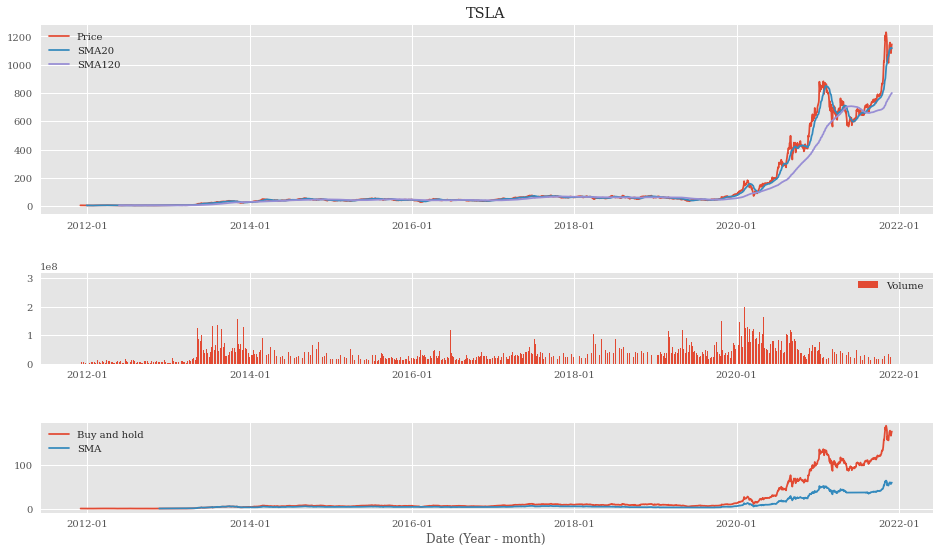

In [239]:
#plotto il confronto di tesla tra le strategie sma e buy and hold
plt.figure(figsize=(16,9))
ax1 = plt.subplot2grid((10,1), (0,0), rowspan = 4, colspan = 1, title = ticker)
ax2 = plt.subplot2grid((10,1), (5,0), rowspan = 2, colspan = 1, sharex = ax1)
ax3 = plt.subplot2grid((10,1), (8,0), rowspan = 2, colspan = 1, sharex = ax1)
ax1.plot(tesla1['Adj Close'], label = 'Price')
ax1.plot(tesla1['SMA20'], label = 'SMA20')
ax1.plot(tesla1['SMA120'], label = 'SMA120')

ax2.bar(tesla1.index, tesla1['Volume'], label = 'Volume')
ax3.plot(tesla1['Buy_and_hold'], label = 'Buy and hold')
ax3.plot(sma['Return'], label = 'SMA')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax3.set_xlabel('Date (Year - month)')
ax1.legend()
ax2.legend()
ax3.legend()
plt.show()


In [240]:
#ritorni:
print(tesla1['Buy_and_hold'][-1])
print(sma['Return'][-1])

174.82590629829136
59.60161256789696


In [241]:
##simulazione con tutti i titoli
tickers = ['GOOG', 'KO', 'MCD', 'TSLA', 'AMZN', 'F']
for ticker in tickers:
    datatitoli = web.DataReader(ticker, 'yahoo', start, end)
    datatitoli = datatitoli.drop(columns = ['High', 'Low', 'Open', 'Close'])
    datatitoli['SMA20'] = datatitoli['Adj Close'].rolling(20).mean()
    datatitoli['SMA120'] = datatitoli['Adj Close'].rolling(120).mean()
    datatitoli['Price_yesterday'] = datatitoli['Adj Close'].shift(1)
    datatitoli['Change'] = datatitoli['Adj Close'] / datatitoli['Price_yesterday']
    datatitoli['Invested_SMA'] = [1 if datatitoli.loc[i, 'SMA20'] > datatitoli.loc[i, 'SMA120'] 
                        else 0 for i in datatitoli.index]
    datatitoli['Buy_and_hold'] = np.cumprod(datatitoli['Change'])
    sma = datatitoli[datatitoli['Invested_SMA'] == 1]
    sma['Return'] = np.cumprod(sma['Change'])
    print('Buy and hold strategy return: ' + ticker + ' '+   str(datatitoli['Buy_and_hold'][-1]))
    print('SMA return: ' + ticker + ' ' + str(sma['Return'][-1]))


C:\Users\david\AppData\Local\Temp/ipykernel_28016/129289860.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma['Return'] = np.cumprod(sma['Change'])


Buy and hold strategy return: GOOG 9.542097526363643
SMA return: GOOG 3.793976678052878


C:\Users\david\AppData\Local\Temp/ipykernel_28016/129289860.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma['Return'] = np.cumprod(sma['Change'])


Buy and hold strategy return: KO 2.1342788750421033
SMA return: KO 1.204337341148303


C:\Users\david\AppData\Local\Temp/ipykernel_28016/129289860.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma['Return'] = np.cumprod(sma['Change'])


Buy and hold strategy return: MCD 3.399967444851944
SMA return: MCD 1.9328979559980788


C:\Users\david\AppData\Local\Temp/ipykernel_28016/129289860.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma['Return'] = np.cumprod(sma['Change'])


Buy and hold strategy return: TSLA 174.82590629829136
SMA return: TSLA 59.60161256789696


C:\Users\david\AppData\Local\Temp/ipykernel_28016/129289860.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma['Return'] = np.cumprod(sma['Change'])


Buy and hold strategy return: AMZN 18.23844188791113
SMA return: AMZN 5.744323953836331
Buy and hold strategy return: F 2.6841157036271164
SMA return: F 3.110748130069213


C:\Users\david\AppData\Local\Temp/ipykernel_28016/129289860.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma['Return'] = np.cumprod(sma['Change'])


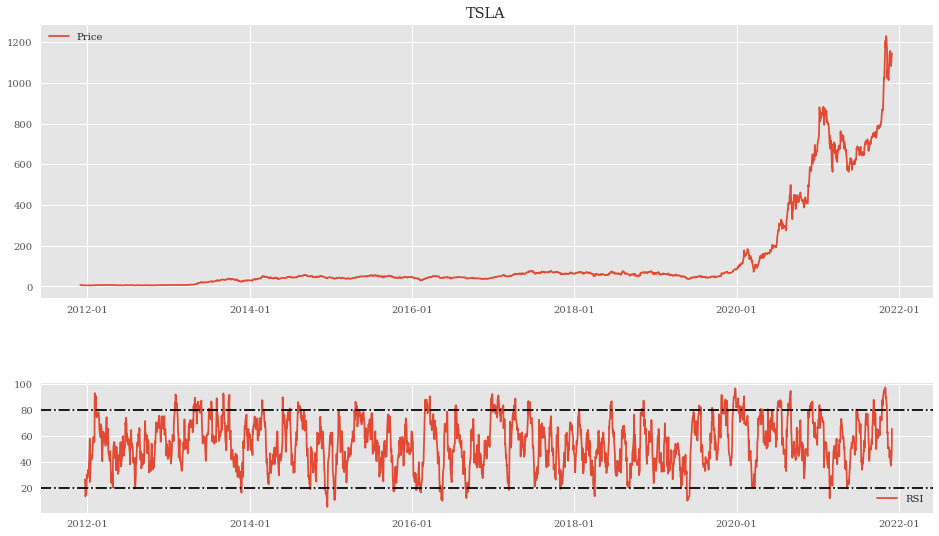

In [242]:
#rsi per tesla
ticker = 'TSLA'
start = dt.datetime(2011, 11, 30)
end = dt.datetime(2021,11,30)
datatesla = web.DataReader(ticker, 'yahoo', start, end)
datatesla = datatesla.drop(columns = ['High', 'Low', 'Open', 'Close'])

datatesla['abs_change'] = datatesla['Adj Close'].diff(1)
datatesla['up'] = [1 if datatesla.loc[i, 'abs_change'] >  0 else 0 for i in datatesla.index]
datatesla['down'] = [1 if datatesla.loc[i, 'abs_change'] <  0 else 0 for i in datatesla.index]

datatesla['positive_movement'] = datatesla['up'] * datatesla['abs_change']
datatesla['negative_movement'] = datatesla['down'] * datatesla['abs_change'] * - 1

datatesla['avg_gain'] = datatesla['positive_movement'].rolling(14).mean()
datatesla['avg_loss'] = datatesla['negative_movement'].rolling(14).mean()

datatesla['RS'] = datatesla['avg_gain'] / datatesla['avg_loss']
datatesla['RSI'] = 100 - (100 / (1 + datatesla['RS']))

plt.figure(figsize=(16,9))
ax1 = plt.subplot2grid((7,1), (0,0), rowspan = 4, colspan = 1, title = ticker)
ax2 = plt.subplot2grid((7,1), (5,0), rowspan = 2, colspan = 1, sharex = ax1)
ax1.plot(datatesla['Adj Close'], label = 'Price')
ax2.plot(datatesla['RSI'], label = 'RSI')
ax2.axhline(80, linestyle = '-.', color = 'black')
ax2.axhline(20, linestyle = '-.', color = 'black')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax1.legend()
ax2.legend()
plt.show()         

In [243]:
#backtesting con rsi(relative strength index) per tutti i titoli
results = pd.DataFrame(columns = ['Ticker', 'RSI'])
for ticker in tickers:
    datatitoli = web.DataReader(ticker, 'yahoo', start, end)
    datatitoli = datatitoli.drop(columns = ['High', 'Low', 'Open', 'Close'])
    datatitoli['abs_change'] = datatitoli['Adj Close'].diff(1)
    datatitoli['up'] = [1 if datatitoli.loc[i, 'abs_change'] >  0 else 0 for i in datatitoli.index]
    datatitoli['down'] = [1 if datatitoli.loc[i, 'abs_change'] <  0 else 0 for i in datatitoli.index]
    datatitoli['positive_movement'] = datatitoli['up'] * datatitoli['abs_change']
    datatitoli['negative_movement'] = datatitoli['down'] * datatitoli['abs_change'] * - 1
    datatitoli['avg_gain'] = datatitoli['positive_movement'].rolling(14).mean()
    datatitoli['avg_loss'] = datatitoli['negative_movement'].rolling(14).mean()
    datatitoli['RS'] = datatitoli['avg_gain'] / datatitoli['avg_loss']
    datatitoli['RSI'] = 100 - (100 / (1 + datatitoli['RS']))
    
    new_row = {'Ticker': ticker, 'RSI': datatitoli['RSI'][-1]}
    results = results.append(new_row, ignore_index = True)
    

In [244]:
results

,Ticker,RSI
0,GOOG,35.059671
1,KO,25.294872
2,MCD,37.202903
3,TSLA,65.379749
4,AMZN,44.728185
5,F,40.871838


## b) Google Trends

In [245]:
#analisi con google trends

In [246]:

pip install pytrends

Note: you may need to restart the kernel to use updated packages.


In [247]:
from pytrends.request import TrendReq
pytrends = TrendReq(hl='en-US')

In [248]:
all_keywords = ['Amazon',
                'Tesla', 'Google',
               'Mc Donalds', 'Coca Cola',
               'Ford']
keywords = []
timeframes = ['today 5-y', 'today 12-m',
              'today 3m', 'today 1-m']
kw_list = ['Blockchain']
cat='0'
geo = ''
gprop = ''

def check_trends():
    pytrends.build_payload(keywords,
                       cat,
                       timeframes[0],
                       geo,
                       gprop)

    trends_data = pytrends.interest_over_time()
    trends_mean = round(trends_data.mean(),2)
    trends_avg = round(trends_data[kw][-52:].mean(),2) #Media dell'ultimo anno
    trends_avg2 = round(trends_data[kw][:52].mean(),2) #Media annuale di cinque anni fa
    trend = round(((trends_avg/trends_mean[kw])-1)*100, 2)
    trend2 = round(((trends_avg/trends_avg2)-1)*100,2) 
    print("L'interesse medio negli ultimi cinque anni per " + kw  + ' è stato ' + str(trends_mean[kw]))
    print("L'interesse medio nell'ultimo anno per " + kw  +
          ' a confronto con gli ultimi 5 anni è cambiato del ' + 
          str(trend) + '%.')
    #Trend stabile
    if trends_mean[kw] > 75 and abs(trend) <= 5:
        print("L'interesse per " +  kw + ' è stabile negli ultimi 5 anni.')
    elif trends_mean[kw] > 75 and trend > 5:
        print("L'interesse per " +  kw + ' è stabile e crescente negli ultimi 5 anni.')
    elif trends_mean[kw] > 75 and trend < -5:
        print("L'interesse per " +  kw +  'è stabile e decrescente negli ultimi 5 anni.')
     #Trend relativamente stabile
    elif trends_mean[kw] > 60 and abs(trend) <= 15:
        print("L'interesse per " +  kw + ' è relativamente stabile negli ultimi 5 anni.')
    elif trends_mean[kw] > 60 and trend > 15:
        print("L'interesse per " +  kw + ' è relativamente stabile e crescente negli ultimi 5 anni.')   
    elif trends_mean[kw] > 60 and trend < -15:
        print("L'interesse per " +  kw + ' è relativamente stabile e decrescente negli ultimi 5 anni')   

     #Cicli stagionali
    elif trends_mean[kw] > 20 and abs(trend) <= 15:
        print("L'interesse per " +  kw + ' è stagionale.')
    
    #Nuovo termine/prodotto
    elif trends_mean[kw] > 20 and trend < 15:
        print("L'interesse per " +  kw + ' è con trend positivo.')
    
    #Prodotto o termine in declino
    elif trends_mean[kw] > 20 and trend < -15:
        print("L'interesse per " +  kw + ' ha un trend negativo.')
    
    #Prodotto o termine ciclico
    elif trends_mean[kw] > 5 and abs(trend) <= 15:
        print("L'interesse per " +  kw + ' è ciclico.')
    
    #Prodotto nuovo
    elif trends_mean[kw] > 0 and trend > 15:
        print("L'interesse per " +  kw + ' è nuovo e con trend positivo.')
    
    #Prodotto in declino
    elif trends_mean[kw] > 0 and trend < -15:
        print("L'interesse per " +  kw + ' è in declino.')
    
    #Other
    else:
        print('Occorre fare altre verifiche')
        
    # Confronto con 5 anni fa
    if trends_avg2 == 0:
        print("Il prodotto/termine non esisteva 5 anni fa")
    elif trend2 >15:
        print("L'interesse nell'ultimo anno è stato molto più alto rispetto a 5 anni fa." + 
             "E' aumentato del " + str(trend2) + '%.')
    elif trend2 <15:
        print("L'interesse nell'ultimo anno è stato molto più basso rispetto a 5 anni fa." + 
             "E' diminuito del " + str(trend2) + '%.')
    else:
        print("l'interesse nell'ultimo anno è paragonabile a quello di 5 anni fa." + 
             "La variazione è stata del " + str(trend2) + '%.')
        
    print('')
        
        
for kw in all_keywords:
    keywords.append(kw)
    check_trends()
    keywords.pop()


L'interesse medio negli ultimi cinque anni per Amazon è stato 67.03
L'interesse medio nell'ultimo anno per Amazon a confronto con gli ultimi 5 anni è cambiato del -4.27%.
L'interesse per Amazon è relativamente stabile negli ultimi 5 anni.
L'interesse nell'ultimo anno è stato molto più basso rispetto a 5 anni fa.E' diminuito del 4.66%.

L'interesse medio negli ultimi cinque anni per Tesla è stato 38.16
L'interesse medio nell'ultimo anno per Tesla a confronto con gli ultimi 5 anni è cambiato del 24.74%.
L'interesse per Tesla è nuovo e con trend positivo.
L'interesse nell'ultimo anno è stato molto più alto rispetto a 5 anni fa.E' aumentato del 79.22%.

L'interesse medio negli ultimi cinque anni per Google è stato 59.39
L'interesse medio nell'ultimo anno per Google a confronto con gli ultimi 5 anni è cambiato del -15.32%.
L'interesse per Google è con trend positivo.
L'interesse nell'ultimo anno è stato molto più basso rispetto a 5 anni fa.E' diminuito del -25.5%.

L'interesse medio negli u

## 5 CAPM
## a) beta di ciascun titolo rispetto al mercato, indice S&P500, ^GSPC

La covarianza dei rendimenti del portafoglio di mercato con se stessi è pari alla varianza dei rendimenti del portafoglio di mercato, pertanto il beta del portafoglio di mercato è pari a 1. Avremo un beta inferiore a 1 se il titolo ha varianza inferiore, quindi è meno rischioso rispetto al portafoglio di mercato. Se il beta è superiore ad 1 il titolo è più rischioso del portafoglio di mercato.

In [249]:
pip install pandas-datareader

Note: you may need to restart the kernel to use updated packages.


In [250]:
import pandas_datareader.data as web
import statsmodels.api as sm
from datetime import date, datetime

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import warnings

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)


In [251]:
#Amazon
risky_asset = 'AMZN'
market_benchmark = '^GSPC' # S&P 500
start_date = '2011-11-30'
end_date = '2021-11-30'
amzn_df = web.get_data_yahoo([risky_asset, market_benchmark],
start = start_date, end = end_date)
amzn_df.head()

Attributes Adj Close                Close                 High               \
Symbols         AMZN        ^GSPC    AMZN        ^GSPC    AMZN        ^GSPC   
Date                                                                          
2011-11-30    9.6145  1246.959961  9.6145  1246.959961  9.7650  1247.109985   
2011-12-01    9.8565  1244.579956  9.8565  1244.579956  9.9035  1251.089966   
2011-12-02    9.8015  1244.280029  9.8015  1244.280029  9.9830  1260.079956   
2011-12-05    9.8120  1257.079956  9.8120  1257.079956  9.9500  1266.729980   
2011-12-06    9.5995  1258.469971  9.5995  1258.469971  9.9160  1266.030029   

Attributes     Low                 Open                  Volume              
Symbols       AMZN        ^GSPC    AMZN        ^GSPC       AMZN       ^GSPC  
Date                                                                         
2011-11-30  9.4375  1196.719971  9.7380  1196.719971  154340000  5801910000  
2011-12-01  9.5795  1239.729980  9.5925  1246.910034  146554000  3818680000  
2011-12-02  9.7590  1243.349976  9.8535  1246.030029  150524000  4144310000  
2011-12-05  9.6835  1244.329956  9.9430  1244.329956  118442000  4148060000  
2011-12-06  9.5055  1253.030029  9.7990  1257.189941  104040000  3734230000

In [252]:
X_amzn = amzn_df['Adj Close'].rename(columns={risky_asset:'asset', market_benchmark:'market'})\
.resample('M').last().pct_change().dropna()
X_amzn.head()

Symbols,asset,market
Date,,
2011-12-31,-0.099797,0.008533
2012-01-31,0.123281,0.043583
2012-02-29,-0.075859,0.040589
2012-03-31,0.126996,0.031332
2012-04-30,0.145129,-0.007497


In [253]:
X_amzn.cov()

Symbols,asset,market
Symbols,,
asset,0.006564,0.001730
market,0.001730,0.001415


In [254]:
covariance = X_amzn.cov().iloc[0,1]
benchmark_variance = X_amzn.market.var()
#varianza
X_amzn.market.var()

0.0014154534392805914

In [255]:
#beta di amazon rispetto al mercato
beta_amzn = covariance / benchmark_variance
print('beta di AMZN: ', beta_amzn)


beta di AMZN:  1.2221363383281458


In [256]:
# google
risky_asset = 'GOOG'
market_benchmark = '^GSPC' # S&P 500
goog_df = web.get_data_yahoo([risky_asset, market_benchmark],
                       start = start_date, end = end_date)

X_goog = goog_df['Adj Close'].rename(columns={risky_asset:'asset', market_benchmark:'market'})\
.resample('M').last().pct_change().dropna()

covarianceg = X_goog.cov().iloc[0,1]
benchmark_varianceg = X_goog.market.var()

#beta di google rispetto al mercato
beta_goog = covarianceg / benchmark_varianceg
print('beta di GOOG: ', beta_goog)


beta di GOOG:  1.0183383004170785


In [257]:
# tesla
risky_asset = 'TSLA' 
market_benchmark = '^GSPC' # S&P 500
tsla_df = web.get_data_yahoo([risky_asset, market_benchmark],
                       start = start_date, end = end_date)

X_tsla = tsla_df['Adj Close'].rename(columns={risky_asset:'asset', market_benchmark:'market'})\
.resample('M').last().pct_change().dropna()

covariancet = X_tsla.cov().iloc[0,1]
benchmark_variancet = X_tsla.market.var()

#beta di tesla rispetto al mercato
beta_tsla = covariancet / benchmark_variancet
print('beta di TSLA: ', beta_tsla)


beta di TSLA:  1.813991230108995


In [258]:
# ford
risky_asset = 'F' 
market_benchmark = '^GSPC' # S&P 500
ford_df = web.get_data_yahoo([risky_asset, market_benchmark],
                       start = start_date, end = end_date)

X_ford = ford_df['Adj Close'].rename(columns={risky_asset:'asset', market_benchmark:'market'})\
.resample('M').last().pct_change().dropna()

covariancef = X_ford.cov().iloc[0,1]
benchmark_variancef = X_ford.market.var()

#beta di ford rispetto al mercato
beta_ford = covariancef / benchmark_variancef
print('beta di F: ', beta_ford)
 

beta di F:  1.103138942888097


In [259]:
# coca-cola
risky_asset = 'KO' 
market_benchmark = '^GSPC' # S&P 500
ko_df = web.get_data_yahoo([risky_asset, market_benchmark],
                       start = start_date, end = end_date)

X_ko = ko_df['Adj Close'].rename(columns={risky_asset:'asset', market_benchmark:'market'})\
.resample('M').last().pct_change().dropna()

covariancek = X_ko.cov().iloc[0,1]
benchmark_variancek = X_ko.market.var()

#beta di coca cola rispetto al mercato
beta_ko = covariancek / benchmark_variancek
print('beta di KO: ', beta_ko)


beta di KO:  0.6731344303368715


In [260]:
# mc donald's
risky_asset = 'MCD' 
market_benchmark = '^GSPC' # S&P 500
mcd_df = web.get_data_yahoo([risky_asset, market_benchmark],
                       start = start_date, end = end_date)

X_mcd = mcd_df['Adj Close'].rename(columns={risky_asset:'asset', market_benchmark:'market'})\
.resample('M').last().pct_change().dropna()


covariancem = X_mcd.cov().iloc[0,1]
benchmark_variancem = X_mcd.market.var()

#beta di mc donalds rispetto al mercato
beta_mcd = covariancem / benchmark_variancem
print('beta di MCD: ', beta_mcd)


beta di MCD:  0.6139142377644888


In [261]:
X_mcd.head()

Symbols,asset,market
Date,,
2011-12-31,0.050356,0.008533
2012-01-31,-0.012758,0.043583
2012-02-29,0.009362,0.040589
2012-03-31,-0.011886,0.031332
2012-04-30,-0.006626,-0.007497


In [262]:
rends_df.head()

,TSLA_rends,FORD_rends,MCD_rends,KO_rends,AMZN_rends,GOOG_rends
Date,,,,,,
2011-12-31,-0.084301,0.007008,0.026442,0.009491,-0.043456,0.046628
2012-01-31,-0.083055,0.140146,0.019167,0.005487,0.005949,-0.019845
2012-02-29,0.191779,0.032982,-0.000701,0.005283,-0.009647,-0.013811
2012-03-31,0.075664,-0.001397,-0.014630,0.035000,0.034332,0.034426
2012-04-30,-0.049542,-0.048105,-0.006481,0.046955,0.030377,-0.012501


In [263]:
mcd_df.head(13)

Attributes  Adj Close                   Close                    High  \
Symbols           MCD        ^GSPC        MCD        ^GSPC        MCD   
Date                                                                    
2011-11-30  70.928291  1246.959961  95.519997  1246.959961  95.540001   
2011-12-01  70.913452  1244.579956  95.500000  1244.579956  95.879997   
2011-12-02  71.061943  1244.280029  95.699997  1244.280029  96.470001   
2011-12-05  70.802063  1257.079956  95.349998  1257.079956  96.589996   
2011-12-06  71.292168  1258.469971  96.010002  1258.469971  96.269997   
2011-12-07  71.618866  1261.010010  96.449997  1261.010010  96.650002   
2011-12-08  71.967865  1234.349976  96.919998  1234.349976  98.290001   
2011-12-09  72.792114  1255.189941  98.029999  1255.189941  98.430000   
2011-12-12  73.126251  1236.469971  98.480003  1236.469971  98.529999   
2011-12-13  72.769814  1225.729980  98.000000  1225.729980  98.949997   
2011-12-14  72.480232  1211.819946  97.610001  1211.819946  98.459999   
2011-12-15  72.873795  1215.750000  98.139999  1215.750000  98.779999   
2011-12-16  72.391136  1219.660034  97.489998  1219.660034  98.620003   

Attributes                     Low                    Open               \
Symbols           ^GSPC        MCD        ^GSPC        MCD        ^GSPC   
Date                                                                      
2011-11-30  1247.109985  94.639999  1196.719971  94.849998  1196.719971   
2011-12-01  1251.089966  95.220001  1239.729980  95.440002  1246.910034   
2011-12-02  1260.079956  95.320000  1243.349976  96.370003  1246.030029   
2011-12-05  1266.729980  95.080002  1244.329956  96.419998  1244.329956   
2011-12-06  1266.030029  94.820000  1253.030029  95.470001  1257.189941   
2011-12-07  1267.060059  95.500000  1244.800049  95.830002  1258.140015   
2011-12-08  1260.869995  96.720001  1231.469971  97.029999  1260.869995   
2011-12-09  1258.250000  97.620003  1234.479980  97.669998  1234.479980   
2011-12-12  1255.050049  97.199997  1227.250000  97.669998  1255.050049   
2011-12-13  1249.859985  97.760002  1219.430054  98.739998  1236.829956   
2011-12-14  1225.729980  97.160004  1209.469971  97.760002  1225.729980   
2011-12-15  1225.599976  97.860001  1212.119995  98.510002  1212.119995   
2011-12-16  1231.040039  97.080002  1215.199951  98.540001  1216.089966   

Attributes     Volume                
Symbols           MCD         ^GSPC  
Date                                 
2011-11-30  7683300.0  5.801910e+09  
2011-12-01  4860300.0  3.818680e+09  
2011-12-02  4023100.0  4.144310e+09  
2011-12-05  5906900.0  4.148060e+09  
2011-12-06  5346500.0  3.734230e+09  
2011-12-07  5137800.0  4.160540e+09  
2011-12-08  8123000.0  4.298370e+09  
2011-12-09  5721200.0  3.830610e+09  
2011-12-12  5804900.0  3.600570e+09  
2011-12-13  6862400.0  4.121570e+09  
2011-12-14  6347200.0  4.298290e+09  
2011-12-15  5558600.0  3.810340e+09  
2011-12-16  8867300.0  5.345800e+09

## 5b) fattori di rischio Fama-french a 3 fattori e 5 fattori


In [264]:
risky_asset = 'AMZN' #azione da analizzare con i fattori di rischio
factor_df = pd.read_csv('F-F_Research_Data_Factors.csv', skiprows = 3)

stringa = ' Annual Factors: January-December '
indices = factor_df.iloc[:,0] == stringa
start_of_annual = factor_df[indices].index[0]
factor_df = factor_df[factor_df.index < start_of_annual]

factor_df.columns = ['data', 'mkt', 'smb', 'hml', 'rf']
factor_df['data'] = pd.to_datetime(factor_df['data'], format='%Y%m').dt.strftime("%Y-%m")
factor_df = factor_df.set_index('data')
factor_df = factor_df[start_date:end_date]
factor_df = factor_df.apply(pd.to_numeric, errors='coerce').div(100)

asset_df = web.get_data_yahoo(risky_asset, start_date, end_date)
y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()
y.index = y.index.strftime('%Y-%m')
y.name = 'rtn'
y.head()


Date
2011-12   -0.099797
2012-01    0.123281
2012-02   -0.075859
2012-03    0.126996
2012-04    0.145129
Name: rtn, dtype: float64

In [265]:
#calcoliamo i rendimenti in eccesso rispetto al rf dell'azione
ff_data = factor_df.join(y)
ff_data['excess_rtn'] = ff_data.rtn - ff_data.rf
ff_data.head()



,mkt,smb,hml,rf,rtn,excess_rtn
data,,,,,,
2011-12,0.0074,-0.0060,0.0161,0.0,-0.099797,-0.099797
2012-01,0.0505,0.0206,-0.0094,0.0,0.123281,0.123281
2012-02,0.0442,-0.0186,0.0043,0.0,-0.075859,-0.075859
2012-03,0.0311,-0.0066,0.0112,0.0,0.126996,0.126996
2012-04,-0.0085,-0.0041,-0.0077,0.0,0.145129,0.145129


In [266]:
import statsmodels.formula.api as smf
ff_model = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_data).fit()
print(ff_model.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.453
Model:                            OLS   Adj. R-squared:                  0.439
Method:                 Least Squares   F-statistic:                     32.07
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           3.59e-15
Time:                        19:05:39   Log-Likelihood:                 167.98
No. Observations:                 120   AIC:                            -328.0
Df Residuals:                     116   BIC:                            -316.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0080      0.006      1.349      0.1

In [267]:
risky_assetG = 'GOOG'
factor_df = pd.read_csv('F-F_Research_Data_Factors.csv', skiprows = 3)

stringa = ' Annual Factors: January-December '
indices = factor_df.iloc[:,0] == stringa
start_of_annual = factor_df[indices].index[0]
factor_df = factor_df[factor_df.index < start_of_annual]

factor_df.columns = ['data', 'mkt', 'smb', 'hml', 'rf']
factor_df['data'] = pd.to_datetime(factor_df['data'], format='%Y%m').dt.strftime("%Y-%m")
factor_df = factor_df.set_index('data')
factor_df = factor_df[start_date:end_date]
factor_df = factor_df.apply(pd.to_numeric, errors='coerce').div(100)

asset_dfG = web.get_data_yahoo(risky_assetG, start_date, end_date)
G = asset_dfG['Adj Close'].resample('M').last().pct_change().dropna()
G.index = G.index.strftime('%Y-%m')
G.name = 'rtn'
G.head()


Date
2011-12    0.077596
2012-01   -0.101858
2012-02    0.065746
2012-03    0.037186
2012-04   -0.056749
Name: rtn, dtype: float64

In [268]:
ff_dataG = factor_df.join(G)
ff_dataG['excess_rtn'] = ff_dataG.rtn - ff_dataG.rf
ff_dataG.head()

,mkt,smb,hml,rf,rtn,excess_rtn
data,,,,,,
2011-12,0.0074,-0.0060,0.0161,0.0,0.077596,0.077596
2012-01,0.0505,0.0206,-0.0094,0.0,-0.101858,-0.101858
2012-02,0.0442,-0.0186,0.0043,0.0,0.065746,0.065746
2012-03,0.0311,-0.0066,0.0112,0.0,0.037186,0.037186
2012-04,-0.0085,-0.0041,-0.0077,0.0,-0.056749,-0.056749


In [269]:
ff_modelG = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_dataG).fit()
print(ff_modelG.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.392
Model:                            OLS   Adj. R-squared:                  0.376
Method:                 Least Squares   F-statistic:                     24.92
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           1.62e-12
Time:                        19:05:42   Log-Likelihood:                 191.53
No. Observations:                 120   AIC:                            -375.1
Df Residuals:                     116   BIC:                            -363.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0065      0.005      1.346      0.1

In [270]:
risky_assetT = 'TSLA'
factor_df = pd.read_csv('F-F_Research_Data_Factors.csv', skiprows = 3)

stringa = ' Annual Factors: January-December '
indices = factor_df.iloc[:,0] == stringa
start_of_annual = factor_df[indices].index[0]
factor_df = factor_df[factor_df.index < start_of_annual]

factor_df.columns = ['data', 'mkt', 'smb', 'hml', 'rf']
factor_df['data'] = pd.to_datetime(factor_df['data'], format='%Y%m').dt.strftime("%Y-%m")
factor_df = factor_df.set_index('data')
factor_df = factor_df[start_date:end_date]
factor_df = factor_df.apply(pd.to_numeric, errors='coerce').div(100)

asset_dfT = web.get_data_yahoo(risky_assetT, start_date, end_date)
T = asset_dfT['Adj Close'].resample('M').last().pct_change().dropna()
T.index = T.index.strftime('%Y-%m')
T.name = 'rtn'
T.head()


Date
2011-12   -0.127673
2012-01    0.017857
2012-02    0.149295
2012-03    0.114636
2012-04   -0.110365
Name: rtn, dtype: float64

In [271]:
ff_dataT = factor_df.join(T)
ff_dataT['excess_rtn'] = ff_dataT.rtn - ff_dataT.rf
ff_dataT.head()

,mkt,smb,hml,rf,rtn,excess_rtn
data,,,,,,
2011-12,0.0074,-0.0060,0.0161,0.0,-0.127673,-0.127673
2012-01,0.0505,0.0206,-0.0094,0.0,0.017857,0.017857
2012-02,0.0442,-0.0186,0.0043,0.0,0.149295,0.149295
2012-03,0.0311,-0.0066,0.0112,0.0,0.114636,0.114636
2012-04,-0.0085,-0.0041,-0.0077,0.0,-0.110365,-0.110365


In [272]:
ff_modelT = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_dataT).fit()
print(ff_modelT.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.178
Model:                            OLS   Adj. R-squared:                  0.157
Method:                 Least Squares   F-statistic:                     8.394
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           4.26e-05
Time:                        19:05:44   Log-Likelihood:                 46.235
No. Observations:                 120   AIC:                            -84.47
Df Residuals:                     116   BIC:                            -73.32
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0311      0.016      1.913      0.0

In [273]:
risky_assetF = 'F'
factor_df = pd.read_csv('F-F_Research_Data_Factors.csv', skiprows = 3)

stringa = ' Annual Factors: January-December '
indices = factor_df.iloc[:,0] == stringa
start_of_annual = factor_df[indices].index[0]
factor_df = factor_df[factor_df.index < start_of_annual]

factor_df.columns = ['data', 'mkt', 'smb', 'hml', 'rf']
factor_df['data'] = pd.to_datetime(factor_df['data'], format='%Y%m').dt.strftime("%Y-%m")
factor_df = factor_df.set_index('data')
factor_df = factor_df[start_date:end_date]
factor_df = factor_df.apply(pd.to_numeric, errors='coerce').div(100)

asset_dfF = web.get_data_yahoo(risky_assetF, start_date, end_date)
F = asset_dfF['Adj Close'].resample('M').last().pct_change().dropna()
F.index = F.index.strftime('%Y-%m')
F.name = 'rtn'
F.head()

Date
2011-12    0.015095
2012-01    0.158805
2012-02   -0.003220
2012-03    0.008077
2012-04   -0.092241
Name: rtn, dtype: float64

In [274]:
ff_dataF = factor_df.join(F)
ff_dataF['excess_rtn'] = ff_dataF.rtn - ff_dataF.rf
ff_dataF.head()

,mkt,smb,hml,rf,rtn,excess_rtn
data,,,,,,
2011-12,0.0074,-0.0060,0.0161,0.0,0.015095,0.015095
2012-01,0.0505,0.0206,-0.0094,0.0,0.158805,0.158805
2012-02,0.0442,-0.0186,0.0043,0.0,-0.003220,-0.003220
2012-03,0.0311,-0.0066,0.0112,0.0,0.008077,0.008077
2012-04,-0.0085,-0.0041,-0.0077,0.0,-0.092241,-0.092241


In [275]:
ff_modelF = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_dataF).fit()
print(ff_modelF.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.419
Model:                            OLS   Adj. R-squared:                  0.404
Method:                 Least Squares   F-statistic:                     27.93
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           1.14e-13
Time:                        19:05:47   Log-Likelihood:                 159.81
No. Observations:                 120   AIC:                            -311.6
Df Residuals:                     116   BIC:                            -300.5
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0017      0.006      0.265      0.7

In [276]:
risky_assetM = 'MCD'
factor_df = pd.read_csv('F-F_Research_Data_Factors.csv', skiprows = 3)

stringa = ' Annual Factors: January-December '
indices = factor_df.iloc[:,0] == stringa
start_of_annual = factor_df[indices].index[0]
factor_df = factor_df[factor_df.index < start_of_annual]

factor_df.columns = ['data', 'mkt', 'smb', 'hml', 'rf']
factor_df['data'] = pd.to_datetime(factor_df['data'], format='%Y%m').dt.strftime("%Y-%m")
factor_df = factor_df.set_index('data')
factor_df = factor_df[start_date:end_date]
factor_df = factor_df.apply(pd.to_numeric, errors='coerce').div(100)

asset_dfM = web.get_data_yahoo(risky_assetM, start_date, end_date)
M = asset_dfM['Adj Close'].resample('M').last().pct_change().dropna()
M.index = M.index.strftime('%Y-%m')
M.name = 'rtn'
M.head()

Date
2011-12    0.050356
2012-01   -0.012758
2012-02    0.009362
2012-03   -0.011886
2012-04   -0.006626
Name: rtn, dtype: float64

In [277]:
ff_dataM = factor_df.join(M)
ff_dataM['excess_rtn'] = ff_dataM.rtn - ff_dataM.rf
ff_dataM.head()

,mkt,smb,hml,rf,rtn,excess_rtn
data,,,,,,
2011-12,0.0074,-0.0060,0.0161,0.0,0.050356,0.050356
2012-01,0.0505,0.0206,-0.0094,0.0,-0.012758,-0.012758
2012-02,0.0442,-0.0186,0.0043,0.0,0.009362,0.009362
2012-03,0.0311,-0.0066,0.0112,0.0,-0.011886,-0.011886
2012-04,-0.0085,-0.0041,-0.0077,0.0,-0.006626,-0.006626


In [278]:
ff_modelM = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_dataM).fit()
print(ff_modelM.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.362
Model:                            OLS   Adj. R-squared:                  0.346
Method:                 Least Squares   F-statistic:                     21.95
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           2.49e-11
Time:                        19:05:50   Log-Likelihood:                 233.71
No. Observations:                 120   AIC:                            -459.4
Df Residuals:                     116   BIC:                            -448.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0027      0.003      0.795      0.4

In [279]:
risky_assetK = 'KO'
factor_df = pd.read_csv('F-F_Research_Data_Factors.csv', skiprows = 3)

stringa = ' Annual Factors: January-December '
indices = factor_df.iloc[:,0] == stringa
start_of_annual = factor_df[indices].index[0]
factor_df = factor_df[factor_df.index < start_of_annual]

factor_df.columns = ['data', 'mkt', 'smb', 'hml', 'rf']
factor_df['data'] = pd.to_datetime(factor_df['data'], format='%Y%m').dt.strftime("%Y-%m")
factor_df = factor_df.set_index('data')
factor_df = factor_df[start_date:end_date]
factor_df = factor_df.apply(pd.to_numeric, errors='coerce').div(100)

asset_dfK = web.get_data_yahoo(risky_assetK, start_date, end_date)
K = asset_dfK['Adj Close'].resample('M').last().pct_change().dropna()
K.index = K.index.strftime('%Y-%m')
K.name = 'rtn'
K.head()

Date
2011-12    0.040755
2012-01   -0.034872
2012-02    0.034503
2012-03    0.075036
2012-04    0.031212
Name: rtn, dtype: float64

In [280]:
ff_dataK = factor_df.join(K)
ff_dataK['excess_rtn'] = ff_dataK.rtn - ff_dataK.rf
ff_dataK.head()

,mkt,smb,hml,rf,rtn,excess_rtn
data,,,,,,
2011-12,0.0074,-0.0060,0.0161,0.0,0.040755,0.040755
2012-01,0.0505,0.0206,-0.0094,0.0,-0.034872,-0.034872
2012-02,0.0442,-0.0186,0.0043,0.0,0.034503,0.034503
2012-03,0.0311,-0.0066,0.0112,0.0,0.075036,0.075036
2012-04,-0.0085,-0.0041,-0.0077,0.0,0.031212,0.031212


In [281]:
ff_modelK = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_dataK).fit()
print(ff_modelK.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.451
Model:                            OLS   Adj. R-squared:                  0.436
Method:                 Least Squares   F-statistic:                     31.71
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           4.80e-15
Time:                        19:05:53   Log-Likelihood:                 238.67
No. Observations:                 120   AIC:                            -469.3
Df Residuals:                     116   BIC:                            -458.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0020      0.003     -0.624      0.5

con fama french a 5 fattori:

In [282]:
risky_asset = 'AMZN' #azione da analizzare con i fattori di rischio
# cinque fattori con fattori Robust Minus Weak (RMW) e Conservative Minus Aggressive (CMA)
df_five_factor = web.DataReader('F-F_Research_Data_5_Factors_2x3', 'famafrench', start = start_date)[0]
df_five_factor.index = df_five_factor.index.format()

asset_df = web.get_data_yahoo(risky_asset, start_date, end_date)
y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()
y.index = y.index.strftime('%Y-%m')
y.name = 'rtn'


five_factor_data = df_five_factor.join(y)
five_factor_data.columns = ['mkt', 'smb', 'hml', 'rmw', 'cma', 'rf', 'rtn']
five_factor_data.loc[:, five_factor_data.columns != 'rtn'] /= 100

five_factor_data.dropna(inplace = True)
five_factor_data = five_factor_data.loc[start_date:end_date]
five_factor_data['excess_rtn'] = five_factor_data['rtn'] - five_factor_data['rf']


five_factor_model = smf.ols(formula ='excess_rtn ~ mkt + smb + hml + rmw + cma', data = five_factor_data).fit()
print(five_factor_model.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.469
Model:                            OLS   Adj. R-squared:                  0.446
Method:                 Least Squares   F-statistic:                     20.16
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           2.30e-14
Time:                        19:05:56   Log-Likelihood:                 169.75
No. Observations:                 120   AIC:                            -327.5
Df Residuals:                     114   BIC:                            -310.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0088      0.006      1.486      0.1

In [283]:
risky_asset = 'GOOG' #azione da analizzare con i fattori di rischio
# cinque fattori con fattori Robust Minus Weak (RMW) e Conservative Minus Aggressive (CMA)
df_five_factor = web.DataReader('F-F_Research_Data_5_Factors_2x3', 'famafrench', start = start_date)[0]
df_five_factor.index = df_five_factor.index.format()

asset_df = web.get_data_yahoo(risky_asset, start_date, end_date)
y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()
y.index = y.index.strftime('%Y-%m')
y.name = 'rtn'


five_factor_data = df_five_factor.join(y)
five_factor_data.columns = ['mkt', 'smb', 'hml', 'rmw', 'cma', 'rf', 'rtn']
five_factor_data.loc[:, five_factor_data.columns != 'rtn'] /= 100

five_factor_data.dropna(inplace = True)
five_factor_data = five_factor_data.loc[start_date:end_date]
five_factor_data['excess_rtn'] = five_factor_data['rtn'] - five_factor_data['rf']


five_factor_model = smf.ols(formula ='excess_rtn ~ mkt + smb + hml + rmw + cma', data = five_factor_data).fit()
print(five_factor_model.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.430
Model:                            OLS   Adj. R-squared:                  0.405
Method:                 Least Squares   F-statistic:                     17.20
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           1.19e-12
Time:                        19:05:58   Log-Likelihood:                 195.40
No. Observations:                 120   AIC:                            -378.8
Df Residuals:                     114   BIC:                            -362.1
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0076      0.005      1.592      0.1

In [284]:
risky_asset = 'TSLA' #azione da analizzare con i fattori di rischio
# cinque fattori con fattori Robust Minus Weak (RMW) e Conservative Minus Aggressive (CMA)
df_five_factor = web.DataReader('F-F_Research_Data_5_Factors_2x3', 'famafrench', start = start_date)[0]
df_five_factor.index = df_five_factor.index.format()

asset_df = web.get_data_yahoo(risky_asset, start_date, end_date)
y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()
y.index = y.index.strftime('%Y-%m')
y.name = 'rtn'


five_factor_data = df_five_factor.join(y)
five_factor_data.columns = ['mkt', 'smb', 'hml', 'rmw', 'cma', 'rf', 'rtn']
five_factor_data.loc[:, five_factor_data.columns != 'rtn'] /= 100

five_factor_data.dropna(inplace = True)
five_factor_data = five_factor_data.loc[start_date:end_date]
five_factor_data['excess_rtn'] = five_factor_data['rtn'] - five_factor_data['rf']


five_factor_model = smf.ols(formula ='excess_rtn ~ mkt + smb + hml + rmw + cma', data = five_factor_data).fit()
print(five_factor_model.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.185
Model:                            OLS   Adj. R-squared:                  0.150
Method:                 Least Squares   F-statistic:                     5.184
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           0.000253
Time:                        19:06:00   Log-Likelihood:                 46.739
No. Observations:                 120   AIC:                            -81.48
Df Residuals:                     114   BIC:                            -64.75
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0317      0.016      1.927      0.0

In [285]:
risky_asset = 'F' #azione da analizzare con i fattori di rischio
# cinque fattori con fattori Robust Minus Weak (RMW) e Conservative Minus Aggressive (CMA)
df_five_factor = web.DataReader('F-F_Research_Data_5_Factors_2x3', 'famafrench', start = start_date)[0]
df_five_factor.index = df_five_factor.index.format()

asset_df = web.get_data_yahoo(risky_asset, start_date, end_date)
y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()
y.index = y.index.strftime('%Y-%m')
y.name = 'rtn'


five_factor_data = df_five_factor.join(y)
five_factor_data.columns = ['mkt', 'smb', 'hml', 'rmw', 'cma', 'rf', 'rtn']
five_factor_data.loc[:, five_factor_data.columns != 'rtn'] /= 100

five_factor_data.dropna(inplace = True)
five_factor_data = five_factor_data.loc[start_date:end_date]
five_factor_data['excess_rtn'] = five_factor_data['rtn'] - five_factor_data['rf']


five_factor_model = smf.ols(formula ='excess_rtn ~ mkt + smb + hml + rmw + cma', data = five_factor_data).fit()
print(five_factor_model.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.417
Model:                            OLS   Adj. R-squared:                  0.391
Method:                 Least Squares   F-statistic:                     16.28
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           4.25e-12
Time:                        19:06:04   Log-Likelihood:                 159.52
No. Observations:                 120   AIC:                            -307.0
Df Residuals:                     114   BIC:                            -290.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0017      0.006      0.260      0.7

In [286]:
risky_asset = 'KO' #azione da analizzare con i fattori di rischio
# cinque fattori con fattori Robust Minus Weak (RMW) e Conservative Minus Aggressive (CMA)
df_five_factor = web.DataReader('F-F_Research_Data_5_Factors_2x3', 'famafrench', start = start_date)[0]
df_five_factor.index = df_five_factor.index.format()

asset_df = web.get_data_yahoo(risky_asset, start_date, end_date)
y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()
y.index = y.index.strftime('%Y-%m')
y.name = 'rtn'


five_factor_data = df_five_factor.join(y)
five_factor_data.columns = ['mkt', 'smb', 'hml', 'rmw', 'cma', 'rf', 'rtn']
five_factor_data.loc[:, five_factor_data.columns != 'rtn'] /= 100

five_factor_data.dropna(inplace = True)
five_factor_data = five_factor_data.loc[start_date:end_date]
five_factor_data['excess_rtn'] = five_factor_data['rtn'] - five_factor_data['rf']


five_factor_model = smf.ols(formula ='excess_rtn ~ mkt + smb + hml + rmw + cma', data = five_factor_data).fit()
print(five_factor_model.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.447
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     18.45
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           2.16e-13
Time:                        19:06:07   Log-Likelihood:                 238.32
No. Observations:                 120   AIC:                            -464.6
Df Residuals:                     114   BIC:                            -447.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0028      0.003     -0.849      0.3

In [287]:
risky_asset = 'MCD' #azione da analizzare con i fattori di rischio
# cinque fattori con fattori Robust Minus Weak (RMW) e Conservative Minus Aggressive (CMA)
df_five_factor = web.DataReader('F-F_Research_Data_5_Factors_2x3', 'famafrench', start = start_date)[0]
df_five_factor.index = df_five_factor.index.format()

asset_df = web.get_data_yahoo(risky_asset, start_date, end_date)
y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()
y.index = y.index.strftime('%Y-%m')
y.name = 'rtn'


five_factor_data = df_five_factor.join(y)
five_factor_data.columns = ['mkt', 'smb', 'hml', 'rmw', 'cma', 'rf', 'rtn']
five_factor_data.loc[:, five_factor_data.columns != 'rtn'] /= 100

five_factor_data.dropna(inplace = True)
five_factor_data = five_factor_data.loc[start_date:end_date]
five_factor_data['excess_rtn'] = five_factor_data['rtn'] - five_factor_data['rf']


five_factor_model = smf.ols(formula ='excess_rtn ~ mkt + smb + hml + rmw + cma', data = five_factor_data).fit()
print(five_factor_model.summary())

                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.374
Model:                            OLS   Adj. R-squared:                  0.347
Method:                 Least Squares   F-statistic:                     13.65
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           1.95e-10
Time:                        19:06:10   Log-Likelihood:                 234.88
No. Observations:                 120   AIC:                            -457.8
Df Residuals:                     114   BIC:                            -441.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0021      0.003      0.605      0.5

## 5c) Calcolo del rendimento atteso usando il beta

Uso i Fama-French a 3 fattori e il valore del risk-free non approsimato a 0.0

In [288]:
pip install getFamaFrenchFactors

Note: you may need to restart the kernel to use updated packages.


In [289]:
pip install yfinance

Note: you may need to restart the kernel to use updated packages.


In [290]:
import getFamaFrenchFactors as gff
ticker = 'AMZN'


In [291]:
import yfinance as yf

In [292]:
stock_data = yf.download(ticker, start_date, end_date)

[*********************100%***********************]  1 of 1 completed


In [293]:
stock_prices = stock_data['Adj Close']
stock_prices = stock_prices.resample("1M").last()
returns = stock_prices.pct_change()
returns = returns.dropna()
returns.name = "Asset"

In [294]:
ff3_monthly = pd.DataFrame(gff.famaFrench3Factor(frequency='m'))
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff_data = ff3_monthly.merge(returns, on='Date')
rf = ff_data['RF'].mean()
market_premium = ff_data['Mkt-RF'].mean()

In [295]:
X = ff_data['Mkt-RF']
ff_data['Asset-RF'] = ff_data['Asset'] - ff_data['RF']
y = ff_data['Asset-RF']
c = sm.add_constant(X)
capm_model = sm.OLS(y, c)
result = capm_model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:               Asset-RF   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.308
Method:                 Least Squares   F-statistic:                     54.02
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           2.82e-11
Time:                        19:06:19   Log-Likelihood:                 154.31
No. Observations:                 120   AIC:                            -304.6
Df Residuals:                     118   BIC:                            -299.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0124      0.006      1.906      0.0

In [296]:
expected_returna = rf + beta_amzn*market_premium
print("Expected monthly AMZN returns: ", round((expected_returna),4))
yearly_returna = expected_returna * 12
print("Expected yearly AMZN returns: ", round((yearly_returna),4))

Expected monthly AMZN returns:  0.0163
Expected yearly AMZN returns:  0.1957


In [297]:
ticker='GOOG'
stock_data = yf.download(ticker, start_date, end_date)

stock_prices = stock_data['Adj Close']
stock_prices = stock_prices.resample("1M").last()
returns = stock_prices.pct_change()
returns = returns.dropna()
returns.name = "Asset"

ff3_monthly = pd.DataFrame(gff.famaFrench3Factor(frequency='m'))
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff_data = ff3_monthly.merge(returns, on='Date')
rf = ff_data['RF'].mean()
market_premium = ff_data['Mkt-RF'].mean()

X = ff_data['Mkt-RF']
ff_data['Asset-RF'] = ff_data['Asset'] - ff_data['RF']
y = ff_data['Asset-RF']
c = sm.add_constant(X)
capm_model = sm.OLS(y, c)
result = capm_model.fit()
print(result.summary())

[*********************100%***********************]  1 of 1 completed
                            OLS Regression Results                            
Dep. Variable:               Asset-RF   R-squared:                       0.345
Model:                            OLS   Adj. R-squared:                  0.339
Method:                 Least Squares   F-statistic:                     62.12
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           1.79e-12
Time:                        19:06:21   Log-Likelihood:                 187.36
No. Observations:                 120   AIC:                            -370.7
Df Residuals:                     118   BIC:                            -365.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [298]:
expected_returng = rf + beta_goog*market_premium
print("Expected monthly GOOG returns: ", round((expected_returng),4))
yearly_returng = expected_returng * 12
print("Expected yearly GOOG returns: ", round((yearly_returng),4))

Expected monthly GOOG returns:  0.0137
Expected yearly GOOG returns:  0.164


In [299]:
ticker='F'
stock_data = yf.download(ticker, start_date, end_date)

stock_prices = stock_data['Adj Close']
stock_prices = stock_prices.resample("1M").last()
returns = stock_prices.pct_change()
returns = returns.dropna()
returns.name = "Asset"

ff3_monthly = pd.DataFrame(gff.famaFrench3Factor(frequency='m'))
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff_data = ff3_monthly.merge(returns, on='Date')
rf = ff_data['RF'].mean()
market_premium = ff_data['Mkt-RF'].mean()

X = ff_data['Mkt-RF']
ff_data['Asset-RF'] = ff_data['Asset'] - ff_data['RF']
y = ff_data['Asset-RF']
c = sm.add_constant(X)
capm_model = sm.OLS(y, c)
result = capm_model.fit()
print(result.summary())

[*********************100%***********************]  1 of 1 completed
                            OLS Regression Results                            
Dep. Variable:               Asset-RF   R-squared:                       0.261
Model:                            OLS   Adj. R-squared:                  0.254
Method:                 Least Squares   F-statistic:                     41.58
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           2.58e-09
Time:                        19:06:23   Log-Likelihood:                 144.77
No. Observations:                 120   AIC:                            -285.5
Df Residuals:                     118   BIC:                            -280.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [300]:
expected_returnf = rf + beta_ford*market_premium
print("Expected monthly F returns: ", round((expected_returnf),4))
yearly_returnf = expected_returnf * 12
print("Expected yearly F returns: ", round((yearly_returnf),4))

Expected monthly F returns:  0.0148
Expected yearly F returns:  0.1772


In [301]:
ticker='TSLA'
stock_data = yf.download(ticker, start_date, end_date)

stock_prices = stock_data['Adj Close']
stock_prices = stock_prices.resample("1M").last()
returns = stock_prices.pct_change()
returns = returns.dropna()
returns.name = "Asset"

ff3_monthly = pd.DataFrame(gff.famaFrench3Factor(frequency='m'))
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff_data = ff3_monthly.merge(returns, on='Date')
rf = ff_data['RF'].mean()
market_premium = ff_data['Mkt-RF'].mean()

X = ff_data['Mkt-RF']
ff_data['Asset-RF'] = ff_data['Asset'] - ff_data['RF']
y = ff_data['Asset-RF']
c = sm.add_constant(X)
capm_model = sm.OLS(y, c)
result = capm_model.fit()
print(result.summary())

[*********************100%***********************]  1 of 1 completed
                            OLS Regression Results                            
Dep. Variable:               Asset-RF   R-squared:                       0.160
Model:                            OLS   Adj. R-squared:                  0.153
Method:                 Least Squares   F-statistic:                     22.44
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           6.09e-06
Time:                        19:06:25   Log-Likelihood:                 44.887
No. Observations:                 120   AIC:                            -85.77
Df Residuals:                     118   BIC:                            -80.20
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [302]:
expected_returnt = rf + beta_tsla*market_premium
print("Expected monthly TSLA returns: ", round((expected_returnt),4))
yearly_returnt = expected_returnt * 12
print("Expected yearly TSLA returns: " , round((yearly_returnt),4))

Expected monthly TSLA returns:  0.024
Expected yearly TSLA returns:  0.2879


In [303]:
ticker='KO'
stock_data = yf.download(ticker, start_date, end_date)

stock_prices = stock_data['Adj Close']
stock_prices = stock_prices.resample("1M").last()
returns = stock_prices.pct_change()
returns = returns.dropna()
returns.name = "Asset"

ff3_monthly = pd.DataFrame(gff.famaFrench3Factor(frequency='m'))
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff_data = ff3_monthly.merge(returns, on='Date')
rf = ff_data['RF'].mean()
market_premium = ff_data['Mkt-RF'].mean()

X = ff_data['Mkt-RF']
ff_data['Asset-RF'] = ff_data['Asset'] - ff_data['RF']
y = ff_data['Asset-RF']
c = sm.add_constant(X)
capm_model = sm.OLS(y, c)
result = capm_model.fit()
print(result.summary())

[*********************100%***********************]  1 of 1 completed
                            OLS Regression Results                            
Dep. Variable:               Asset-RF   R-squared:                       0.267
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     43.05
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           1.49e-09
Time:                        19:06:27   Log-Likelihood:                 222.23
No. Observations:                 120   AIC:                            -440.5
Df Residuals:                     118   BIC:                            -434.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [304]:
expected_returnk = rf + beta_ko*market_premium
print("Expected monthly KO returns: ",round((expected_returnk),4))
yearly_returnk = expected_returnk * 12
print("Expected yearly KO returns: ", round((yearly_returnk),4))

Expected monthly KO returns:  0.0092
Expected yearly KO returns:  0.1102


In [305]:
ticker='MCD'
stock_data = yf.download(ticker, start_date, end_date)

stock_prices = stock_data['Adj Close']
stock_prices = stock_prices.resample("1M").last()
returns = stock_prices.pct_change()
returns = returns.dropna()
returns.name = "Asset"

ff3_monthly = pd.DataFrame(gff.famaFrench3Factor(frequency='m'))
ff3_monthly.rename(columns={"date_ff_factors": 'Date'}, inplace=True)
ff3_monthly.set_index('Date', inplace=True)
ff_data = ff3_monthly.merge(returns, on='Date')
rf = ff_data['RF'].mean()
market_premium = ff_data['Mkt-RF'].mean()

X = ff_data['Mkt-RF']
ff_data['Asset-RF'] = ff_data['Asset'] - ff_data['RF']
y = ff_data['Asset-RF']
c = sm.add_constant(X)
capm_model = sm.OLS(y, c)
result = capm_model.fit()
print(result.summary())

[*********************100%***********************]  1 of 1 completed
                            OLS Regression Results                            
Dep. Variable:               Asset-RF   R-squared:                       0.249
Model:                            OLS   Adj. R-squared:                  0.243
Method:                 Least Squares   F-statistic:                     39.20
Date:                Fri, 17 Jun 2022   Prob (F-statistic):           6.40e-09
Time:                        19:06:29   Log-Likelihood:                 223.95
No. Observations:                 120   AIC:                            -443.9
Df Residuals:                     118   BIC:                            -438.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [306]:
expected_returnm = rf + beta_mcd*market_premium
print("Expected monthly MCD returns: ", round((expected_returnm),4))
yearly_returnm = expected_returnm * 12
print("Expected yearly MCD returns: ", round((yearly_returnm),4))

Expected monthly MCD returns:  0.0084
Expected yearly MCD returns:  0.101


# 6 COSTRUZIONE DI PORTAFOGLIO
## a) Metodo analitico e metodo di simulazione

In [307]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import warnings
import seaborn as sns

plt.style.use('seaborn-colorblind')
sns.set_palette('cubehelix')
plt.rcParams['figure.figsize'] = [8, 4]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

from datetime import date, datetime
import pandas_datareader.data as web
from scipy.stats import beta

In [308]:
n_port = 100000 #ossia 10alla5
n_months = 109
risky_assets = ['F', 'TSLA', 'MCD', 'KO', 'GOOG', 'AMZN']
risky_assets.sort()
start_date = '2011-11-30'
end_date = '2021-11-30'
n_assets = len(risky_assets)
risky_assets

['AMZN', 'F', 'GOOG', 'KO', 'MCD', 'TSLA']

Downloaded 121 rows of data.


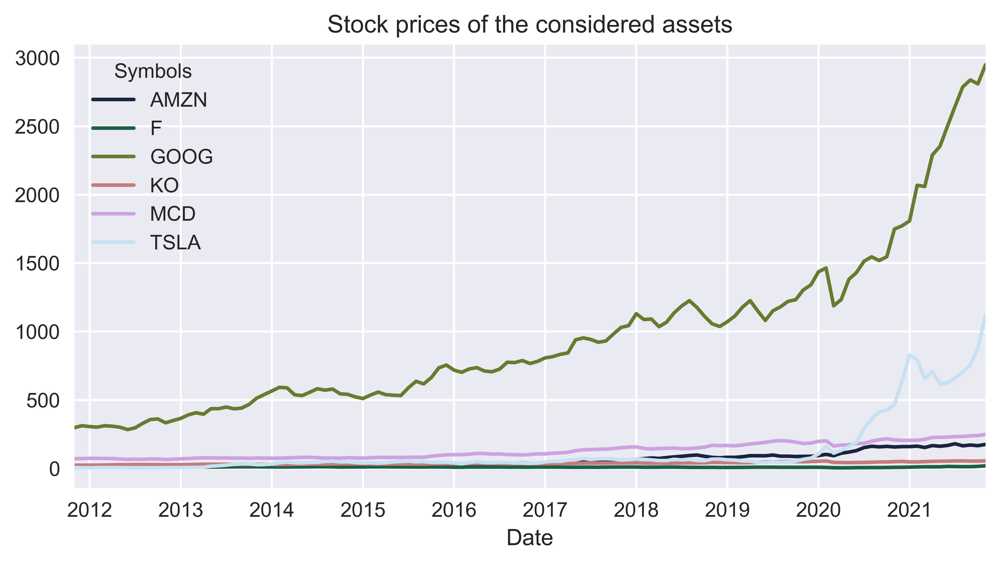

In [309]:
prices_df = web.get_data_yahoo(risky_assets, start_date, end_date)
prices_df=prices_df.groupby(pd.Grouper(freq='M')).mean()
print(f'Downloaded {prices_df.shape[0]} rows of data.')
prices_df['Adj Close'].plot(title='Stock prices of the considered assets');

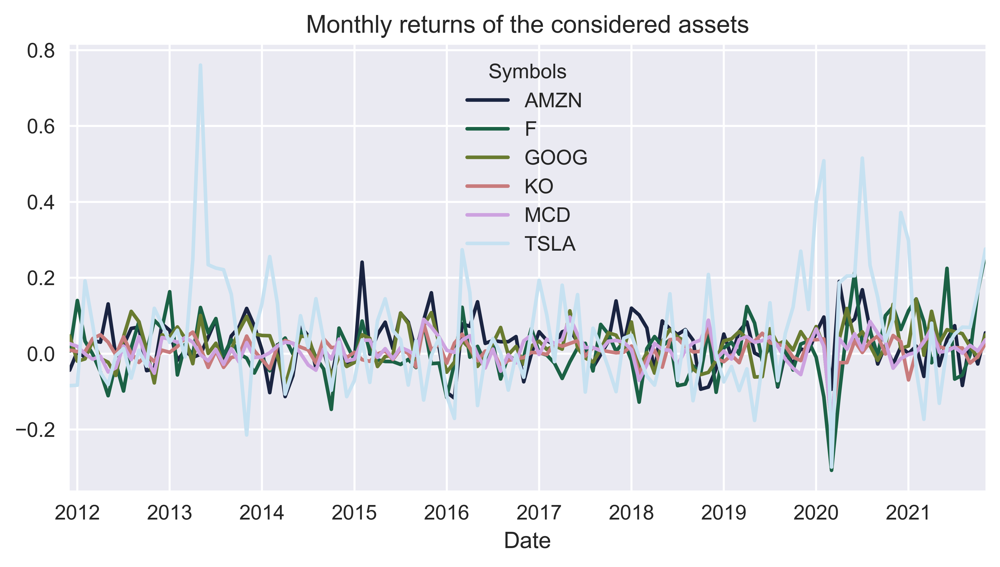

In [310]:
#calcolo rendimenti e volatilità 
returns_df = prices_df['Adj Close'].pct_change().dropna()
avg_returns = returns_df.mean() * n_months
cov_mat = returns_df.cov() * n_months
returns_df.plot(title='Monthly returns of the considered assets');

In [311]:
#simulo portafogli con pesi casuali
np.random.seed(42)
weights = np.random.random(size=(n_port, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]

In [312]:
#calcolo rendimenti del portafoglio
portf_rtns = np.dot(weights, avg_returns)

portf_vol = []
for i in range(0, len(weights)):
    portf_vol.append(np.sqrt(np.dot(weights[i].T, 
                                    np.dot(cov_mat, weights[i]))))
portf_vol = np.array(portf_vol)  
portf_sharpe_ratio = portf_rtns / portf_vol

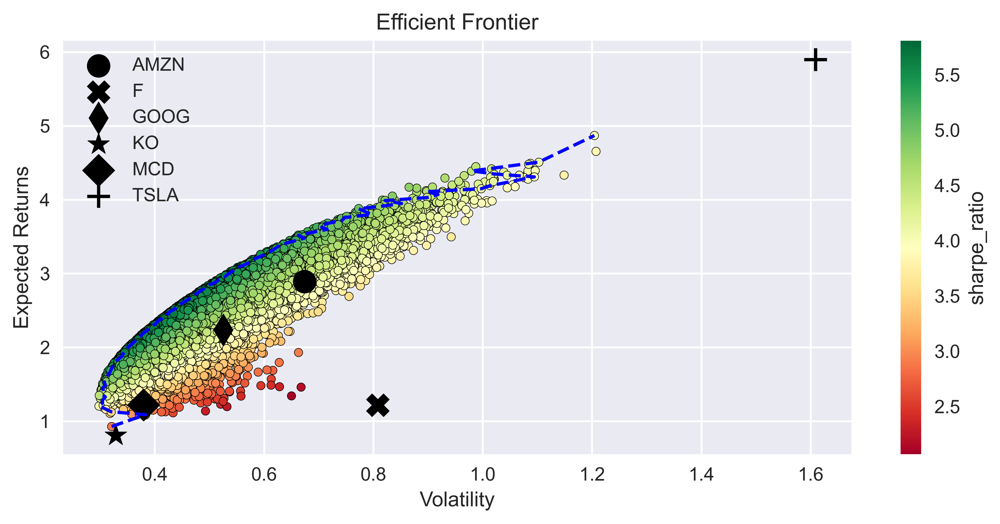

In [313]:
#creo un df con tutti i dati
portf_results_df = pd.DataFrame({'returns': portf_rtns,
                                 'volatility': portf_vol,
                                 'sharpe_ratio': portf_sharpe_ratio})

#creo la frontiera efficiente
n_points = 100
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                            portf_results_df.returns.max(), 
                           n_points)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(n_points):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
    
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)



MARKS = ['o', 'X', 'd', '*', 'D', '+']

fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=risky_assets[asset_index])
ax.legend()

plt.tight_layout()
plt.show()


In [314]:
#cerco portfolio con indice sharpe più alto
max_sharpe_ind = np.argmax(portf_results_df.sharpe_ratio)
max_sharpe_portf = portf_results_df.loc[max_sharpe_ind]

min_vol_ind = np.argmin(portf_results_df.volatility)
min_vol_portf = portf_results_df.loc[min_vol_ind]


print('Maximum Sharpe Ratio portfolio')
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(risky_assets, weights[np.argmax(portf_results_df.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)


Maximum Sharpe Ratio portfolio
Performance
returns: 230.79% volatility: 39.73% sharpe_ratio: 580.97% 
Weights
AMZN: 27.08% F: 0.02% GOOG: 21.45% KO: 20.52% MCD: 20.21% TSLA: 10.71% 

In [315]:
print('Minimum Volatility portfolio ----')
print('Performance')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(risky_assets, weights[np.argmin(portf_results_df.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Minimum Volatility portfolio ----
Performance
returns: 120.67% volatility: 29.79% sharpe_ratio: 405.03% 
Weights
AMZN: 11.00% F: 2.19% GOOG: 4.87% KO: 73.21% MCD: 7.58% TSLA: 1.15% 

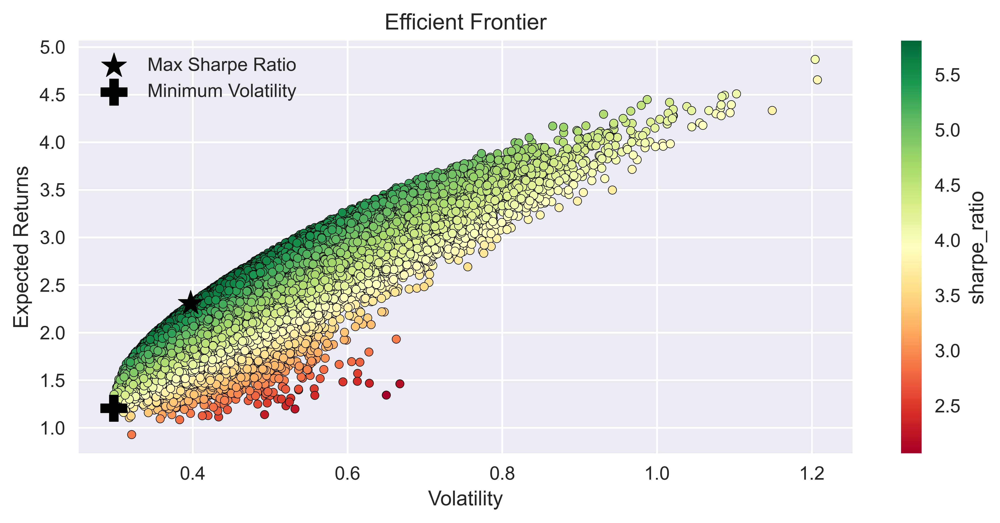

In [316]:
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.scatter(x=max_sharpe_portf.volatility, 
           y=max_sharpe_portf.returns, 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')
ax.scatter(x=min_vol_portf.volatility, 
           y=min_vol_portf.returns, 
           c='black', marker='P', 
           s=200, label='Minimum Volatility')
ax.set(xlabel='Volatility', ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.legend()

plt.tight_layout()

plt.show()

metodo analitico

In [317]:
#metodo analitico
import scipy.optimize as sco
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))

def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    
    efficient_portfolios = []
    
    n_assets = len(avg_returns)
    args = (avg_returns, cov_mat)
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = ({'type': 'eq', 
                        'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
                       {'type': 'eq', 
                        'fun': lambda x: np.sum(x) - 1})
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                           args=args, method='SLSQP', 
                                           constraints=constraints,
                                           bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
    
    return efficient_portfolios

rtns_range = np.linspace(-0.22, 0.32, 200)
efficient_portfolios = get_efficient_frontier(avg_returns, 
                                              cov_mat, 
                                              rtns_range)
vols_range = [x['fun'] for x in efficient_portfolios]

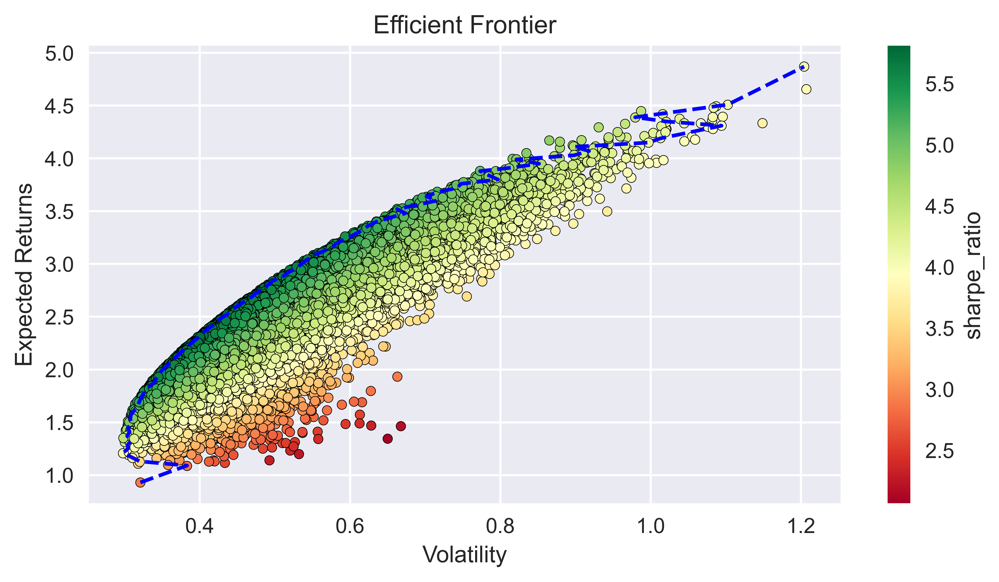

In [318]:
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')

plt.show()

In [319]:
#portafoglio con minima volatilità
min_vol_ind = np.argmin(vols_range)
min_vol_portf_rtn = rtns_range[min_vol_ind]
min_vol_portf_vol = efficient_portfolios[min_vol_ind]['fun']

min_vol_portf = {'Return': min_vol_portf_rtn,
                 'Volatility': min_vol_portf_vol,
                 'Sharpe Ratio': (min_vol_portf_rtn / 
                                  min_vol_portf_vol)}


In [320]:

print('Minimum Volatility portfolio ----')
print('Performance')

for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(risky_assets, efficient_portfolios[min_vol_ind]['x']):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Minimum Volatility portfolio ----
Performance
Return: 20.87% Volatility: 32.85% Sharpe Ratio: 63.54% 
Weights
AMZN: 0.00% F: 0.00% GOOG: 0.00% KO: 100.00% MCD: 0.00% TSLA: 0.00% 

In [321]:

#ricerca del portafoglio ottimale col massimo Sharpe ratio
def neg_sharpe_ratio(w, avg_rtns, cov_mat, rf_rate):
    portf_returns = np.sum(avg_rtns * w)
    portf_volatility = np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
    portf_sharpe_ratio = (portf_returns - rf_rate) / portf_volatility
    return -portf_sharpe_ratio

n_assets = len(avg_returns)
RF_RATE = 0

args = (avg_returns, cov_mat, RF_RATE)
constraints = ({'type': 'eq', 
                'fun': lambda x: np.sum(x) - 1})
bounds = tuple((0,1) for asset in range(n_assets))
initial_guess = n_assets * [1. / n_assets]

max_sharpe_portf = sco.minimize(neg_sharpe_ratio, 
                                x0=initial_guess, 
                                args=args,
                                method='SLSQP', 
                                bounds=bounds, 
                                constraints=constraints)
max_sharpe_portf_w = max_sharpe_portf['x']
max_sharpe_portf = {'Return': get_portf_rtn(max_sharpe_portf_w, 
                                            avg_returns),
                    'Volatility': get_portf_vol(max_sharpe_portf_w, 
                                                avg_returns, 
                                                cov_mat),
                    'Sharpe Ratio': -max_sharpe_portf['fun']}
print('---------Maximum Sharpe Ratio portfolio ---------')
print('Performance')

for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(risky_assets, max_sharpe_portf_w):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

---------Maximum Sharpe Ratio portfolio ---------
Performance
Return: 236.94% Volatility: 40.73% Sharpe Ratio: 581.75% 
Weights
AMZN: 28.03% F: 0.00% GOOG: 22.11% KO: 13.32% MCD: 25.62% TSLA: 10.91% 

In [322]:
#metodo di simulazione
#portafoglio ottimale metodo monte carlo - simulazione
w = []
for x, y in zip(risky_assets, weights[np.argmax(portf_results_df.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    w.append(round(y, 4))

#calcolo il ritorno del portafoglio
port_ret = (returns_df * w).sum(axis = 1)

#prendo l'indice di mercato e ne calcolo i ritorni
benchmark_price = web.get_data_yahoo('^GSPC', start = '2011-11-30', end = '2021-11-30')
benchmark_price=benchmark_price.groupby(pd.Grouper(freq='M')).mean()
benchmark_ret = benchmark_price["Adj Close"].pct_change()[1:]

AMZN: 27.08% F: 0.02% GOOG: 21.45% KO: 20.52% MCD: 20.21% TSLA: 10.71% 

In [323]:
benchmark_ret.values

array([-0.00291678,  0.04605012,  0.03991263,  0.027174  , -0.00202342,
       -0.0325702 , -0.01326235,  0.02742149,  0.03211709,  0.02848072,
       -0.00388162, -0.03011808,  0.019916  ,  0.0408566 ,  0.02155934,
        0.02546923,  0.01281462,  0.04401882, -0.01284892,  0.03082763,
        0.00084989,  0.01022689,  0.01947223,  0.03692645,  0.01358771,
        0.00806595, -0.00292035,  0.02558487,  0.0003971 ,  0.01368037,
        0.03033203,  0.01335963, -0.0058629 ,  0.01615792, -0.02807099,
        0.05538594,  0.00474146, -0.01269935,  0.0266334 , -0.00105915,
        0.00715023,  0.0081536 , -0.00599441, -0.00244847, -0.02591867,
       -0.04679906,  0.04135478,  0.02755997, -0.01275436, -0.06595736,
       -0.0073905 ,  0.06171732,  0.02649968, -0.00481069,  0.00887942,
        0.03119674,  0.0132999 , -0.00908903, -0.00679895,  0.01024943,
        0.03771081,  0.01267986,  0.02408429,  0.01584251, -0.00317418,
        0.01527414,  0.0161311 ,  0.00826507,  0.00086409,  0.01

In [324]:
port_ret.values

array([-0.00350187, -0.00651333,  0.01591337,  0.03002072,  0.00911434,
        0.01841528, -0.02295811,  0.03005815,  0.03221391,  0.04230439,
       -0.01661112, -0.0292906 ,  0.05061607,  0.03775087,  0.02682631,
        0.02715071,  0.0359754 ,  0.10537714,  0.02575692,  0.05853309,
       -0.00272114,  0.03248874,  0.02671014,  0.045782  ,  0.03628437,
        0.02199721,  0.0020379 ,  0.02732818, -0.04714329, -0.01140851,
        0.04356432,  0.02039949, -0.01222948,  0.01994054, -0.04072652,
        0.02207346, -0.0338122 , -0.0200053 ,  0.08382162,  0.00333446,
        0.01351339,  0.04051199,  0.00339846,  0.06157971,  0.03234403,
       -0.00952979,  0.06119754,  0.08222747,  0.02920107, -0.05335767,
       -0.04837628,  0.07589284,  0.05231695,  0.01063483, -0.00148136,
        0.02357609,  0.0073594 , -0.00645666,  0.00826688, -0.02788423,
        0.02134217,  0.04345105,  0.0300241 ,  0.01936232,  0.04895119,
        0.07085408,  0.04515215, -0.00648309, -0.00091882,  0.00

In [325]:
len(benchmark_ret)

120

In [326]:
len(port_ret)

120

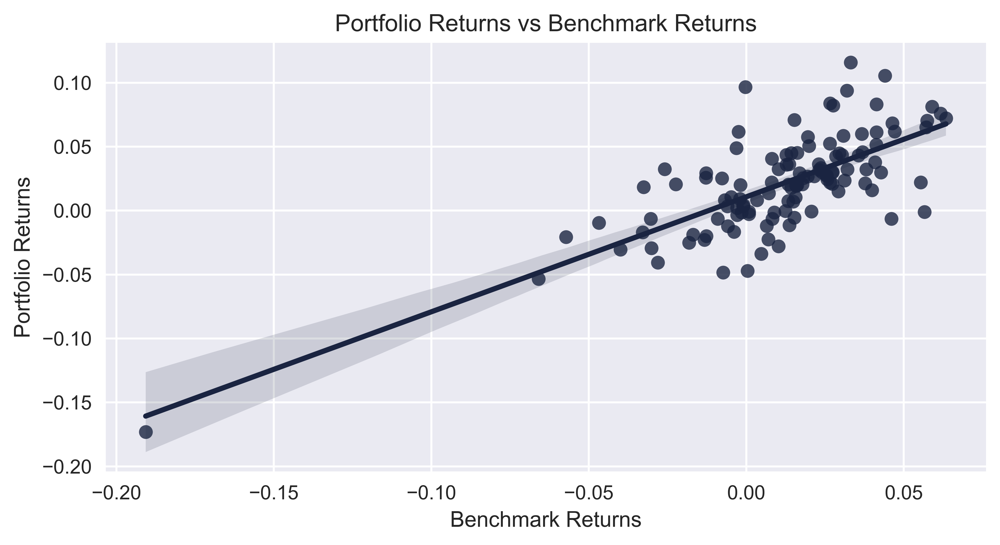

In [327]:
#stampo il grafico della correlazione tra il ritorno del mercato e il ritorno del portafoglio

sns.regplot(benchmark_ret.values, port_ret.values)
plt.xlabel("Benchmark Returns")
plt.ylabel("Portfolio Returns")
plt.title("Portfolio Returns vs Benchmark Returns")
plt.show()

In [328]:
#stimo il beta del portafoglio usando la regressione lineare
from scipy import stats
(beta, alpha) = stats.linregress(benchmark_ret.values, port_ret.values)[0:2]
print('Beta of optimized portfolio with Monte Carlo:', round(beta, 4))

Beta of optimized portfolio with Monte Carlo: 0.8993


metodo di simulazione Monte Carlo, ottimizzazione con i rendimenti passati

In [329]:
returns=rends_df.copy()
number_of_portfolios = 40000 #numero di simulazioni

means = returns.mean() * 12
mat_cov = returns.cov()*12
means

TSLA_rends    0.649427
FORD_rends    0.135950
MCD_rends     0.133548
KO_rends      0.087617
AMZN_rends    0.318339
GOOG_rends    0.246230
dtype: float64

In [330]:
returns

,TSLA_rends,FORD_rends,MCD_rends,KO_rends,AMZN_rends,GOOG_rends
Date,,,,,,
2011-12-31,-0.084301,0.007008,0.026442,0.009491,-0.043456,0.046628
2012-01-31,-0.083055,0.140146,0.019167,0.005487,0.005949,-0.019845
2012-02-29,0.191779,0.032982,-0.000701,0.005283,-0.009647,-0.013811
2012-03-31,0.075664,-0.001397,-0.014630,0.035000,0.034332,0.034426
2012-04-30,-0.049542,-0.048105,-0.006481,0.046955,0.030377,-0.012501
...,...,...,...,...,...,...
2021-07-31,0.051387,-0.066962,0.017292,0.016171,0.073724,0.058124
2021-08-31,0.069953,-0.056473,0.001142,0.014897,-0.083819,0.052751
2021-09-30,0.069067,-0.002388,0.021950,-0.024717,0.034491,0.018386


In [331]:
returns.columns

Index(['TSLA_rends', 'FORD_rends', 'MCD_rends', 'KO_rends', 'AMZN_rends',
       'GOOG_rends'],
      dtype='object')

In [332]:
portfolio_returnsm = []
portfolio_risks = []
sharpe_ratios = []
portfolio_weightsm = []

for portfolio in range(number_of_portfolios):
    weights = np.random.random_sample(len(returns.columns))
    weights =np.round((weights / np.sum(weights)), 3)
    portfolio_weightsm.append(weights)
    annualized_return = np.sum(means * weights)
    portfolio_returnsm.append(annualized_return)
    portfolio_variance = np.dot(weights.T, np.dot(mat_cov, weights))
    portfolio_standard_deviation = np.sqrt(portfolio_variance)
    portfolio_risks.append(portfolio_standard_deviation)
    sharpe_ratio = (annualized_return - rf) / portfolio_standard_deviation
    sharpe_ratios.append(sharpe_ratio)
    
portfolio_returnsm = np.array(portfolio_returnsm)
portofolio_risks = np.array(portfolio_risks)
sharpe_ratios = np.array(sharpe_ratios)   

#portfoglio metrics

portfolio_metrics = [portfolio_returnsm, portfolio_risks, sharpe_ratios, portfolio_weightsm]
portfolios_df = pd.DataFrame(portfolio_metrics).T
portfolios_df.columns = ['Return', 'Risk', 'Sharpe', 'Weights']

min_risk = portfolios_df.iloc[portfolios_df['Risk'].astype(float).idxmin()]
highest_return = portfolios_df.iloc[portfolios_df['Return'].astype(float).idxmax()]
highest_sharpe = portfolios_df.iloc[portfolios_df['Sharpe'].astype(float).idxmax()]


In [333]:

print('Lowest risk')
print(min_risk)
print(list(returns))
min_risk.to_excel('min_risk.xlsx', sheet_name='Lowest risk', startrow=0)

print('')

print('Highest return')
print(highest_return)
print(list(returns))
highest_return.to_excel('high_ret.xlsx', sheet_name='Highest return', startrow=0)

print('')
      
print('Highest Sharpe ratio')
print(highest_sharpe)
highest_sharpe.to_excel('high_sharpe.xlsx', sheet_name='Highest Sharpe ', startrow=0)
print(list(returns))

print('')


Lowest risk
Return                                       0.133621
Risk                                         0.098763
Sharpe                                       1.348367
Weights    [0.001, 0.024, 0.329, 0.493, 0.068, 0.085]
Name: 11835, dtype: object
['TSLA_rends', 'FORD_rends', 'MCD_rends', 'KO_rends', 'AMZN_rends', 'GOOG_rends']

Highest return
Return                                       0.523516
Risk                                         0.396288
Sharpe                                       1.319909
Weights    [0.724, 0.016, 0.118, 0.015, 0.039, 0.088]
Name: 6734, dtype: object
['TSLA_rends', 'FORD_rends', 'MCD_rends', 'KO_rends', 'AMZN_rends', 'GOOG_rends']

Highest Sharpe ratio
Return                                       0.264119
Risk                                          0.13737
Sharpe                                       1.919397
Weights    [0.105, 0.005, 0.305, 0.066, 0.287, 0.233]
Name: 35686, dtype: object
['TSLA_rends', 'FORD_rends', 'MCD_rends', 'KO_rends', 'AMZ

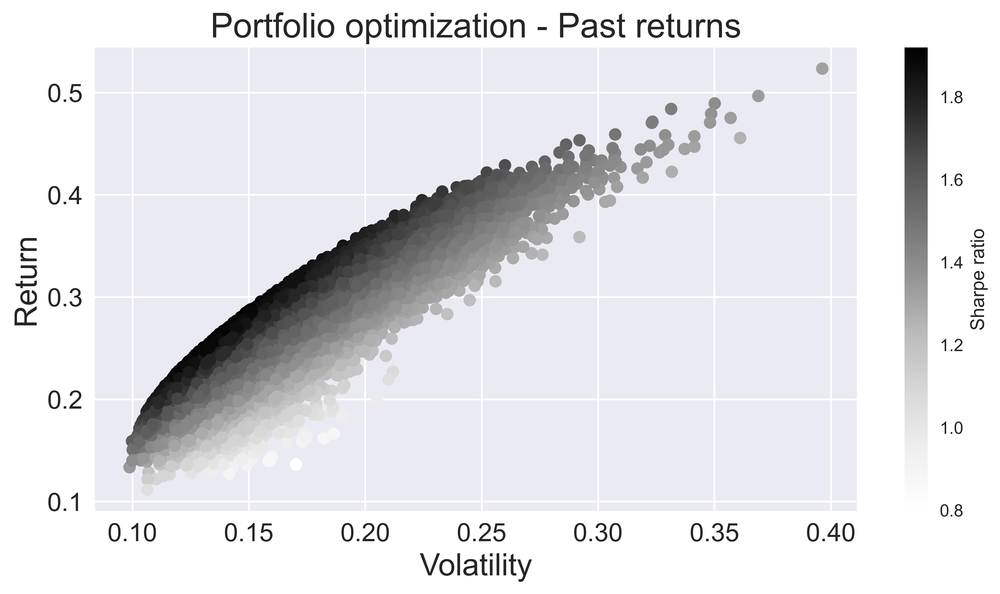

In [334]:
plt.figure(figsize = (10,5))
plt.scatter(portfolio_risks, portfolio_returnsm, 
           c = (portfolio_returnsm - rf)/ portfolio_risks)
plt.title('Portfolio optimization - Past returns', fontsize = 20)
plt.xlabel('Volatility', fontsize = 18)
plt.ylabel('Return', fontsize = 18)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.colorbar(label = 'Sharpe ratio')
plt.show()

ottimizzazione Monte Carlo con i rendimenti attesi ottenuti in precedenza nel punto 5

In [335]:
#ritorni annualizzati
d={'AMZN':yearly_returna, 'GOOG':yearly_returng, 'TSLA':yearly_returnt,
   'F':yearly_returnf, 'KO':yearly_returnk, 'MCD':yearly_returnm}
means_exp = pd.Series(data=d, index=['AMZN', 'GOOG', 'TSLA', 'F', 'KO', 'MCD'])
means_exp

AMZN    0.195704
GOOG    0.163975
TSLA    0.287850
F       0.177178
KO      0.110230
MCD     0.101010
dtype: float64

In [336]:

portfolio_returnsm = []
portfolio_risks = []
sharpe_ratios = []
portfolio_weights = []
rf_exp = -0.005

for portfolio in range(number_of_portfolios):
    weights = np.random.random_sample(len(returns.columns))
    weights =np.round((weights / np.sum(weights)), 3)
    portfolio_weights.append(weights)
    annualized_return = np.sum(means_exp * weights)
    portfolio_returnsm.append(annualized_return)
    portfolio_variance = np.dot(weights.T, np.dot(mat_cov, weights)) #
    portfolio_standard_deviation = np.sqrt(portfolio_variance)
    portfolio_risks.append(portfolio_standard_deviation)
    sharpe_ratio = (annualized_return - rf_exp) / portfolio_standard_deviation 
    sharpe_ratios.append(sharpe_ratio)


In [337]:
portfolio_returnsm = np.array(portfolio_returnsm)
portofolio_risks = np.array(portfolio_risks)
sharpe_ratios = np.array(sharpe_ratios)

In [338]:
#portfoglio metrics

portfolio_metrics = [portfolio_returnsm, portfolio_risks, sharpe_ratios, portfolio_weights]
portfolios_df = pd.DataFrame(portfolio_metrics).T
portfolios_df.columns = ['Return', 'Risk', 'Sharpe', 'Weights']

min_risk = portfolios_df.iloc[portfolios_df['Risk'].astype(float).idxmin()]
highest_return = portfolios_df.iloc[portfolios_df['Return'].astype(float).idxmax()]
highest_sharpe = portfolios_df.iloc[portfolios_df['Sharpe'].astype(float).idxmax()]


In [339]:
print('Lowest risk')
print(min_risk)
print(list(returns))
min_risk.to_excel('min_risk_exp.xlsx', sheet_name='Lowest risk', startrow=0)

print('')

print('Highest return')
print(highest_return)
print(list(returns))
highest_return.to_excel('high_ret_exp.xlsx', sheet_name='Highest return', startrow=0)


print('')
      
print('Highest Sharpe ratio')
print(highest_sharpe)
highest_sharpe.to_excel('high_sharpe_exp.xlsx', sheet_name='Highest Sharpe ', startrow=0)
print(list(returns))

print('')


Lowest risk
Return                                      0.174799
Risk                                        0.099062
Sharpe                                      1.815009
Weights    [0.005, 0.05, 0.129, 0.583, 0.169, 0.065]
Name: 37547, dtype: object
['TSLA_rends', 'FORD_rends', 'MCD_rends', 'KO_rends', 'AMZN_rends', 'GOOG_rends']

Highest return
Return                                      0.259454
Risk                                        0.118241
Sharpe                                      2.236567
Weights    [0.003, 0.061, 0.82, 0.009, 0.057, 0.049]
Name: 31732, dtype: object
['TSLA_rends', 'FORD_rends', 'MCD_rends', 'KO_rends', 'AMZN_rends', 'GOOG_rends']

Highest Sharpe ratio
Return                                      0.259454
Risk                                        0.118241
Sharpe                                      2.236567
Weights    [0.003, 0.061, 0.82, 0.009, 0.057, 0.049]
Name: 31732, dtype: object
['TSLA_rends', 'FORD_rends', 'MCD_rends', 'KO_rends', 'AMZN_rends', '

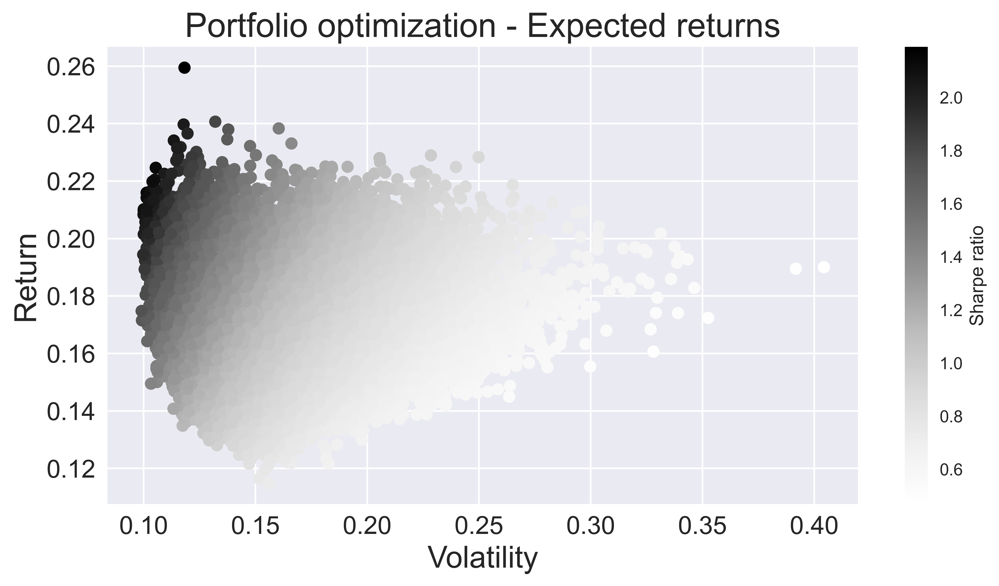

In [340]:
plt.figure(figsize = (10,5))
plt.scatter(portfolio_risks, portfolio_returnsm, 
           c = (portfolio_returnsm - rf)/ portfolio_risks)
plt.title('Portfolio optimization - Expected returns', fontsize = 20)
plt.xlabel('Volatility', fontsize = 18)
plt.ylabel('Return', fontsize = 18)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.colorbar(label = 'Sharpe ratio')
plt.show()

## 6b) beta per il portafoglio

In [341]:
#Ottimale metodo scipy - analitico
#stampo i pesi
w2 = []
for x, y in zip(risky_assets, max_sharpe_portf_w):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    w2.append(round(y, 4))
            

#Ritorno del portafoglio
port_ret2 = (returns_df * w2).sum(axis = 1)

AMZN: 28.03% F: 0.00% GOOG: 22.11% KO: 13.32% MCD: 25.62% TSLA: 10.91% 

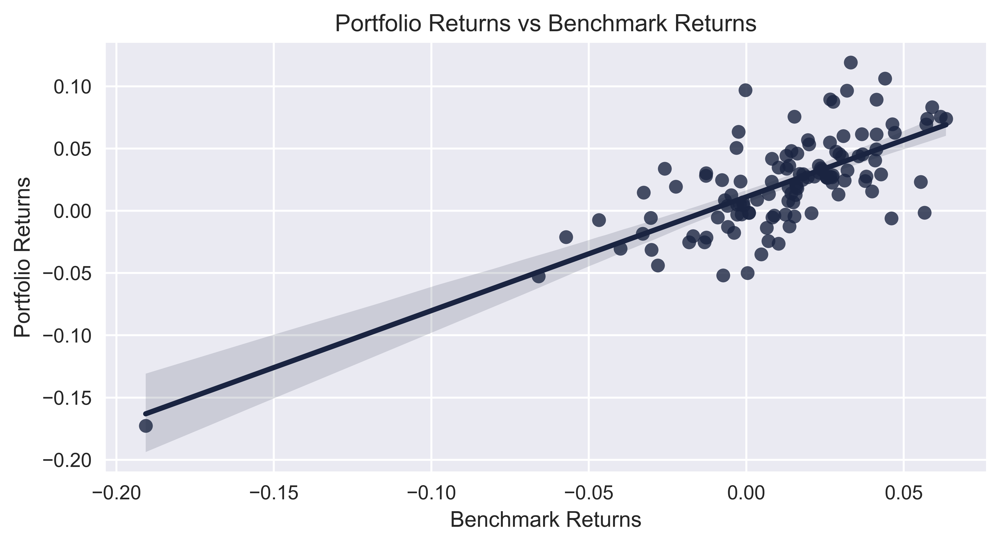

In [342]:
#Correlazione tra il ritorno di mercato e il ritorno del poratfoglio
sns.regplot(benchmark_ret.values,
port_ret2.values)
plt.xlabel("Benchmark Returns")
plt.ylabel("Portfolio Returns")
plt.title("Portfolio Returns vs Benchmark Returns")
plt.show()

In [343]:
#stimo il beta usando la regressione lineare
(beta2, alpha) = stats.linregress(benchmark_ret.values,  port_ret2.values)[0:2]
print('Beta of optimized portoflio with Scipy compared to market is: ' , round(beta2, 4))

Beta of optimized portoflio with Scipy compared to market is:  0.9138


beta del portafoglio effettivo

In [344]:
beta_effettivo=beta_tsla*0.1667+beta_mcd*0.1667+beta_ko*0.1667+beta_ford*0.1667+beta_goog*0.1667+beta_amzn*0.1667
print('Beta of effective portoflio compared to market is: ' , round(beta_effettivo, 4))

Beta of effective portoflio compared to market is:  1.0743


## 6c) contronto rendimento del portafoglio ottimale (costruito con il metodo analitico) e quello effettivo (con tutti pesi uguali) 

Il rendimento di un portafoglio è ottenuto come media dei rendimenti dei titoli ponderati per i pesi 
generati dalla simulazione.

In [345]:
#portafoglio ottimale metodo simulazione - monte carlo
#uso il metodo .dot per fare prodotto di vettori
e_r = returns_df.mean()
print('Rendimento del portafoglio con simulazione Monte Carlo:')
print('Expected return: ', round(np.dot(w, e_r), 4), ' Pesi: ', np.around(w,4))
print('                                   AMZN     F     GOOG     KO    MCD     TSLA')

Rendimento del portafoglio con simulazione Monte Carlo:
Expected return:  0.0212  Pesi:  [2.708e-01 2.000e-04 2.145e-01 2.052e-01 2.021e-01 1.071e-01]
                                   AMZN     F     GOOG     KO    MCD     TSLA


In [346]:
#portafoglio ottimale metodo analitico - scipy

print('Rendimento del portafoglio con metodo analitico Scipy: ')
print('Expected return: ', round(np.dot(w2, e_r), 4), ' Pesi: ', np.around(w2,4))
print('                                   AMZN     F     GOOG     KO    MCD     TSLA')

Rendimento del portafoglio con metodo analitico Scipy: 
Expected return:  0.0217  Pesi:  [0.2803 0.     0.2211 0.1332 0.2562 0.1091]
                                   AMZN     F     GOOG     KO    MCD     TSLA


In [347]:
#portafoglio effettivo


print('Rendimento del portafoglio Effettivo (tutti pesi uguali): ')
w_eff = [1/6, 1/6, 1/6, 1/6, 1/6, 1/6]
print('Expected return: ', round(np.dot(w_eff, e_r), 4), ' Pesi: ', np.around(w_eff,4))
print('                                   AMZN     F     GOOG     KO    MCD     TSLA')


Rendimento del portafoglio Effettivo (tutti pesi uguali): 
Expected return:  0.0218  Pesi:  [0.1667 0.1667 0.1667 0.1667 0.1667 0.1667]
                                   AMZN     F     GOOG     KO    MCD     TSLA
